# Importing Dataset

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
# Demographic Dataset
!wget https://cdn.upgrad.com/UpGrad/temp/a790b665-7819-4490-87d9-b046340095fd/Demographic%20data.csv

--2019-12-03 08:49:04--  https://cdn.upgrad.com/UpGrad/temp/a790b665-7819-4490-87d9-b046340095fd/Demographic%20data.csv
Resolving cdn.upgrad.com (cdn.upgrad.com)... 13.224.227.3, 13.224.227.60, 13.224.227.33, ...
Connecting to cdn.upgrad.com (cdn.upgrad.com)|13.224.227.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4131839 (3.9M) [application/octet-stream]
Saving to: ‘Demographic data.csv’

Demographic data.cs 100%[===================>]   3.94M  3.33MB/s    in 1.2s    

2019-12-03 08:49:06 (3.33 MB/s) - ‘Demographic data.csv’ saved [4131839/4131839]



In [0]:
# Credit Bureau Datset
!wget https://cdn.upgrad.com/UpGrad/temp/3fa11a2f-f702-45e4-a7fd-17110148588d/Credit%20Bureau%20data.csv

--2019-12-03 08:49:07--  https://cdn.upgrad.com/UpGrad/temp/3fa11a2f-f702-45e4-a7fd-17110148588d/Credit%20Bureau%20data.csv
Resolving cdn.upgrad.com (cdn.upgrad.com)... 13.224.227.3, 13.224.227.60, 13.224.227.33, ...
Connecting to cdn.upgrad.com (cdn.upgrad.com)|13.224.227.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3789036 (3.6M) [application/octet-stream]
Saving to: ‘Credit Bureau data.csv’

Credit Bureau data. 100%[===================>]   3.61M  --.-KB/s    in 0.1s    

2019-12-03 08:49:07 (31.2 MB/s) - ‘Credit Bureau data.csv’ saved [3789036/3789036]



In [0]:
!pip install matplotlib==3.1.0

     |████████████████████████████████| 13.1MB 77kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: matplotlib 3.1.2
    Uninstalling matplotlib-3.1.2:
      Successfully uninstalled matplotlib-3.1.2


In [0]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
from sklearn.metrics import roc_auc_score,roc_curve,scorer, auc
from sklearn.metrics import f1_score
from sklearn import metrics
from imblearn.metrics import sensitivity_specificity_support

import statsmodels.api as sm
from sklearn.metrics import precision_score,recall_score
from yellowbrick.classifier import DiscriminationThreshold
from sklearn.linear_model import LogisticRegression
from pprint import pprint

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
from graphviz import Source
from IPython.display import SVG,display

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
import lightgbm as lgb
from sklearn.ensemble import GradientBoostingClassifier
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 12, 4


pd.set_option('display.max_rows', 300)

import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


In [0]:
credit_full_woe = pd.read_csv('/content/drive/My Drive/credit_full_woe.csv')
credit_full = pd.read_csv('/content/drive/My Drive/credit_full.csv')


credit_partial_woe = pd.read_csv('/content/drive/My Drive/credit_partial_woe.csv')
credit_delta_woe = pd.read_csv('/content/drive/My Drive/credit_delta_woe.csv')

In [0]:
demo_full_woe = pd.read_csv('/content/drive/My Drive/demo_full_woe.csv')
demo_full = pd.read_csv('/content/drive/My Drive/demo_full.csv')


demo_partial_woe = pd.read_csv('/content/drive/My Drive/demo_partial_woe.csv')
demo_delta_woe = pd.read_csv('/content/drive/My Drive/demo_delta_woe.csv')

In [0]:
master_df = pd.read_csv('/content/drive/My Drive/master_df.csv')
master_delta_df = pd.read_csv('/content/drive/My Drive/master_delta_df.csv')

In [0]:
def bank_risk_prediction_cutoff(algorithm,training_x,testing_x,
                             training_y,testing_y,cutoff, cols, all_nulls = False):
  
  # training_x = training_x[cols]
  # testing_x = testing_x[cols]

  #model
  algorithm.fit(training_x,training_y)
  # predictions   = algorithm.predict(testing_x)
  # probabilities = algorithm.predict_proba(testing_x)
  
  
  #predicting on train
  y_train_pred = algorithm.predict_proba(training_x)[:,1]
  train_pred = pd.DataFrame({'Actual':training_y,'Converted_Prob':y_train_pred})
  train_pred['predicted'] = train_pred.Converted_Prob.map(lambda x: 1 if x > cutoff else 0)
  
  #Predicting on test
  y_test_pred = algorithm.predict_proba(testing_x)[:,1]
  test_pred = pd.DataFrame({'Actual':testing_y,'Converted_Prob':y_test_pred})
  test_pred['predicted'] = test_pred.Converted_Prob.map(lambda x: 1 if x > cutoff else 0)

  # check sensitivity and specificity Train
  sensitivity, specificity, _ = sensitivity_specificity_support(train_pred.Actual, train_pred['predicted'], average='binary')
  print("Sensitivity (trainset): ", round(sensitivity, 2), "\t", "Specificity (trainset): ", round(specificity, 2), sep='')

  # check sensitivity and specificity Test
  sensitivity, specificity, _ = sensitivity_specificity_support(test_pred.Actual, test_pred['predicted'], average='binary')
  print("Sensitivity (testset): ", round(sensitivity, 2), "\t", "Specificity (testset): ", round(specificity, 2), sep='')

  print('----'*30)

  print (algorithm)
  print ("\n Classification report (testset) : \n",classification_report(testing_y, test_pred['predicted']))

  print('----'*30)
  
  #Checking the accuracy
  train_accur = metrics.accuracy_score(train_pred.Actual,train_pred.predicted)
  print('Train Accuracy Score After Applying Cutoff: ',train_accur)
  test_accur = metrics.accuracy_score(test_pred.Actual,test_pred.predicted)
  print('Test Accuracy Score After Applying Cutoff: ',test_accur)

  print('----'*30)

  #confusion matrix train and plot
  conf_matrix_train = confusion_matrix(train_pred.Actual,train_pred.predicted)
  print('Train Confussion Matrix: ',conf_matrix_train)

  # ------Plotting Confussion Matrix for Model Performance for Train on the predictions based on cutoff------
  C = confusion_matrix(train_pred.Actual,train_pred.predicted)   
  A =(((C.T)/(C.sum(axis=1))).T)
  B =(C/C.sum(axis=0))
  plt.figure(figsize=(20,4))
  labels = ['Non-Default','Default']
  # representing A in heatmap format
  cmap=sns.light_palette("blue")
  plt.subplot(1, 3, 1)
  sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
  plt.xlabel('Predicted Class')
  plt.ylabel('True Class')
  plt.title("Confusion matrix (Train set)")
  plt.subplot(1, 3, 2)
  sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
  plt.xlabel('Predicted Class')
  plt.ylabel('True Class')
  plt.title("Precision matrix  (Train set)")
  plt.subplot(1, 3, 3)
  # representing B in heatmap format
  sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
  plt.xlabel('Predicted Class')
  plt.ylabel('Original Class')
  plt.title("Recall matrix  (Train set)") 
  plt.show()

  print('----'*30)
  
  #confusion matrix test and plot
  conf_matrix_test = confusion_matrix(test_pred.Actual,test_pred.predicted)
  print('Test Confussion Matrix: ',conf_matrix_test)

  # ------Plotting Confussion Matrix for Model Performance for Test on the predictions based on cutoff------
  C = confusion_matrix(test_pred.Actual,test_pred.predicted)   
  A =(((C.T)/(C.sum(axis=1))).T)
  B =(C/C.sum(axis=0))
  plt.figure(figsize=(20,4))
  labels = ['Non-Default','Default']
  # representing A in heatmap format
  cmap=sns.light_palette("blue")
  plt.subplot(1, 3, 1)
  sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
  plt.xlabel('Predicted Class')
  plt.ylabel('True Class')
  plt.title("Confusion matrix (Test set)")
  plt.subplot(1, 3, 2)
  sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
  plt.xlabel('Predicted Class')
  plt.ylabel('True Class')
  plt.title("Precision matrix  (Test set)")
  plt.subplot(1, 3, 3)
  # representing B in heatmap format
  sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
  plt.xlabel('Predicted Class')
  plt.ylabel('Original Class')
  plt.title("Recall matrix  (Test set)") 
  plt.show()

  print('----'*30)

  #### Printing the ROC Curve for Test Data
  #roc_auc_score
  if all_nulls == False:
    model_roc_auc = roc_auc_score(test_pred.Actual, test_pred['predicted']) 
    print ("Area under curve (testset): ", model_roc_auc,"\n")
    fpr,tpr,thresholds = roc_curve(test_pred.Actual, test_pred['predicted'])
    roc_auc = auc(fpr,tpr)

    # Plot ROC
    plt.title('Receiver Operating Characteristic(Cutoff Based)')
    plt.plot(fpr, tpr, 'b',label='AUC = %0.3f'% roc_auc)
    plt.legend(loc='lower right')
    plt.plot([0,1],[0,1],'r--')
    plt.xlim([-0.1,1.0])
    plt.ylim([-0.1,1.01])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    print('-----' *30)

In [0]:
def bank_risk_prediction(algorithm,training_x,testing_x,
                             training_y,testing_y,cols,cf,threshold_plot) :
    
    # training_x = training_x[cols]
    # testing_x = testing_x[cols]

    #model
    algorithm.fit(training_x,training_y)
    predictions_train   = algorithm.predict(training_x)
    probabilities_train = algorithm.predict_proba(training_x)
    predictions   = algorithm.predict(testing_x)
    probabilities = algorithm.predict_proba(testing_x)
    #coeffs
    if   cf == "coefficients" :
        coefficients  = pd.DataFrame(algorithm.coef_.ravel())
    elif cf == "features" :
        coefficients  = pd.DataFrame(algorithm.feature_importances_)
        
    column_df     = pd.DataFrame(cols)
    coef_sumry    = (pd.merge(coefficients,column_df,left_index= True,
                              right_index= True, how = "left"))
    coef_sumry.columns = ["coefficients","features"]
    coef_sumry    = coef_sumry.sort_values(by = "coefficients",ascending = False)
    
    print (algorithm)
    print ("\n Classification report : \n",classification_report(testing_y,predictions))
    print ("Accuracy   Score : ",accuracy_score(testing_y,predictions))
    #confusion matrix
    conf_matrix = confusion_matrix(testing_y,predictions)

    coef_sumry = coef_sumry.sort_values(by='coefficients',ascending=False) 
    s = sns.barplot(x='features',y='coefficients',data=coef_sumry)
    plt.title('Features importance',fontsize=14)
    s.set_xticklabels(s.get_xticklabels(),rotation=90)
    plt.show()
    print('-----' *30)

    #### Printing the ROC Curve for test Data
    #roc_auc_score
    model_roc_auc = roc_auc_score(testing_y, predictions) 
    print ("Area under curve (testset): ", model_roc_auc,"\n")
    fpr,tpr,thresholds = roc_curve(testing_y, predictions)
    roc_auc = auc(fpr,tpr)

    # Plot ROC
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b',label='AUC = %0.3f'% roc_auc)
    plt.legend(loc='lower right')
    plt.plot([0,1],[0,1],'r--')
    plt.xlim([-0.1,1.0])
    plt.ylim([-0.1,1.01])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    print('-----' *30)

    # ------Plotting Confussion Matrix for Model Performance ------
    C = confusion_matrix(testing_y, predictions)   
    A =(((C.T)/(C.sum(axis=1))).T)
    B =(C/C.sum(axis=0))
    plt.figure(figsize=(20,4))
    labels = ['Non-Default','Default']
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('True Class')
    plt.title("Confusion matrix")
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('True Class')
    plt.title("Precision matrix")
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix") 
    plt.show()

    # Calculations and plot of intersection of Sensitivity and Specificity

    y_train_pred = pd.DataFrame({'Predicted' : predictions_train, 'Actual' : y_train_Smote, 'probabilities' : probabilities_train[:,1]})
    # Finding optimal proba Cutoff
    # creating columns with different probability cutoffs 
    numbers = [float(x)/10 for x in range(10)]
    for i in numbers:
        y_train_pred[i]= y_train_pred.probabilities.map(lambda x: 1 if x > i else 0)
    # y_train_pred.head()
    cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi_recall','speci','precis','ppv','npv'])
    num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    for i in num:
      cm1 = metrics.confusion_matrix(y_train_pred.Actual, y_train_pred[i] )
      if cm1.shape != (2,2):
        l = [100,0,0,0]
        cm1 = np.reshape(l, (2,2))
      total1=sum(sum(cm1))
      accuracy = (cm1[0,0]+cm1[1,1])/total1
      speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
      sensi_recall = cm1[1,1]/(cm1[1,0]+cm1[1,1])
      precis = cm1[1,1]/(cm1[0,1]+cm1[1,1])
      ppv = cm1[1,1] /(cm1[1,1]+cm1[0,1])
      npv = cm1[0,0]/(cm1[0,0]+cm1[1,0])
      cutoff_df.loc[i] =[ i ,accuracy,sensi_recall,speci,precis,ppv,npv]
    print('---------'*7,'CUTOFF - DataFrame', '---------'*8)
    print(cutoff_df)
    print('---------'*30)
    # Let's plot accuracy sensitivity and specificity for various probabilities.
    cutoff_df.plot.line(x='prob', y=['accuracy','sensi_recall','speci', 'precis'],figsize=(10, 5))
    plt.show()



In [0]:
def grid_search(algorithm, training_x, training_y, p, folds):
  grid_search = GridSearchCV(estimator = algorithm, param_grid = p , scoring = 'f1', cv = folds, n_jobs = -1 , verbose = 2)
  grid_search = grid_search.fit(training_x , training_y)
  print(grid_search.best_score_)
  print(grid_search.best_params_)
  return grid_search

In [0]:
def iv_woe(data, target, bins=10, show_woe=False):
    
    #Empty Dataframe
    newDF,woeDF = pd.DataFrame(), pd.DataFrame()

    combined_df = pd.DataFrame()
    
    #Extract Column Names
    cols = data.columns
    
    #Run WOE and IV on all the independent variables
    for ivars in cols[~cols.isin([target])]:
        print(ivars)
        if (data[ivars].dtype.kind in 'bifc') and (len(np.unique(data[ivars]))>10):
            binned_x, edges = pd.qcut(data[ivars], bins,  duplicates='drop', retbins=True)
            d0 = pd.DataFrame({'x': binned_x, 'y': data[target]})
        else:
            d0 = pd.DataFrame({'x': data[ivars], 'y': data[target]})
        d = d0.groupby('x', as_index=False).agg({"y": ["count", "sum"]})
        d.columns = ['Cutoff', 'N', 'Events']
        d['% of Events'] = np.maximum(d['Events'], 0.5) / d['Events'].sum()
        d['Non-Events'] = d['N'] - d['Events']
        d['% of Non-Events'] = np.maximum(d['Non-Events'], 0.5) / d['Non-Events'].sum()
        d['WoE'] = np.log(d['% of Events']/d['% of Non-Events'])
        d['IV'] = d['WoE'] * (d['% of Events'] - d['% of Non-Events'])
        d.insert(loc=0, column='Variable', value=ivars)
        print("Information value of " + ivars + " is " + str(round(d['IV'].sum(),6)))
        temp =pd.DataFrame({"Variable" : [ivars], "IV" : [d['IV'].sum()]}, columns = ["Variable", "IV"])
        newDF=pd.concat([newDF,temp], axis=0)
        woeDF=pd.concat([woeDF,d], axis=0)

        #Show WOE Table
        if show_woe == True:
            print(d)
    return newDF, woeDF

In [0]:
def plot_decision_tree(X_train,X_test,y_train,y_test,columns,maximum_depth,criterion_type,class_weight,min_samples_leaf,min_samples_split,
                       split_type,model_performance = False, cut_off = False, all_nulls = False) :
    
    #separating dependent and in dependent variables
    dtc_x = X_train
    dtc_y = y_train
    
    #model
    dt_classifier = DecisionTreeClassifier(max_depth = maximum_depth,
                                           splitter  = split_type,
                                           criterion = criterion_type,
                                           class_weight=class_weight,
                                           min_samples_leaf=min_samples_leaf,
                                           min_samples_split=min_samples_split
                                          )
    dt_classifier.fit(dtc_x,dtc_y)
    
    #plot decision tree
    graph = Source(tree.export_graphviz(dt_classifier,out_file=None,
                                        rounded=True,proportion = False,
                                        feature_names = columns, 
                                        precision  = 2,
                                        class_names=["Not churn","Churn"],
                                        filled = True                         
                                       )
                  )
    
#     print(dt_classifier.score(X_test,y_test))
    clf_predicted=dt_classifier.predict(X_test)
    
    print(confusion_matrix(y_test,clf_predicted))

    if cut_off != False and all_nulls == False:
      bank_risk_prediction_cutoff(dt_classifier,dtc_x,X_test,dtc_y,y_test,cut_off,X_test.columns)

    if cut_off != False and all_nulls != False:
      bank_risk_prediction_cutoff(dt_classifier,dtc_x,X_test,dtc_y,y_test,cut_off,X_test.columns,all_nulls = True)
    
    #model performance
    if model_performance == True:
        bank_risk_prediction(dt_classifier,
                                 dtc_x,X_test,
                                 dtc_y,y_test,
                                 columns,"features",threshold_plot = True)
    display(graph)

In [0]:
def plot_tree_randomforest(X_train,X_test,y_train,y_test,columns,nf_estimators,max_features,
                           estimated_tree,maximum_depth,
                           criterion_type,class_weight,min_samples_leaf,min_samples_split,split_type,model_performance = False, cut_off = False, all_nulls = False) :
    
    #train and test datasets
    rf_x     = X_train
    rf_y     = y_train
    
    rfc   = RandomForestClassifier(n_estimators = nf_estimators,
                                   max_depth = maximum_depth,
                                   criterion = criterion_type,
                                   class_weight = class_weight,
                                   min_samples_leaf=min_samples_leaf,
                                   min_samples_split=min_samples_split,
                                   max_features = 10,
                                  )
    
    
    rfc.fit(rf_x,rf_y)
    
    estimated_tree = rfc.estimators_[estimated_tree]
    
    graph = Source(tree.export_graphviz(estimated_tree,out_file=None,
                                        rounded=True,proportion = False,
                            feature_names = columns, 
                            precision  = 2,
                            class_names=["Not churn","Churn"],
                            filled = True))

    if cut_off != False and all_nulls == False:
      bank_risk_prediction_cutoff(rfc,rf_x,X_test,rf_y,y_test,cut_off,X_test.columns)

    if cut_off != False and all_nulls != False:
      bank_risk_prediction_cutoff(rfc,rf_x,X_test,rf_y,y_test,cut_off,X_test.columns,all_nulls = True)
    
    #model performance
    if model_performance == True:
        bank_risk_prediction(rfc,
                                 rf_x,X_test,
                                 rf_y,y_test,
                                 columns,"features",threshold_plot = True)
    display(graph) 


# Performing Sanity Check On Demographic Dataset

In [0]:
demo = pd.read_csv('/content/Demographic data.csv')

FileNotFoundError: ignored

In [0]:
demo.head(5)

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [0]:
demo.shape

(71295, 12)

In [0]:
demo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71295 entries, 0 to 71294
Data columns (total 12 columns):
Application ID                                 71295 non-null int64
Age                                            71295 non-null int64
Gender                                         71293 non-null object
Marital Status (at the time of application)    71289 non-null object
No of dependents                               71292 non-null float64
Income                                         71295 non-null float64
Education                                      71176 non-null object
Profession                                     71281 non-null object
Type of residence                              71287 non-null object
No of months in current residence              71295 non-null int64
No of months in current company                71295 non-null int64
Performance Tag                                69870 non-null float64
dtypes: float64(3), int64(4), object(5)
memory usage: 6.5+ MB


In [0]:
# demo.duplicated().any()
demo[demo.duplicated(subset='Application ID')]

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag
27586,765011468,38,M,Married,4.0,4.5,Professional,SAL,Rented,6,72,0.0
42637,653287861,40,M,Married,5.0,32.0,Phd,SE,Rented,45,46,1.0
59022,671989187,57,M,Married,4.0,7.0,Professional,SE,Rented,42,3,0.0


* Analyzing Each of the Duplicate values found above

In [0]:
demo[demo['Application ID'] == 653287861]

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag
5243,653287861,26,M,Married,3.0,25.0,Bachelor,SAL,Rented,112,58,0.0
42637,653287861,40,M,Married,5.0,32.0,Phd,SE,Rented,45,46,1.0


In [0]:
demo[demo['Application ID'] == 765011468]

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag
24386,765011468,57,M,Single,4.0,4.5,Bachelor,SAL,Company provided,6,56,0.0
27586,765011468,38,M,Married,4.0,4.5,Professional,SAL,Rented,6,72,0.0


In [0]:
demo[demo['Application ID'] == 671989187]

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag
48602,671989187,27,M,Married,2.0,35.0,Professional,SAL,Living with Parents,108,7,0.0
59022,671989187,57,M,Married,4.0,7.0,Professional,SE,Rented,42,3,0.0


* In all of the above duplicate application_id, we will keep the ones which are more recent which can be identified with the Age of the Applicant.

In [0]:
# Capturing the index of the min Age so that it can be deleted from dataset.
id = demo[(demo['Application ID'] == 671989187)]['Age'].argmin()
demo.drop(id, inplace=True)

id = demo[(demo['Application ID'] == 765011468)]['Age'].argmin()
demo.drop(id, inplace=True)

id = demo[(demo['Application ID'] == 653287861)]['Age'].argmin()
demo.drop(id, inplace=True)

In [0]:
# No more duplicates found in the dataset
demo[demo.duplicated(subset='Application ID')]

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag


In [0]:
demo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 71292 entries, 0 to 71294
Data columns (total 12 columns):
Application ID                                 71292 non-null int64
Age                                            71292 non-null int64
Gender                                         71290 non-null object
Marital Status (at the time of application)    71286 non-null object
No of dependents                               71289 non-null float64
Income                                         71292 non-null float64
Education                                      71173 non-null object
Profession                                     71278 non-null object
Type of residence                              71284 non-null object
No of months in current residence              71292 non-null int64
No of months in current company                71292 non-null int64
Performance Tag                                69867 non-null float64
dtypes: float64(3), int64(4), object(5)
memory usage: 7.1+ MB


In [0]:
demo.describe()

,Application ID,Age,No of dependents,Income,No of months in current residence,No of months in current company,Performance Tag
count,7.129200e+04,71292.000000,71289.000000,71292.000000,71292.000000,71292.000000,69867.000000
mean,4.989518e+08,44.943654,2.865183,27.195464,34.561704,33.957751,0.042194
std,2.885936e+08,9.938906,1.382338,15.514689,36.758203,20.410308,0.201034
min,1.004500e+05,-3.000000,1.000000,-0.500000,6.000000,3.000000,0.000000
25%,2.483706e+08,37.000000,2.000000,14.000000,6.000000,16.000000,0.000000
50%,4.975655e+08,45.000000,3.000000,27.000000,11.000000,34.000000,0.000000
75%,7.495782e+08,53.000000,4.000000,40.000000,60.000000,51.000000,0.000000
max,1.000084e+09,65.000000,5.000000,60.000000,126.000000,133.000000,1.000000


In [0]:
# Null total in percent
round(100*(demo.isnull().sum()/demo.shape[0]),2)

Application ID                                 0.00
Age                                            0.00
Gender                                         0.00
Marital Status (at the time of application)    0.01
No of dependents                               0.00
Income                                         0.00
Education                                      0.17
Profession                                     0.02
Type of residence                              0.01
No of months in current residence              0.00
No of months in current company                0.00
Performance Tag                                2.00
dtype: float64

In [0]:
# Null total in count
demo.isnull().sum()

Application ID                                    0
Age                                               0
Gender                                            2
Marital Status (at the time of application)       6
No of dependents                                  3
Income                                            0
Education                                       119
Profession                                       14
Type of residence                                 8
No of months in current residence                 0
No of months in current company                   0
Performance Tag                                1425
dtype: int64

In [0]:
# Column Names Standardization
for i, val in enumerate(demo.columns):
  new_col = val.replace('(', '').replace(')', '')
  new_col = '_'.join(new_col.split())
  demo.rename(columns={val:new_col}, inplace =True)

In [0]:
# Updated Column Names
demo.columns

Index(['Application_ID', 'Age', 'Gender',
       'Marital_Status_at_the_time_of_application', 'No_of_dependents',
       'Income', 'Education', 'Profession', 'Type_of_residence',
       'No_of_months_in_current_residence', 'No_of_months_in_current_company',
       'Performance_Tag'],
      dtype='object')

# Performing Sanity Check On Credit Bureau Dataset

In [0]:
credit_df = pd.read_csv('/content/Credit Bureau data.csv')

In [0]:
credit_df.head(5)

,Application ID,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
0,954457215,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [0]:
credit_df.shape

(71295, 19)

In [0]:
credit_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71295 entries, 0 to 71294
Data columns (total 19 columns):
Application ID                                                     71295 non-null int64
No of times 90 DPD or worse in last 6 months                       71295 non-null int64
No of times 60 DPD or worse in last 6 months                       71295 non-null int64
No of times 30 DPD or worse in last 6 months                       71295 non-null int64
No of times 90 DPD or worse in last 12 months                      71295 non-null int64
No of times 60 DPD or worse in last 12 months                      71295 non-null int64
No of times 30 DPD or worse in last 12 months                      71295 non-null int64
Avgas CC Utilization in last 12 months                             70237 non-null float64
No of trades opened in last 6 months                               71294 non-null float64
No of trades opened in last 12 months                              71295 non-null int64
No of P

In [0]:
credit_df[credit_df.duplicated(subset='Application ID')]

,Application ID,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
27586,765011468,0,0,0,0,0,0,11.0,1.0,3,0,0,1,3,0.0,29817.0,6,0,0.0
42637,653287861,1,1,1,2,2,2,113.0,2.0,5,1,3,1,3,0.0,628075.0,6,0,1.0
59022,671989187,0,1,2,0,2,3,76.0,3.0,7,1,4,2,6,0.0,822298.0,7,0,0.0


In [0]:
credit_df[credit_df['Application ID'] == 653287861]

,Application ID,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
5243,653287861,0,0,0,0,0,0,15.0,0.0,0,0,0,0,0,0.0,10494.0,2,0,0.0
42637,653287861,1,1,1,2,2,2,113.0,2.0,5,1,3,1,3,0.0,628075.0,6,0,1.0


In [0]:
credit_df[credit_df['Application ID'] == 765011468]

,Application ID,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
24386,765011468,0,0,0,0,0,0,11.0,1.0,2,0,1,2,2,0.0,212656.0,3,0,0.0
27586,765011468,0,0,0,0,0,0,11.0,1.0,3,0,0,1,3,0.0,29817.0,6,0,0.0


In [0]:
credit_df[credit_df['Application ID'] == 671989187]

,Application ID,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
48602,671989187,1,2,3,2,2,3,63.0,2.0,6,1,4,3,5,0.0,806473.0,7,1,0.0
59022,671989187,0,1,2,0,2,3,76.0,3.0,7,1,4,2,6,0.0,822298.0,7,0,0.0


* In all of the above duplicate application ID. We will keep the ones which are more recent which can be identified with the Age of the Applicant. This is done based on Demographic Dataset.

In [0]:
# Capturing the index of the min Age so that it can be deleted from dataset.
# id = demo[(demo['Application ID'] == 671989187)]['Age'].argmin()
credit_df.drop(48602, inplace=True)

# id = demo[(demo['Application ID'] == 765011468)]['Age'].argmin()
credit_df.drop(27586, inplace=True)

# id = demo[(demo['Application ID'] == 653287861)]['Age'].argmin()
credit_df.drop(5243, inplace=True)

In [0]:
# No more duplicates found in the dataset
credit_df[credit_df.duplicated(subset='Application ID')]

,Application ID,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag


In [0]:
credit_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 71292 entries, 0 to 71294
Data columns (total 19 columns):
Application ID                                                     71292 non-null int64
No of times 90 DPD or worse in last 6 months                       71292 non-null int64
No of times 60 DPD or worse in last 6 months                       71292 non-null int64
No of times 30 DPD or worse in last 6 months                       71292 non-null int64
No of times 90 DPD or worse in last 12 months                      71292 non-null int64
No of times 60 DPD or worse in last 12 months                      71292 non-null int64
No of times 30 DPD or worse in last 12 months                      71292 non-null int64
Avgas CC Utilization in last 12 months                             70234 non-null float64
No of trades opened in last 6 months                               71291 non-null float64
No of trades opened in last 12 months                              71292 non-null int64
No of P

In [0]:
credit_df.describe()

,Application ID,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
count,7.129200e+04,71292.000000,71292.000000,71292.000000,71292.000000,71292.000000,71292.000000,70234.000000,71291.000000,71292.000000,71292.000000,71292.000000,71292.000000,71292.000000,71020.000000,7.102000e+04,71292.000000,71292.000000,69867.000000
mean,4.989518e+08,0.270311,0.430525,0.577190,0.450331,0.655487,0.800903,29.696927,2.298102,5.827007,1.206938,2.397492,1.763550,3.535277,0.256435,1.249204e+06,8.186767,0.084610,0.042194
std,2.885936e+08,0.534168,0.825327,1.074416,0.808380,1.089540,1.331936,29.533535,2.070211,5.065144,1.352949,2.420096,1.971317,3.582245,0.436668,1.278883e+06,7.090881,0.278302,0.201034
min,1.004500e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,2.483706e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.115480e+05,3.000000,0.000000,0.000000
50%,4.975655e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,2.000000,5.000000,1.000000,2.000000,1.000000,3.000000,0.000000,7.749945e+05,6.000000,0.000000,0.000000
75%,7.495782e+08,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,46.000000,3.000000,9.000000,2.000000,4.000000,3.000000,5.000000,1.000000,2.920797e+06,10.000000,0.000000,0.000000
max,1.000084e+09,3.000000,5.000000,7.000000,5.000000,7.000000,9.000000,113.000000,12.000000,28.000000,6.000000,12.000000,10.000000,20.000000,1.000000,5.218801e+06,44.000000,1.000000,1.000000


In [0]:
round(100*(credit_df.isnull().sum()/credit_df.shape[0]),2)

Application ID                                                     0.00
No of times 90 DPD or worse in last 6 months                       0.00
No of times 60 DPD or worse in last 6 months                       0.00
No of times 30 DPD or worse in last 6 months                       0.00
No of times 90 DPD or worse in last 12 months                      0.00
No of times 60 DPD or worse in last 12 months                      0.00
No of times 30 DPD or worse in last 12 months                      0.00
Avgas CC Utilization in last 12 months                             1.48
No of trades opened in last 6 months                               0.00
No of trades opened in last 12 months                              0.00
No of PL trades opened in last 6 months                            0.00
No of PL trades opened in last 12 months                           0.00
No of Inquiries in last 6 months (excluding home & auto loans)     0.00
No of Inquiries in last 12 months (excluding home & auto loans) 

In [0]:
credit_df.isnull().sum()

Application ID                                                        0
No of times 90 DPD or worse in last 6 months                          0
No of times 60 DPD or worse in last 6 months                          0
No of times 30 DPD or worse in last 6 months                          0
No of times 90 DPD or worse in last 12 months                         0
No of times 60 DPD or worse in last 12 months                         0
No of times 30 DPD or worse in last 12 months                         0
Avgas CC Utilization in last 12 months                             1058
No of trades opened in last 6 months                                  1
No of trades opened in last 12 months                                 0
No of PL trades opened in last 6 months                               0
No of PL trades opened in last 12 months                              0
No of Inquiries in last 6 months (excluding home & auto loans)        0
No of Inquiries in last 12 months (excluding home & auto loans) 

In [0]:
# Column Names Standardization
for i, val in enumerate(credit_df.columns):
  new_col = val.replace('(', '').replace(')', '')
  new_col = '_'.join(new_col.split())
  credit_df.rename(columns={val:new_col}, inplace =True)

In [0]:
credit_df.columns

Index(['Application_ID', 'No_of_times_90_DPD_or_worse_in_last_6_months',
       'No_of_times_60_DPD_or_worse_in_last_6_months',
       'No_of_times_30_DPD_or_worse_in_last_6_months',
       'No_of_times_90_DPD_or_worse_in_last_12_months',
       'No_of_times_60_DPD_or_worse_in_last_12_months',
       'No_of_times_30_DPD_or_worse_in_last_12_months',
       'Avgas_CC_Utilization_in_last_12_months',
       'No_of_trades_opened_in_last_6_months',
       'No_of_trades_opened_in_last_12_months',
       'No_of_PL_trades_opened_in_last_6_months',
       'No_of_PL_trades_opened_in_last_12_months',
       'No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans',
       'No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans',
       'Presence_of_open_home_loan', 'Outstanding_Balance',
       'Total_No_of_Trades', 'Presence_of_open_auto_loan', 'Performance_Tag'],
      dtype='object')

# Demographic Data Exploration (EDA)

In [0]:
def corr_2_cols(Col1, Col2):
    res = demo.groupby([Col1, Col2]).size().unstack()
    res['perc'] = (res[res.columns[1]]/(res[res.columns[0]] + res[res.columns[1]]))
    return res

##### Age

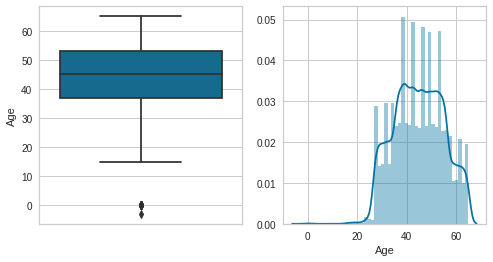

In [0]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.boxplot(y=demo.Age)
plt.subplot(1,2,2)
sns.distplot(demo.Age)
plt.show()

Data seems to be normally distributed and not skewed which is good.


In [0]:
np.quantile(demo.Age, np.arange(0,1.01, 0.01))

array([-3., 27., 27., 28., 28., 29., 29., 30., 30., 31., 31., 32., 32.,
       33., 33., 34., 34., 35., 35., 36., 36., 36., 37., 37., 37., 37.,
       38., 38., 38., 39., 39., 39., 39., 40., 40., 40., 41., 41., 41.,
       42., 42., 42., 42., 43., 43., 43., 44., 44., 44., 45., 45., 45.,
       46., 46., 46., 46., 47., 47., 47., 48., 48., 48., 49., 49., 49.,
       50., 50., 50., 50., 51., 51., 51., 52., 52., 52., 53., 53., 53.,
       54., 54., 54., 54., 55., 55., 55., 56., 56., 56., 57., 58., 58.,
       59., 60., 60., 61., 62., 63., 63., 64., 65., 65.])

In [0]:
demo.Education.value_counts()

Professional    24837
Masters         23970
Bachelor        17696
Phd              4549
Others            121
Name: Education, dtype: int64

* Fixing Age Related Data

  - Some of the Age data doesn't correlate well with the minimum age limit criteria for Education Field.
  - Here are few of the changes done. 
      Professional Degree >= 20 yrs,
      Bachelors Degree > =21 yrs,
      Masters Degree >= 23 yrs,
      PHD Degree >= 26 yrs



In [0]:
def age_correct(age, edu):
  if ((age < 21) and (edu == 'Professional')):
    age = 20
  if ((age < 22) and (edu == 'Bachelor')):
    age = 21
  if ((age < 24) and (edu == 'Masters')):
    age = 23
  if ((age < 27) and (edu == 'Phd')):
    age = 26
  if ((age < 21) and (edu == 'Others')):
    age = age
  return age

In [0]:
demo['Age'] = demo[['Age', 'Education']].apply(lambda x: age_correct(x[0], x[1]), axis=1)

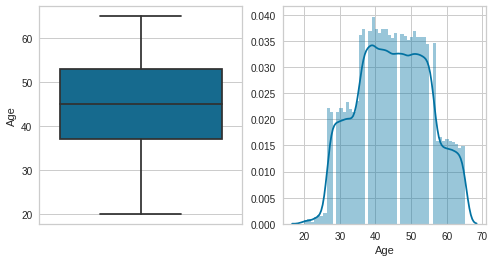

In [0]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.boxplot(y=demo.Age)
plt.subplot(1,2,2)
sns.distplot(demo.Age)
plt.show()

<Figure size 864x576 with 0 Axes>

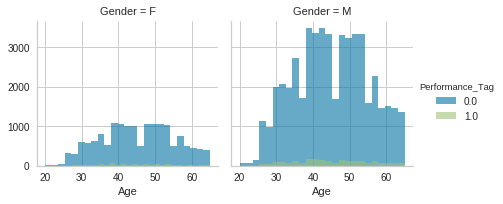

In [0]:
plt.figure(figsize=(12,8))
g = sns.FacetGrid(demo, col='Gender', hue='Performance_Tag')
g.map(plt.hist, 'Age', alpha=0.6, bins=25) #alpha is for opacity
g.add_legend()

* Based on above plot Population of Male applicant is substantially higher than Female.
* The Default Tag(Green color Bars) seems to be Higher for Male than Female. However, lets do some more analysis to look at actual numbers.

In [0]:
binned_CC_12_mon = pd.qcut(demo.Age, 10)
D = pd.DataFrame({'bins':binned_CC_12_mon, 'y':demo.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,"(19.999, 31.0]",302.0,7272,6970.0,0.041529
1,"(31.0, 36.0]",342.0,7866,7524.0,0.043478
2,"(36.0, 39.0]",320.0,7145,6825.0,0.044787
3,"(39.0, 42.0]",310.0,7003,6693.0,0.044267
4,"(42.0, 45.0]",278.0,6879,6601.0,0.040413
5,"(45.0, 48.0]",299.0,6869,6570.0,0.043529
6,"(48.0, 51.0]",267.0,6791,6524.0,0.039317
7,"(51.0, 54.0]",248.0,6786,6538.0,0.036546
8,"(54.0, 58.0]",290.0,6408,6118.0,0.045256
9,"(58.0, 65.0]",292.0,6848,6556.0,0.042640


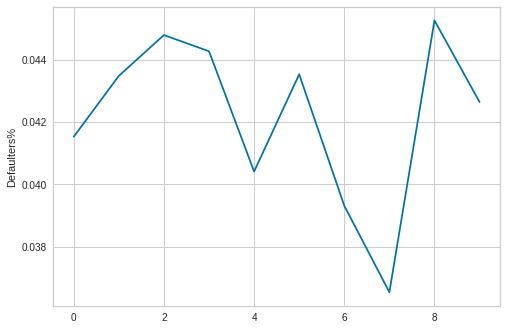

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

* Looks like the Defaulter % is higher within either very young age group or very elderly people.

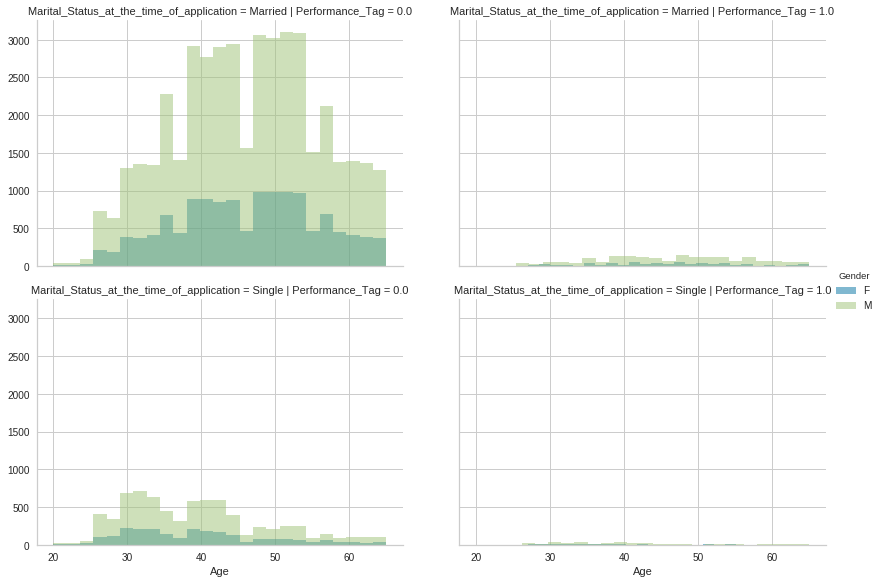

In [0]:
g = sns.FacetGrid(demo, col='Performance_Tag', row= "Marital_Status_at_the_time_of_application", hue='Gender')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'Age', alpha=0.50, bins=25) 
g.add_legend()

* We can see very clearly among **Married** people, Male tend to be majority class for both the Defaulters and Non-Defaulters Category.
* Also in **Married** category Male tend to be defaulting more than Female.
* We can see very clearly among **Single** people, Male tend to be the majority class for both the Defaulters and Non-Defaulters Category who are defaulting more. This could be also due to the fact that the data is imbalanced.

### Gender

In [0]:
gender = demo.groupby(['Gender', 'Performance_Tag']).size().unstack(1)
gender

Performance_Tag,0.0,1.0
Gender,,
F,15788,718
M,51129,2230


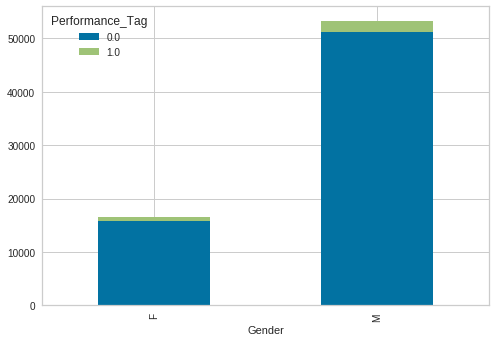

In [0]:
gender.plot(kind='bar', stacked = True)

* Male Applicants are considerably higher than Female Applicants

In [0]:
# Replacing NaN value with Male, who corresponds to majority class in dataset
demo.Gender.fillna('M', inplace=True)

In [0]:
# demo[['Gender', 'Performance_Tag']].groupby(['Gender'],as_index=False).mean().sort_values(by='Performance_Tag',ascending=False)
corr_2_cols('Gender', 'Performance_Tag')

Performance_Tag,0.0,1.0,perc
Gender,,,
F,15788,718,0.043499
M,51131,2230,0.041791


* Female seems to be Defaulting more but that could be due to less data points as well, Hence nothing conclusive can be inferred from this.

### Marital_Status_at_the_time_of_application                                          

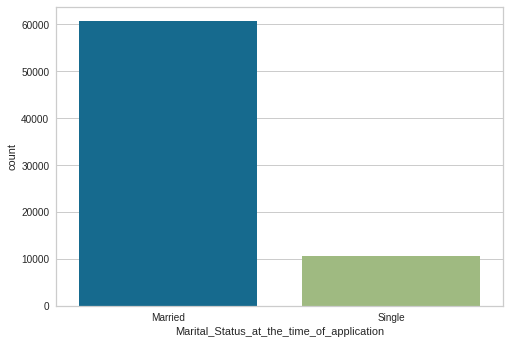

In [0]:
sns.countplot(demo.Marital_Status_at_the_time_of_application)

In [0]:
MS = demo.groupby(['Marital_Status_at_the_time_of_application', 'Performance_Tag']).size().unstack(1)
MS

Performance_Tag,0.0,1.0
Marital_Status_at_the_time_of_application,,
Married,57041,2503
Single,9872,445


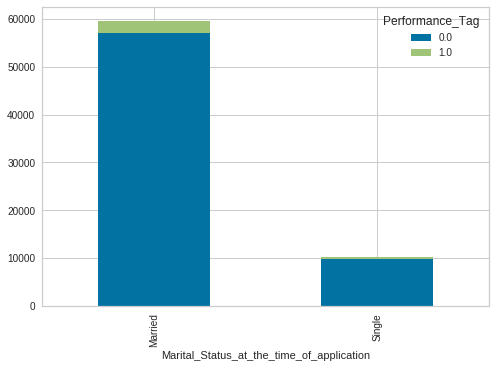

In [0]:
MS.plot(kind='bar', stacked = True)

In [0]:
# Replacing NaN value with Married
demo.Marital_Status_at_the_time_of_application.fillna('Married', inplace=True)

In [0]:
corr_2_cols('Marital_Status_at_the_time_of_application', 'Performance_Tag')

Performance_Tag,0.0,1.0,perc
Marital_Status_at_the_time_of_application,,,
Married,57047,2503,0.042032
Single,9872,445,0.043133


* Married Applicants are more than Singles.
* Single tend to default more compared to Married but as the count is not balanced, nothing conclusive can be inferred

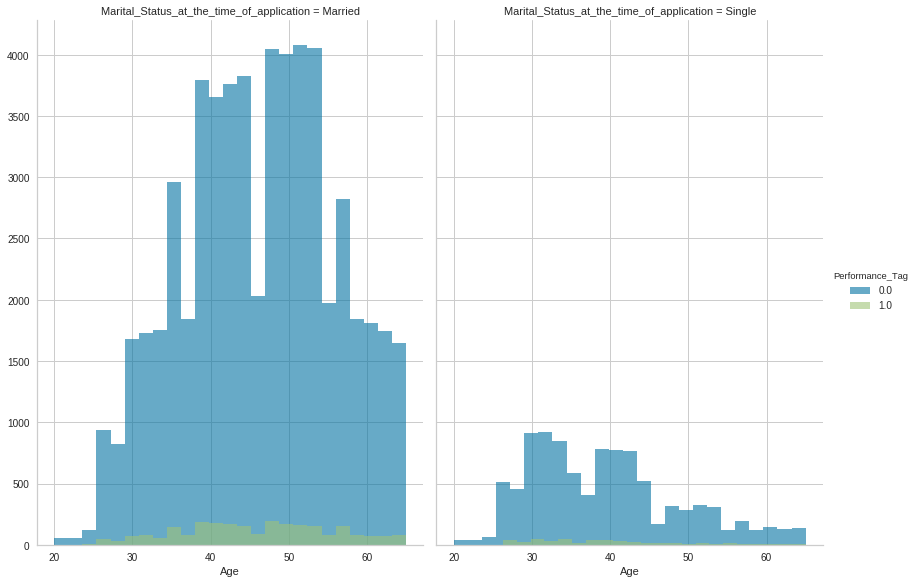

In [0]:
g = sns.FacetGrid(demo, col='Marital_Status_at_the_time_of_application', hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'Age', alpha=0.6, bins=25) #alpha is for opacity
g.add_legend()

### No_of_dependents                                

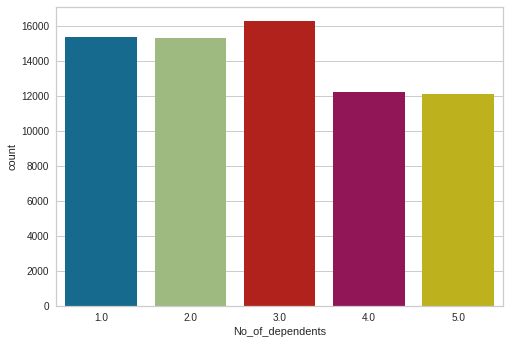

In [0]:
sns.countplot(demo.No_of_dependents)

In [0]:
# Replacing NaN value with 3.0 which is the maximum number of dependents type in dataset
demo.No_of_dependents.fillna(3.0, inplace=True)

In [0]:
NOD = demo.groupby(['No_of_dependents', 'Performance_Tag']).size().unstack(1)
NOD

Performance_Tag,0.0,1.0
No_of_dependents,,
1.0,14551,667
2.0,14539,588
3.0,14952,695
4.0,11505,494
5.0,11372,504


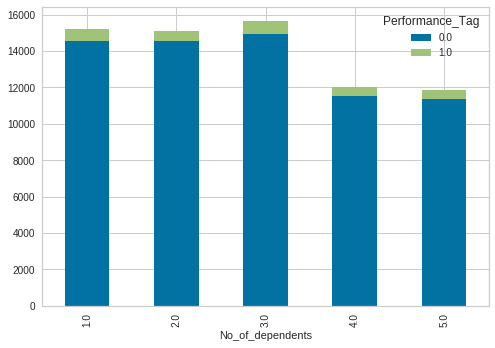

In [0]:
NOD.plot(kind='bar', stacked = True)

In [0]:
corr_2_cols('No_of_dependents', 'Performance_Tag')

Performance_Tag,0.0,1.0,perc
No_of_dependents,,,
1.0,14551,667,0.043830
2.0,14539,588,0.038871
3.0,14952,695,0.044417
4.0,11505,494,0.041170
5.0,11372,504,0.042439


* Applicants with more dependents tend to default less as per the above stats but in Bivariate analysis we could come across some other findings about this pattern.
* Applicants with 3 dependents comparatively default more than rest of the category in thios segment.

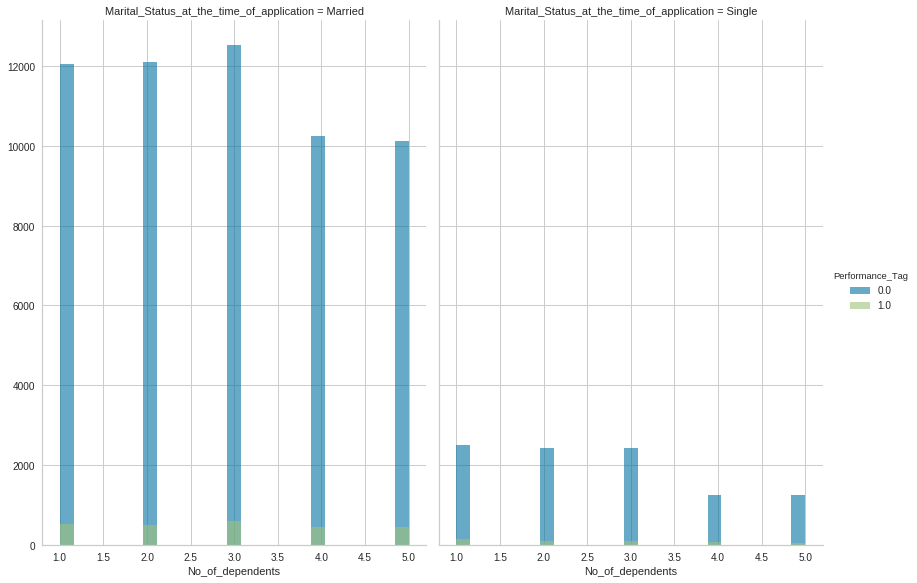

In [0]:
g = sns.FacetGrid(demo, col='Marital_Status_at_the_time_of_application', hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'No_of_dependents', alpha=0.6, bins=25) #alpha is for opacity
g.add_legend()

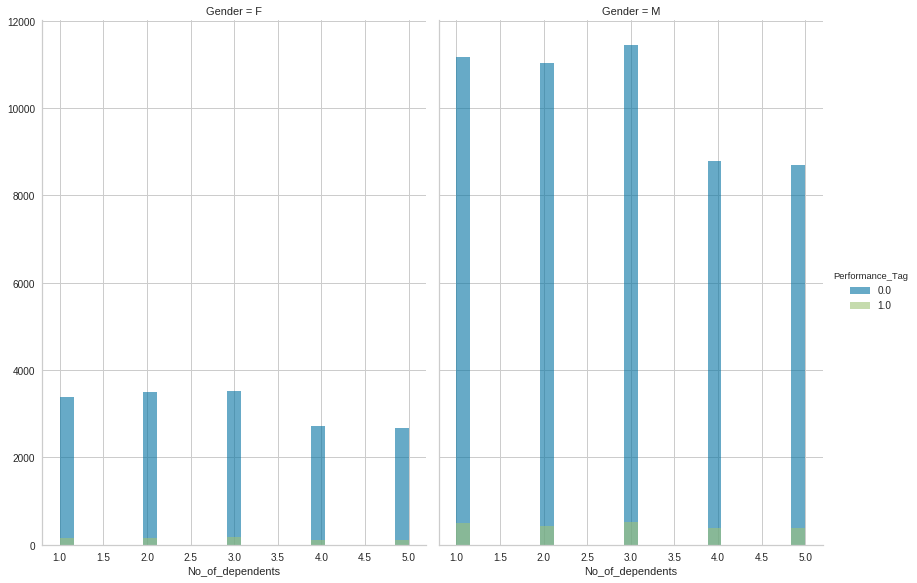

In [0]:
g = sns.FacetGrid(demo, col='Gender', hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'No_of_dependents', alpha=0.6, bins=25) #alpha is for opacity
g.add_legend()

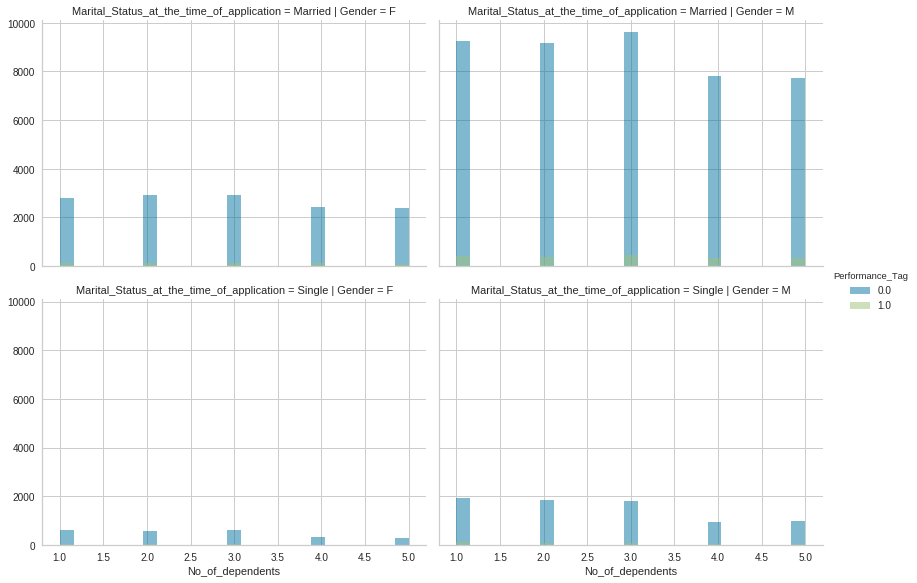

In [0]:
g = sns.FacetGrid(demo, col='Gender', row= "Marital_Status_at_the_time_of_application", hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'No_of_dependents', alpha=0.50, bins=25) 
g.add_legend()

* **Male** and **Married** are the two categories which has maximum Default Rate

### Income

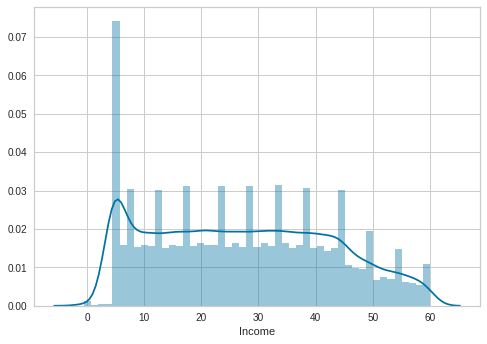

In [0]:
sns.distplot(demo.Income)

In [0]:
np.quantile(demo.Income, np.arange(0,1.01,.01))

array([-0.5 ,  4.5 ,  4.5 ,  4.5 ,  4.5 ,  4.5 ,  4.5 ,  4.5 ,  5.  ,
        5.  ,  6.  ,  6.  ,  7.  ,  7.  ,  8.  ,  8.  ,  9.  ,  9.  ,
       10.  , 11.  , 11.  , 12.  , 12.  , 13.  , 13.  , 14.  , 14.  ,
       15.  , 15.  , 16.  , 16.  , 17.  , 17.  , 18.  , 18.  , 19.  ,
       19.  , 20.  , 20.  , 21.  , 21.  , 22.  , 22.  , 23.  , 23.  ,
       24.  , 25.  , 25.  , 26.  , 26.  , 27.  , 27.  , 28.  , 28.  ,
       29.  , 29.  , 30.  , 30.  , 31.  , 31.  , 32.  , 32.  , 33.  ,
       33.  , 34.  , 34.  , 35.  , 35.  , 36.  , 36.  , 37.  , 37.  ,
       38.  , 39.  , 39.  , 40.  , 40.  , 41.  , 41.  , 42.  , 42.  ,
       43.  , 43.  , 44.  , 44.  , 45.  , 46.  , 46.  , 47.  , 48.  ,
       49.  , 50.  , 50.  , 52.  , 53.  , 54.  , 55.  , 56.  , 57.18,
       59.  , 60.  ])

In [0]:
# As Income can't go in Negative. Making all the values lesser than 4.5 including negative values as "4.5"
demo['Income'] = demo.Income.apply(lambda x: 4.5 if x < 4.5 else x)

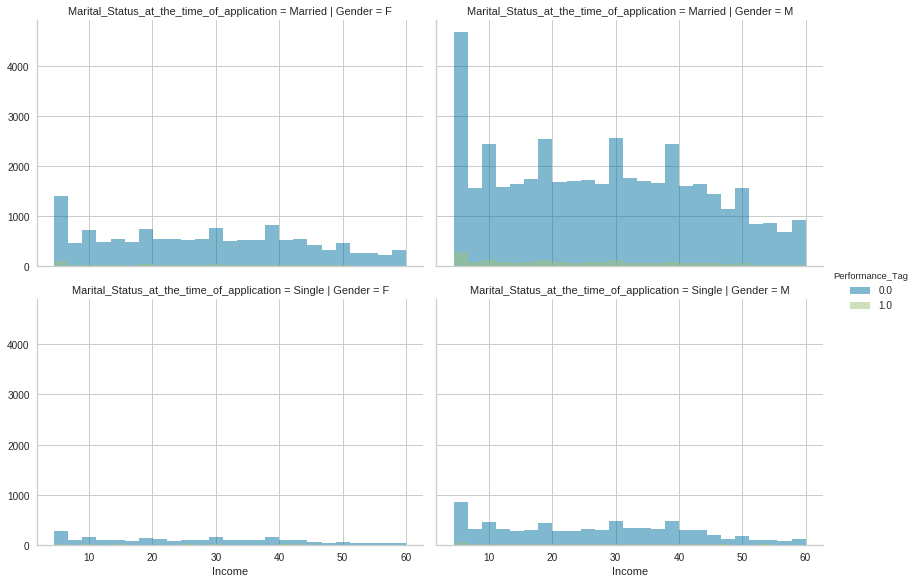

In [0]:
g = sns.FacetGrid(demo, col='Gender', row= "Marital_Status_at_the_time_of_application", hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'Income', alpha=0.50, bins=25) 
g.add_legend()

* We can see very clearly among **Married** people, Male tend to be majority class for both the Defaulters and Non-Defaulters Category.
* Also in **Married** category Male tend to be defaulting more in **Married** segment. Even in **Singles** Male Default more than Female.

In [0]:
binned_CC = pd.qcut(demo.Income, 10)
D = pd.DataFrame({'bins':binned_CC, 'y':demo.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,"(4.499, 6.0]",451.0,7646,7195.0,0.058985
1,"(6.0, 11.0]",314.0,6515,6201.0,0.048196
2,"(11.0, 16.0]",304.0,6603,6299.0,0.046040
3,"(16.0, 21.0]",310.0,6803,6493.0,0.045568
4,"(21.0, 27.0]",352.0,8157,7805.0,0.043153
5,"(27.0, 32.0]",299.0,6837,6538.0,0.043733
6,"(32.0, 37.0]",251.0,6850,6599.0,0.036642
7,"(37.0, 42.0]",214.0,6598,6384.0,0.032434
8,"(42.0, 49.0]",265.0,7393,7128.0,0.035845
9,"(49.0, 60.0]",188.0,6465,6277.0,0.029080


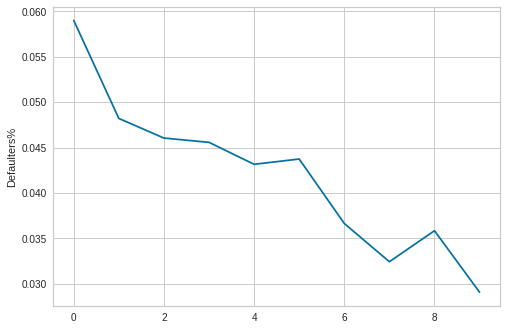

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

* Looks like as the income increases, Default % also reduces.

### Education

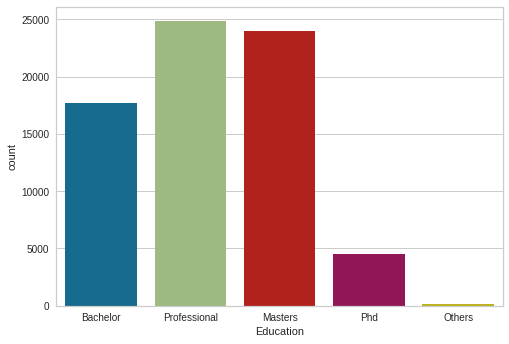

In [0]:
sns.countplot(demo.Education)

In [0]:
# Replaceing all missing values with Professional segment.
demo.Education.fillna('Professional', inplace=True)

In [0]:
Edu = demo.groupby(['Education', 'Performance_Tag']).size().unstack(1)
Edu

Performance_Tag,0.0,1.0
Education,,
Bachelor,16559,742
Masters,22483,998
Others,111,8
Phd,4280,184
Professional,23486,1016


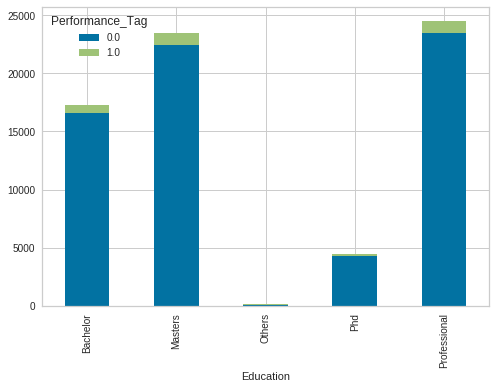

In [0]:
Edu.plot(kind='bar', stacked = True)

In [0]:
corr_2_cols('Education', 'Performance_Tag')

Performance_Tag,0.0,1.0,perc
Education,,,
Bachelor,16559,742,0.042888
Masters,22483,998,0.042502
Others,111,8,0.067227
Phd,4280,184,0.041219
Professional,23486,1016,0.041466


* **Others** has the highest default rate but that could be due to less values in this bin. Among remaining categories, **Masters** and **Bachelor** seems to be Defaulting marginally more than the rest of the category.

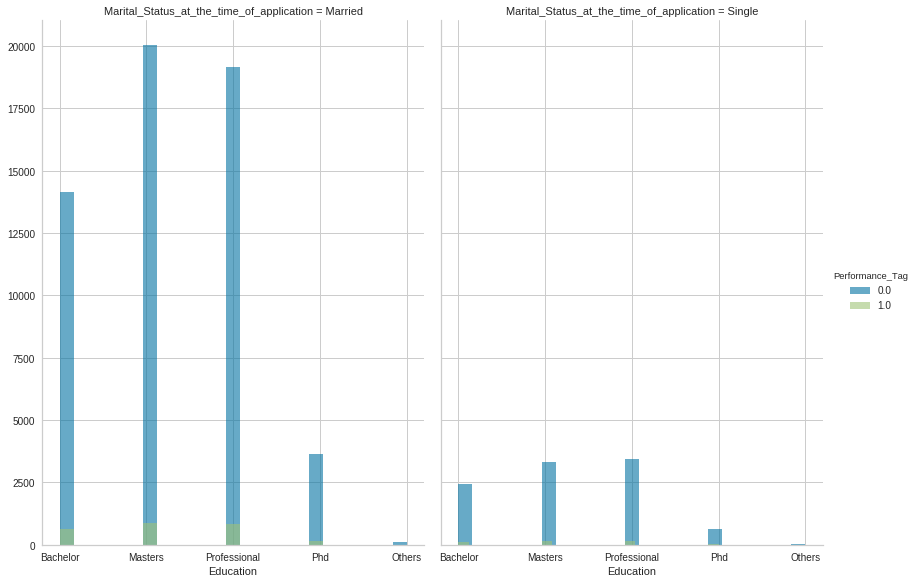

In [0]:
g = sns.FacetGrid(demo, col='Marital_Status_at_the_time_of_application', hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'Education', alpha=0.6, bins=25) #alpha is for opacity
g.add_legend()

* Masters and Professional education category seems to be defaulting more for Married Applicants.

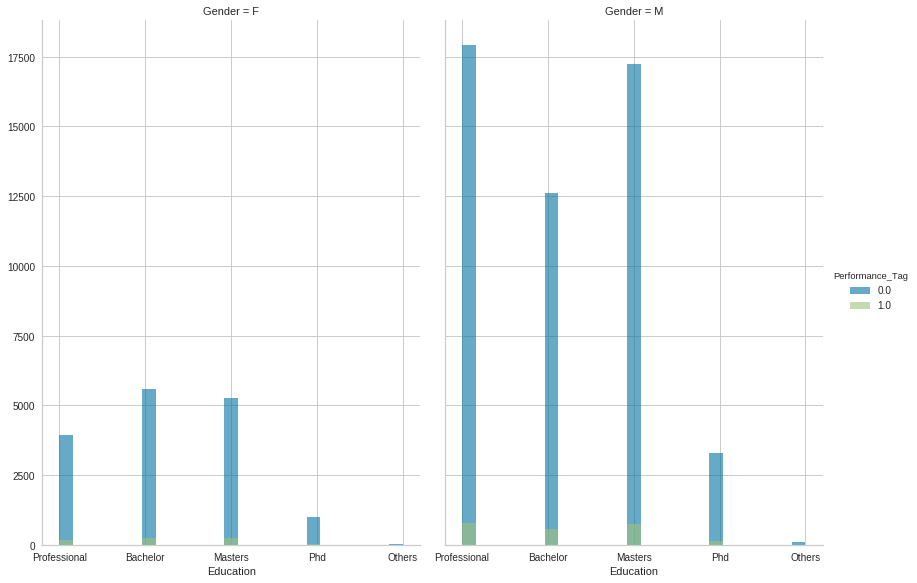

In [0]:
g = sns.FacetGrid(demo, col='Gender', hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'Education', alpha=0.6, bins=25) #alpha is for opacity
g.add_legend()

* **Professional**, **Masters** and **Bachelor** degree holders are defaulting more among Male category.

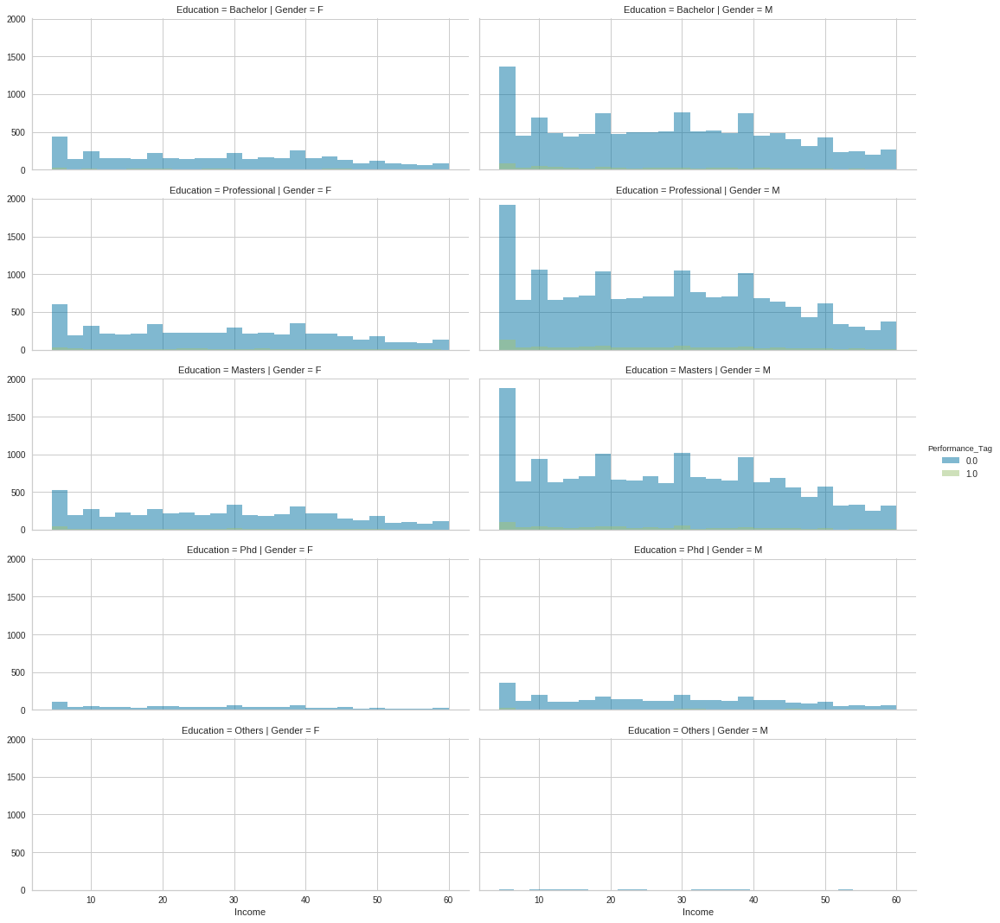

In [0]:
g = sns.FacetGrid(demo, col='Gender', row= "Education", hue='Performance_Tag')
plt.gcf().set_size_inches(15, 15)
g.map(plt.hist, 'Income', alpha=0.50, bins=25) 
g.add_legend()

* People in the starting income range in Bachelor, Professional and Masters tend to default more.

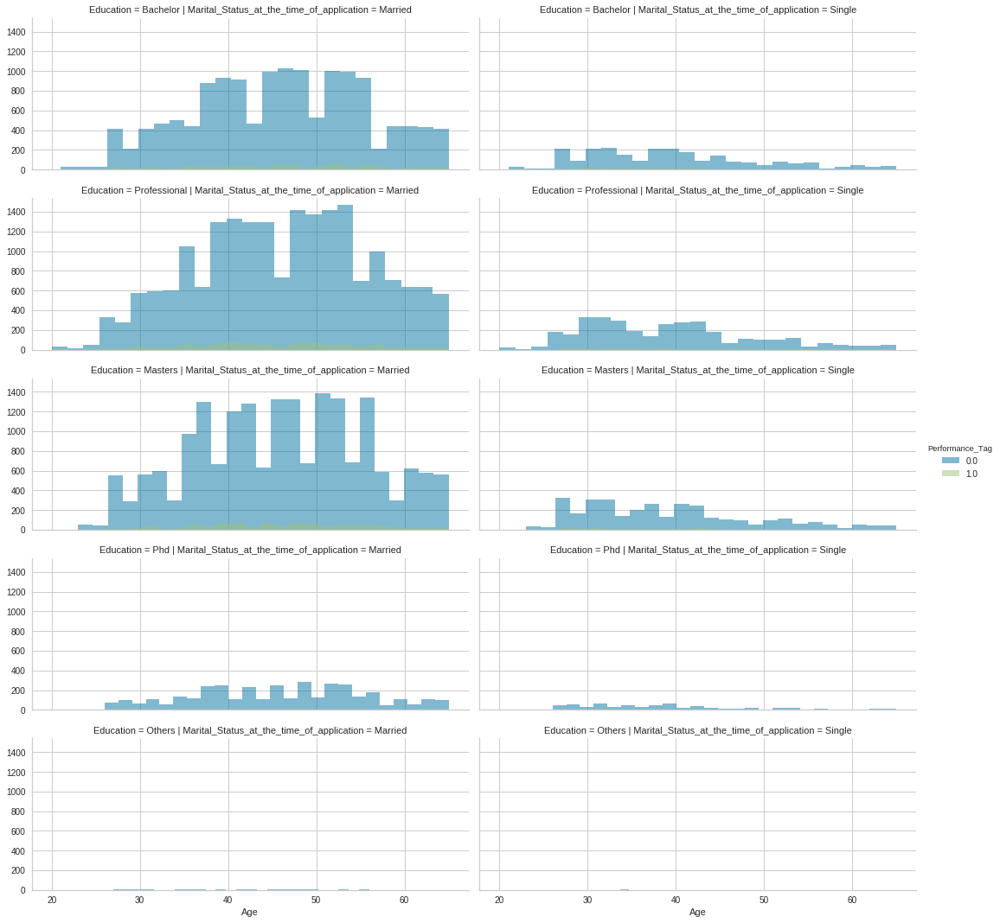

In [0]:
g = sns.FacetGrid(demo, col='Marital_Status_at_the_time_of_application', row= "Education", hue='Performance_Tag')
plt.gcf().set_size_inches(15, 15) 
g.map(plt.hist, 'Age', alpha=0.50, bins=25) 
g.add_legend()

* Here we can see that Mid-Aged(between 35-55 age group) professional, Bachelor and Masters who are also married seem to be defaulting more.

### Type_of_residence

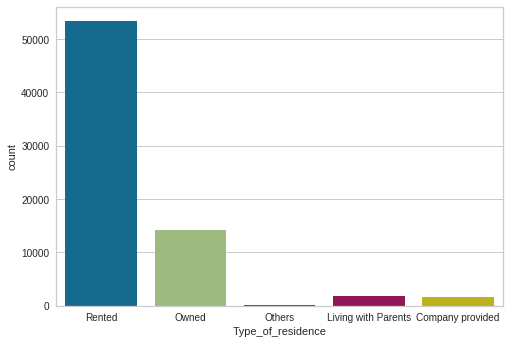

In [0]:
sns.countplot(demo.Type_of_residence)

* People who have rented accomodation makes majority of the applicants followed by Owned accomodation.

In [0]:
# Replacing Null values with rented.
demo.Type_of_residence.fillna('Rented', inplace=True)

In [0]:
Res = demo.groupby(['Type_of_residence', 'Performance_Tag']).size().unstack(1)
Res

Performance_Tag,0.0,1.0
Type_of_residence,,
Company provided,1530,73
Living with Parents,1697,80
Others,193,5
Owned,13410,593
Rented,50089,2197


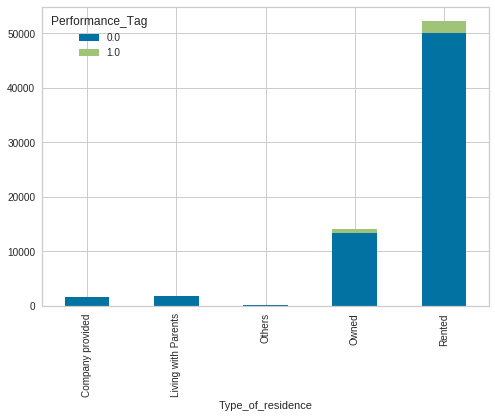

In [0]:
Res.plot(kind='bar', stacked = True)

In [0]:
corr_2_cols('Type_of_residence', 'Performance_Tag')

Performance_Tag,0.0,1.0,perc
Type_of_residence,,,
Company provided,1530,73,0.045540
Living with Parents,1697,80,0.045020
Others,193,5,0.025253
Owned,13410,593,0.042348
Rented,50089,2197,0.042019


* **Company provided** accomodations has the highest default rate but that could be due to less values in this bin. Among remaining categories, **Rented** and **Others** seems to be Defaulting marginally more than the rest of the category.

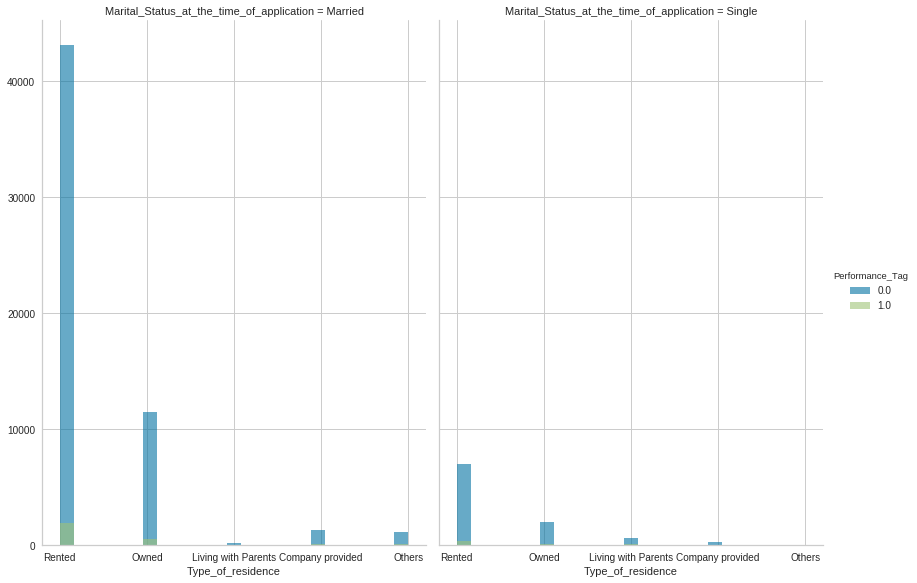

In [0]:
g = sns.FacetGrid(demo, col='Marital_Status_at_the_time_of_application', hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'Type_of_residence', alpha=0.6, bins=25) #alpha is for opacity
g.add_legend()

* **Rented** and Owned **category** seems to be defaulting more for Married Applicants.

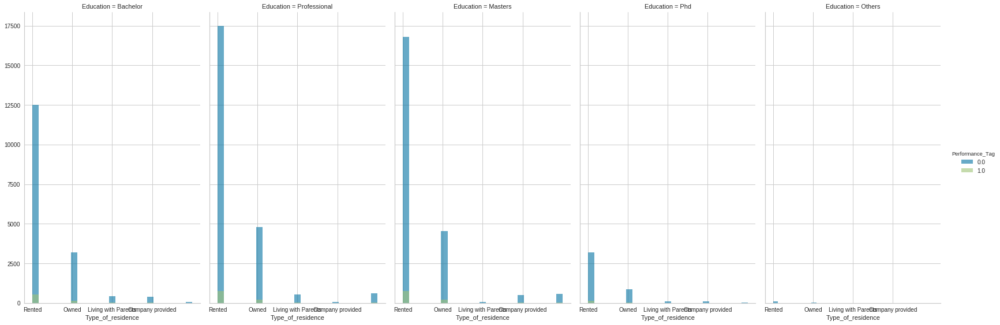

In [0]:
g = sns.FacetGrid(demo, col='Education', hue='Performance_Tag')
plt.gcf().set_size_inches(23, 8)
g.map(plt.hist, 'Type_of_residence', alpha=0.6, bins=25) #alpha is for opacity
g.add_legend()

* **Professional**, **Masters** and **Bachelor** degree holders are defaulting more among the Rented category.

### Profession

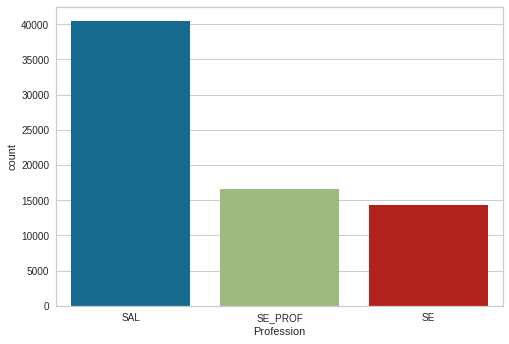

In [0]:
sns.countplot(demo.Profession)

* Mostly Salaried people are applying for the credit card.

In [0]:
# Replacing missing values with Salaried field as they apply most for the card
demo.Profession.fillna('SAL', inplace=True)

In [0]:
Pro = demo.groupby(['Profession', 'Performance_Tag']).size().unstack(1)
Pro

Performance_Tag,0.0,1.0
Profession,,
SAL,38055,1629
SE,13285,642
SE_PROF,15579,677


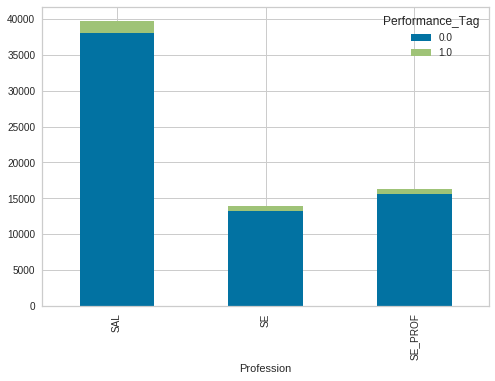

In [0]:
Pro.plot(kind='bar', stacked = True)

In [0]:
corr_2_cols('Profession', 'Performance_Tag')

Performance_Tag,0.0,1.0,perc
Profession,,,
SAL,38055,1629,0.041049
SE,13285,642,0.046098
SE_PROF,15579,677,0.041646


* **SE** has the highest default rate but that could be due to less values in this bin.

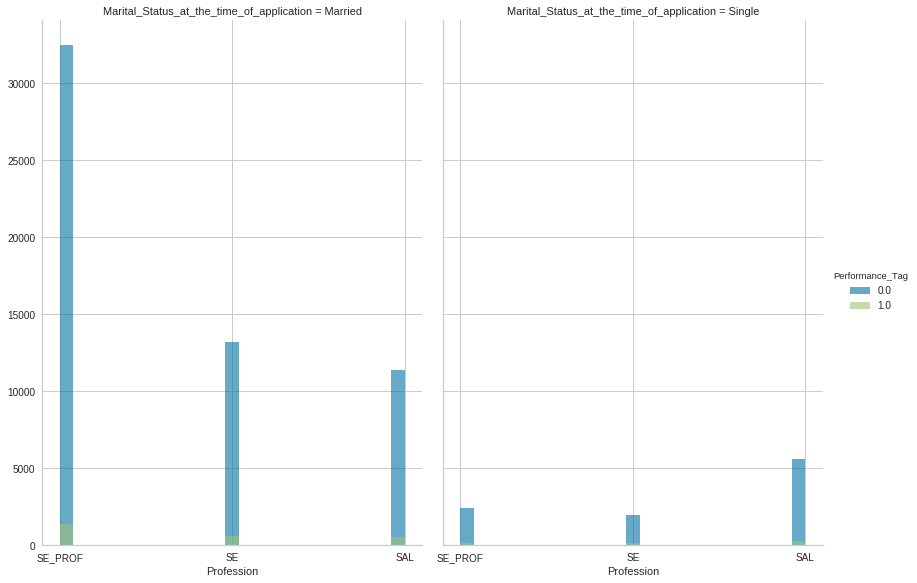

In [0]:
g = sns.FacetGrid(demo, col='Marital_Status_at_the_time_of_application', hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'Profession', alpha=0.6, bins=25) #alpha is for opacity
g.add_legend()

* SE_PROF category seems to be defaulting more for Married Applicants.

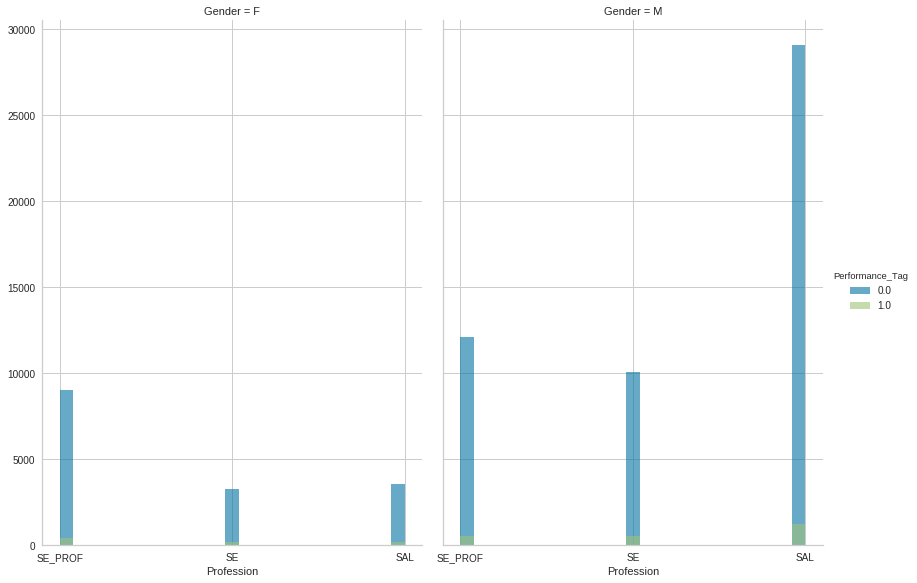

In [0]:
g = sns.FacetGrid(demo, col='Gender', hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'Profession', alpha=0.6, bins=25) #alpha is for opacity
g.add_legend()

* **SAL** category are defaulting more among Male category.

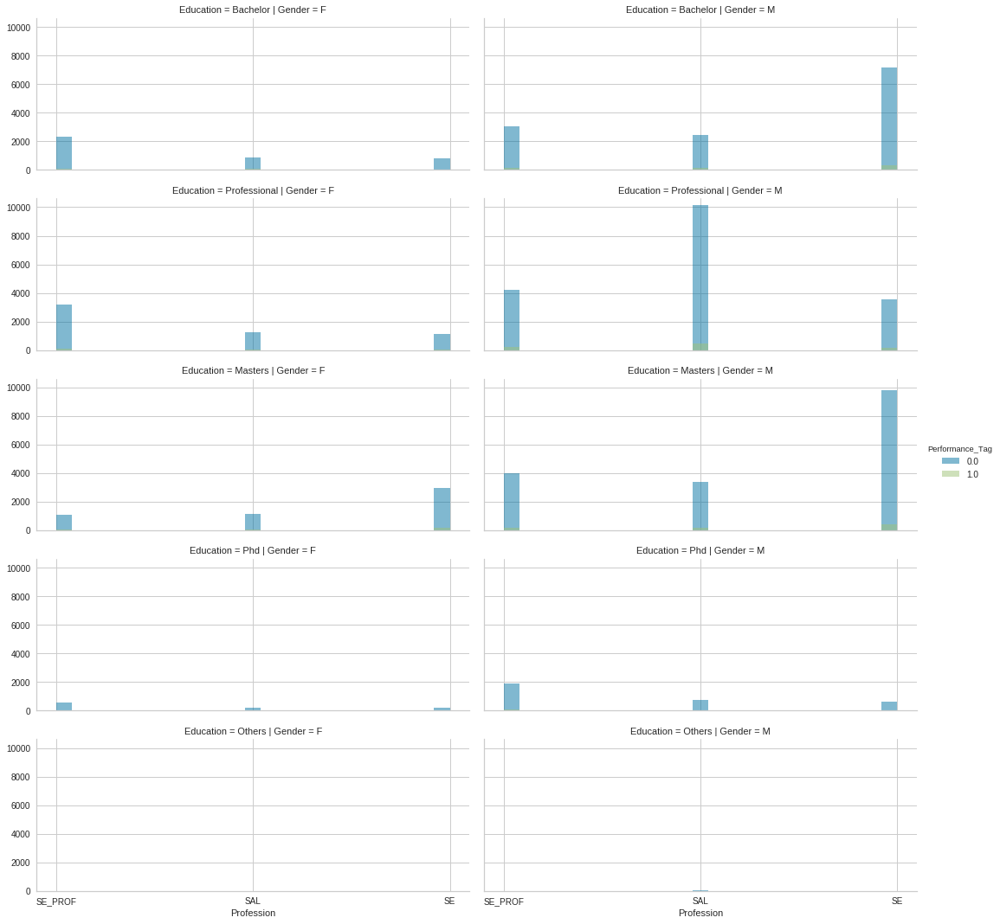

In [0]:
g = sns.FacetGrid(demo, col='Gender', row= "Education", hue='Performance_Tag')
plt.gcf().set_size_inches(15, 15)
g.map(plt.hist, 'Profession', alpha=0.50, bins=25) 
g.add_legend()

* Male, Professional education degree, Salaried are defaulting more than rest of the categories.
* Male, Masters degree holders, SE category also seems to be dafaulting as per the plot. Rest of the Defalters are scattred here and there across different combination of groups.

### No_of_months_in_current_residence

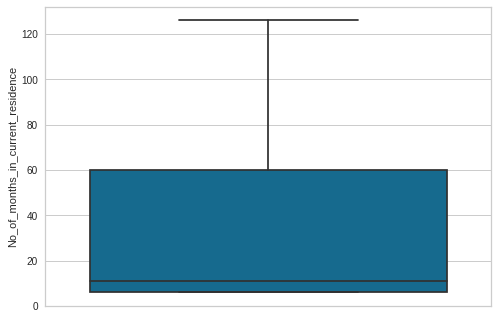

In [0]:
sns.boxplot(y=demo.No_of_months_in_current_residence)

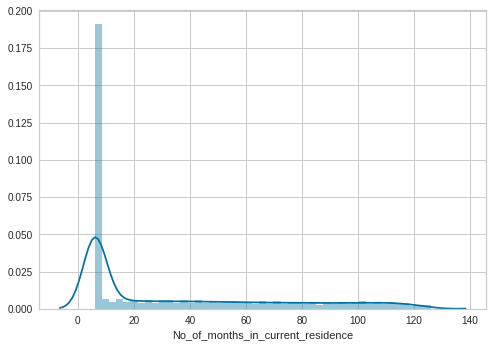

In [0]:
sns.distplot(demo.No_of_months_in_current_residence)

* Looks like No_of_months_in_current_residence is following power law distribution.

In [0]:
np.quantile(demo.No_of_months_in_current_residence, np.arange(0,1.01,0.01))

array([  6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,
         6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,
         6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,
         6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,   6.,
         6.,   6.,   6.,   6.,   7.,   9.,  11.,  12.,  14.,  16.,  18.,
        19.,  21.,  23.,  25.,  27.,  29.,  31.,  33.,  35.,  37.,  39.,
        41.,  43.,  45.,  47.,  49.,  52.,  54.,  56.,  58.,  60.,  63.,
        65.,  68.,  70.,  72.,  75.,  78.,  80.,  82.,  85.,  88.,  90.,
        93.,  95.,  98., 100., 103., 105., 108., 110., 113., 115., 118.,
       122., 126.])

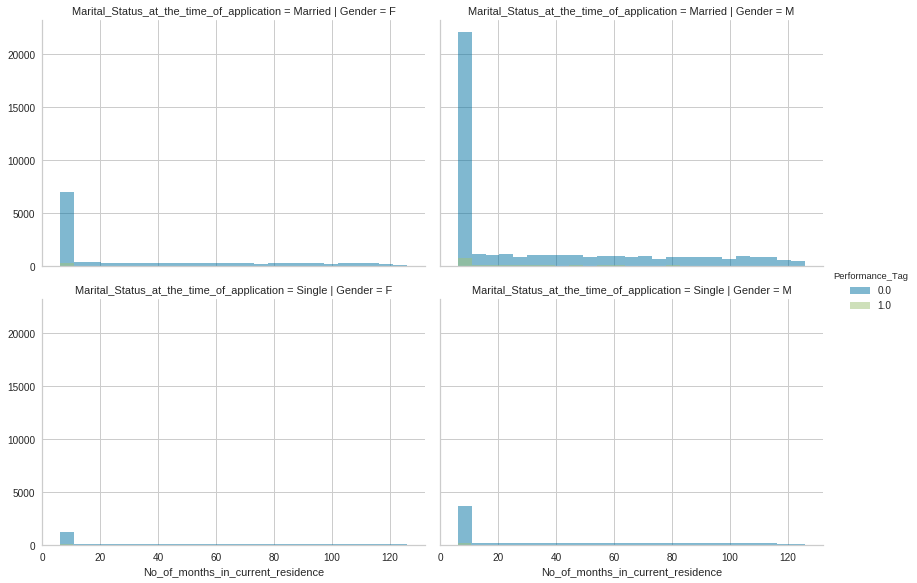

In [0]:
g = sns.FacetGrid(demo, col='Gender', row= "Marital_Status_at_the_time_of_application", hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'No_of_months_in_current_residence', alpha=0.50, bins=25) 
g.add_legend()

* We can see very clearly see that people who stayed less no. of months in their current accomodation tend to have high default rate.

In [0]:
binned_CC = pd.cut(demo.No_of_months_in_current_residence, 10)
D = pd.DataFrame({'bins':binned_CC, 'y':demo.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,"(5.88, 18.0]",1360.0,38156,36796.0,0.035643
1,"(18.0, 30.0]",282.0,4186,3904.0,0.067367
2,"(30.0, 42.0]",234.0,4205,3971.0,0.055648
3,"(42.0, 54.0]",218.0,3944,3726.0,0.055274
4,"(54.0, 66.0]",185.0,3593,3408.0,0.051489
5,"(66.0, 78.0]",142.0,3419,3277.0,0.041533
6,"(78.0, 90.0]",160.0,3300,3140.0,0.048485
7,"(90.0, 102.0]",141.0,3366,3225.0,0.041889
8,"(102.0, 114.0]",114.0,3457,3343.0,0.032977
9,"(114.0, 126.0]",112.0,2241,2129.0,0.049978


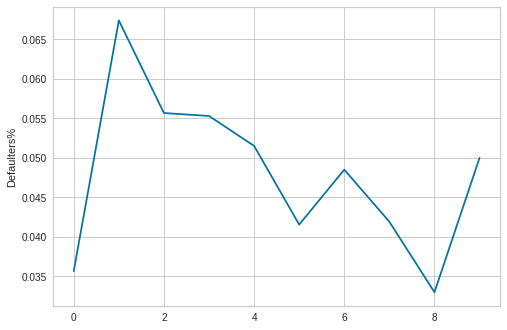

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

* People in 5-18 months period seem to be defaulting more then people in last category(114-126 months)

### No_of_months_in_current_company

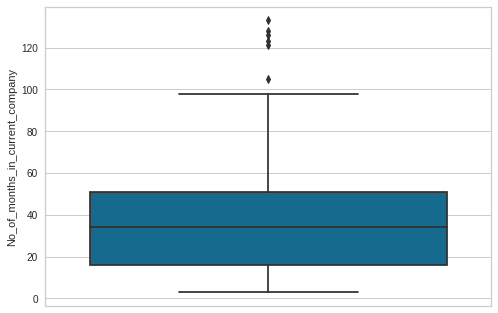

In [0]:
sns.boxplot(y=demo.No_of_months_in_current_company)

In [0]:
np.quantile(demo.No_of_months_in_current_company, np.arange(0,1.01,0.01))

array([  3. ,   3. ,   3. ,   3. ,   3. ,   3. ,   3. ,   4. ,   4. ,
         5. ,   6. ,   6. ,   7. ,   8. ,   8. ,   9. ,  10. ,  10. ,
        11. ,  12. ,  13. ,  13. ,  14. ,  15. ,  15. ,  16. ,  17. ,
        18. ,  18. ,  19. ,  20. ,  20. ,  21. ,  22. ,  23. ,  23. ,
        24. ,  25. ,  25. ,  26. ,  27. ,  27. ,  28. ,  29. ,  29. ,
        30. ,  31. ,  32. ,  32. ,  33. ,  34. ,  34. ,  35. ,  36. ,
        36. ,  37. ,  38. ,  38. ,  39. ,  40. ,  40. ,  41. ,  42. ,
        43. ,  43. ,  44. ,  45. ,  45. ,  46. ,  47. ,  47. ,  48. ,
        49. ,  49. ,  50. ,  51. ,  52. ,  52. ,  53. ,  54. ,  54. ,
        55. ,  56. ,  56. ,  57. ,  58. ,  58. ,  59. ,  60. ,  61. ,
        61.9,  62. ,  64. ,  65. ,  66. ,  68. ,  69. ,  71. ,  72. ,
        74. , 133. ])

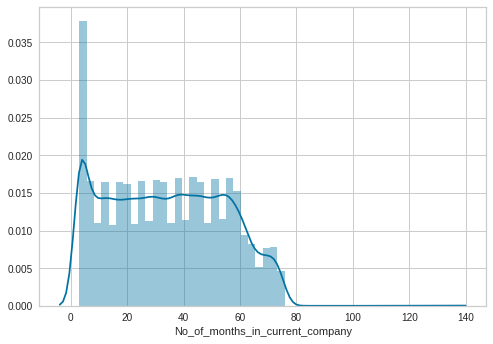

In [0]:
sns.distplot(demo.No_of_months_in_current_company)

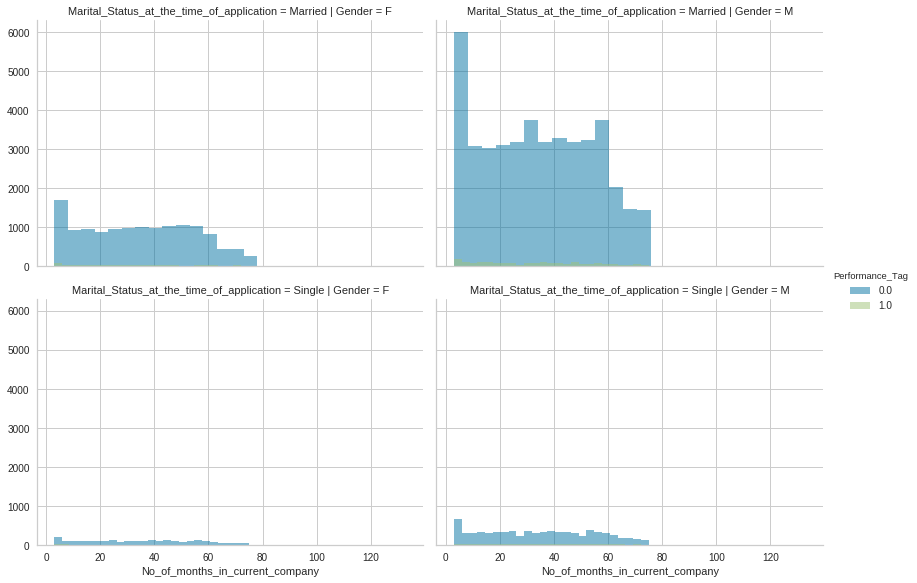

In [0]:
g = sns.FacetGrid(demo, col='Gender', row= "Marital_Status_at_the_time_of_application", hue='Performance_Tag')
plt.gcf().set_size_inches(11.7, 8.27)
g.map(plt.hist, 'No_of_months_in_current_company', alpha=0.50, bins=25) 
g.add_legend()

* We can see very clearly see that people who stayed less no. of months in their current company tend to have high default rate. these people are also from Male and Married category.

In [0]:
binned_CC = pd.qcut(demo.No_of_months_in_current_company, 10)
D = pd.DataFrame({'bins':binned_CC, 'y':demo.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,"(2.999, 6.0]",356.0,7656,7300.0,0.046499
1,"(6.0, 13.0]",344.0,6847,6503.0,0.050241
2,"(13.0, 20.0]",350.0,6878,6528.0,0.050887
3,"(20.0, 27.0]",297.0,7035,6738.0,0.042217
4,"(27.0, 34.0]",278.0,7038,6760.0,0.039500
5,"(34.0, 40.0]",271.0,6171,5900.0,0.043915
6,"(40.0, 47.0]",258.0,7218,6960.0,0.035744
7,"(47.0, 54.0]",250.0,7232,6982.0,0.034569
8,"(54.0, 61.9]",229.0,6760,6531.0,0.033876
9,"(61.9, 133.0]",315.0,7032,6717.0,0.044795


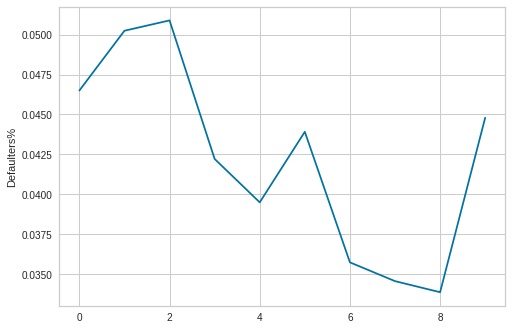

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

* People in 6-20 months period seem to be defaulting more then people in last category(62-133 months)

### Performance_Tag

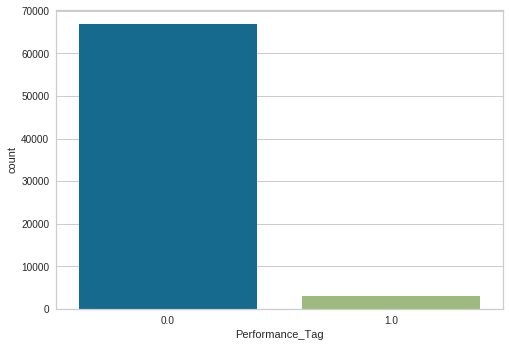

In [0]:
sns.countplot(demo.Performance_Tag)

* There's high data imbalance between the two categories.

* Removing Null values from the Performance Tag as there's no way to validate this Data. In ideal situation we could have circled back to the business to double check this data.
* We will validate the performance of these Null rows that are removed now on the Final Model to see what the outcomes are. We will consider these applicants as the ones who would default and were unfit for the Card.

In [0]:
demo_partial = demo[demo.Performance_Tag.notnull()]
demo_full = demo.copy()

In [0]:
demo_partial.isnull().sum()

Application_ID                               0
Age                                          0
Gender                                       0
Marital_Status_at_the_time_of_application    0
No_of_dependents                             0
Income                                       0
Education                                    0
Profession                                   0
Type_of_residence                            0
No_of_months_in_current_residence            0
No_of_months_in_current_company              0
Performance_Tag                              0
dtype: int64

# Credit Bureau Data Exploration(EDA)

In [0]:
credit_df.isnull().sum()

Application_ID                                                      0
No_of_times_90_DPD_or_worse_in_last_6_months                        0
No_of_times_60_DPD_or_worse_in_last_6_months                        0
No_of_times_30_DPD_or_worse_in_last_6_months                        0
No_of_times_90_DPD_or_worse_in_last_12_months                       0
No_of_times_60_DPD_or_worse_in_last_12_months                       0
No_of_times_30_DPD_or_worse_in_last_12_months                       0
Avgas_CC_Utilization_in_last_12_months                           1058
No_of_trades_opened_in_last_6_months                                1
No_of_trades_opened_in_last_12_months                               0
No_of_PL_trades_opened_in_last_6_months                             0
No_of_PL_trades_opened_in_last_12_months                            0
No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans        0
No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans       0
Presence_of_open_hom

In [0]:
def corr_2_creds(Col1, Col2):
    res = credit_df.groupby([Col1, Col2]).size().unstack()
    res['perc'] = (res[res.columns[1]]/(res[res.columns[0]] + res[res.columns[1]]))
    return res

### Avgas_CC_Utilization_in_last_12_months

In [0]:
# There seems to be Null Values here. Most likely since the card has not be utilized, its Utilization is Null. Replacing all null values with 0
credit_df.Avgas_CC_Utilization_in_last_12_months.fillna(0.0, inplace=True)
np.quantile(credit_df.Avgas_CC_Utilization_in_last_12_months, np.arange(0,1.01,0.01))

array([  0.,   0.,   1.,   2.,   2.,   3.,   3.,   4.,   4.,   4.,   5.,
         5.,   5.,   6.,   6.,   6.,   6.,   7.,   7.,   7.,   7.,   7.,
         8.,   8.,   8.,   8.,   8.,   9.,   9.,   9.,   9.,   9.,  10.,
        10.,  10.,  10.,  11.,  11.,  11.,  11.,  11.,  12.,  12.,  12.,
        13.,  13.,  13.,  14.,  14.,  14.,  15.,  15.,  16.,  16.,  17.,
        18.,  19.,  19.,  20.,  21.,  23.,  24.,  25.,  27.,  28.,  30.,
        32.,  34.,  35.,  37.,  38.,  40.,  41.,  43.,  44.,  45.,  47.,
        48.,  50.,  51.,  53.,  54.,  56.,  57.,  59.,  61.,  63.,  65.,
        67.,  70.,  72.,  75.,  79.,  83.,  90., 102., 113., 113., 113.,
       113., 113.])

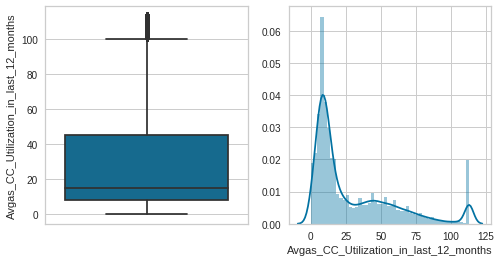

In [0]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.boxplot(y=credit_df.Avgas_CC_Utilization_in_last_12_months)
plt.subplot(1,2,2)
sns.distplot(credit_df.Avgas_CC_Utilization_in_last_12_months)
plt.show()

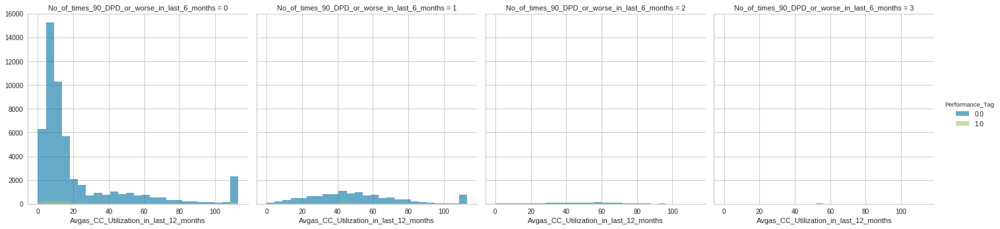

In [0]:
g = sns.FacetGrid(credit_df, col='No_of_times_90_DPD_or_worse_in_last_6_months', hue='Performance_Tag')
plt.gcf().set_size_inches(20, 5)
g.map(plt.hist, 'Avgas_CC_Utilization_in_last_12_months', alpha=0.6, bins=25) #alpha is for opacity
g.add_legend()

* Based on above plot there's very less data points in the category 2 and 3 of 90 days past due.
* Most people come from 0 and 1 "90 DPD" category

In [0]:
binned_CC_12_mon = pd.qcut(credit_df.Avgas_CC_Utilization_in_last_12_months, 10)
D = pd.DataFrame({'bins':binned_CC_12_mon, 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,"(-0.001, 5.0]",193.0,9044,8851.0,0.021340
1,"(5.0, 7.0]",126.0,6358,6232.0,0.019818
2,"(7.0, 9.0]",145.0,6967,6822.0,0.020812
3,"(9.0, 11.0]",142.0,6115,5973.0,0.023222
4,"(11.0, 15.0]",217.0,8091,7874.0,0.026820
5,"(15.0, 23.0]",291.0,6527,6236.0,0.044584
6,"(23.0, 38.0]",439.0,6406,5967.0,0.068530
7,"(38.0, 53.0]",515.0,7122,6607.0,0.072311
8,"(53.0, 72.0]",475.0,6434,5959.0,0.073827
9,"(72.0, 113.0]",405.0,6803,6398.0,0.059533


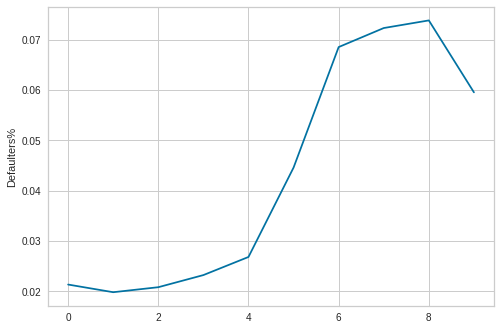

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

* Looks like the Defaulter % is higher when Credit card utilizations are high
* Between 53-72 credit utilization Grp, Defaulters % is extremely high.

### Outstanding_Balance

In [0]:
credit_df['Outstanding_Balance'].isnull().sum()

272

In [0]:
# Filling all the null values with 0 as looks like these applicants didn't use the card or never went to Delequent status.
credit_df['Outstanding_Balance'].fillna(0.0, inplace=True)

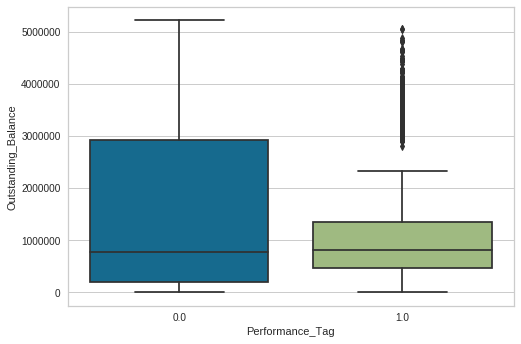

In [0]:
sns.boxplot(x=credit_df.Performance_Tag, y=credit_df['Outstanding_Balance'])

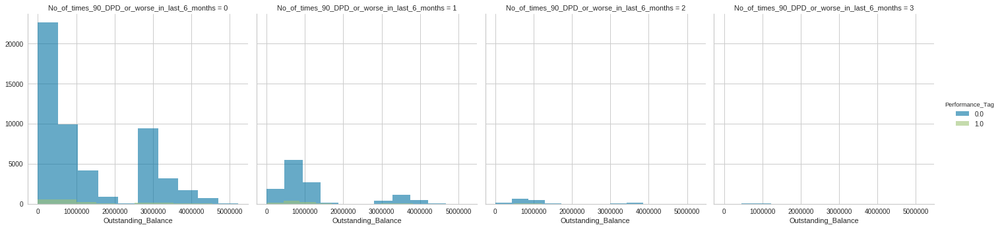

In [0]:
g = sns.FacetGrid(credit_df, col='No_of_times_90_DPD_or_worse_in_last_6_months', hue='Performance_Tag')
plt.gcf().set_size_inches(20, 5)
g.map(plt.hist, 'Outstanding_Balance', alpha=0.6, bins=10) #alpha is for opacity
g.add_legend()

In [0]:
binned_CC_12_mon = pd.qcut(credit_df.Outstanding_Balance, 10)

D = pd.DataFrame({'bins':binned_CC_12_mon, 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,"(-0.001, 6707.3]",145.0,7130,6985.0,0.020337
1,"(6707.3, 26251.2]",125.0,7127,7002.0,0.017539
2,"(26251.2, 388843.9]",263.0,7029,6766.0,0.037416
3,"(388843.9, 586472.0]",370.0,6912,6542.0,0.053530
4,"(586472.0, 773503.5]",444.0,6806,6362.0,0.065237
5,"(773503.5, 969360.6]",438.0,6797,6359.0,0.064440
6,"(969360.6, 1349478.7]",424.0,6836,6412.0,0.062025
7,"(1349478.7, 2959439.4]",217.0,7106,6889.0,0.030538
8,"(2959439.4, 3274021.5]",129.0,7082,6953.0,0.018215
9,"(3274021.5, 5218801.0]",393.0,7042,6649.0,0.055808


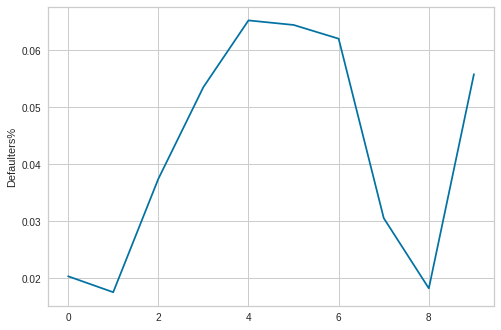

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

* We can see that as the outstanding balance increases the Default % also keeps increasing but after some point this trend decreases. May be Extreme high credit utilization where defaulters are less is from prople who have high income and their expenditure is also high.

### No_of_times_90_DPD_or_worse_in_last_6_months

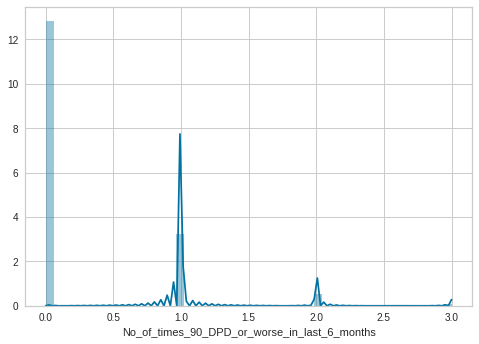

In [0]:
sns.distplot(credit_df.No_of_times_90_DPD_or_worse_in_last_6_months)

* Max number of people have not gone 90 DPD. Few have gone 1 times and then the count subsequently decreased.

In [0]:
np.quantile(credit_df.No_of_times_90_DPD_or_worse_in_last_6_months, np.arange(0,1.01, 0.01))

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 2., 2., 3.])

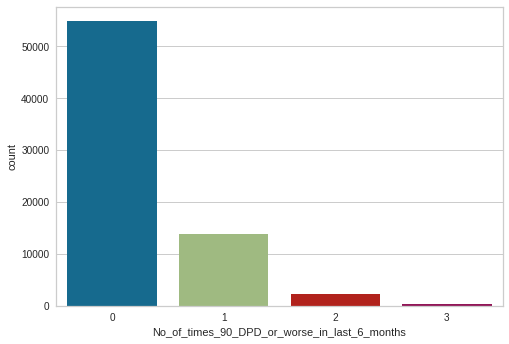

In [0]:
sns.countplot(x=credit_df.No_of_times_90_DPD_or_worse_in_last_6_months)

In [0]:
DPD_90 = credit_df.groupby(['No_of_times_90_DPD_or_worse_in_last_6_months', 'Performance_Tag']).size().unstack(1)
DPD_90

Performance_Tag,0.0,1.0
No_of_times_90_DPD_or_worse_in_last_6_months,,
0,52870,1794
1,12248,971
2,1616,160
3,185,23


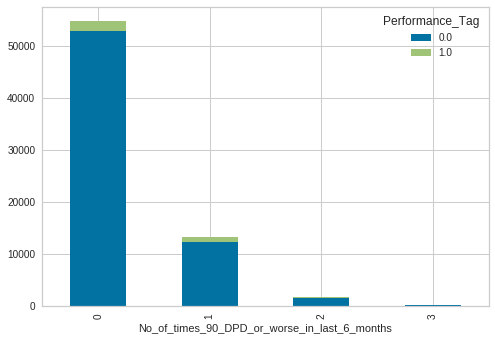

In [0]:
DPD_90.plot(kind='bar', stacked = True)

In [0]:
corr_2_creds('No_of_times_90_DPD_or_worse_in_last_6_months', 'Performance_Tag')

Performance_Tag,0.0,1.0,perc
No_of_times_90_DPD_or_worse_in_last_6_months,,,
0,52870,1794,0.032819
1,12248,971,0.073455
2,1616,160,0.090090
3,185,23,0.110577


* As the number of times 90 DPD increase in the last 6 months, the percentage of defaulters have also increased.
* Bank should start taking appropriate actions the moment some crosses 90 DPD for the first time in order to ascertain minimal loss.

### No_of_times_60_DPD_or_worse_in_last_6_months

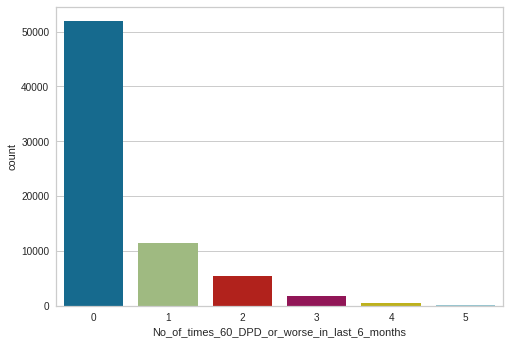

In [0]:
sns.countplot(x=credit_df.No_of_times_60_DPD_or_worse_in_last_6_months)

In [0]:
DPD_60 = credit_df.groupby(['No_of_times_60_DPD_or_worse_in_last_6_months', 'Performance_Tag']).size().unstack(1)
DPD_60

Performance_Tag,0.0,1.0
No_of_times_60_DPD_or_worse_in_last_6_months,,
0,50287,1582
1,10348,784
2,4527,389
3,1321,148
4,372,39
5,64,6


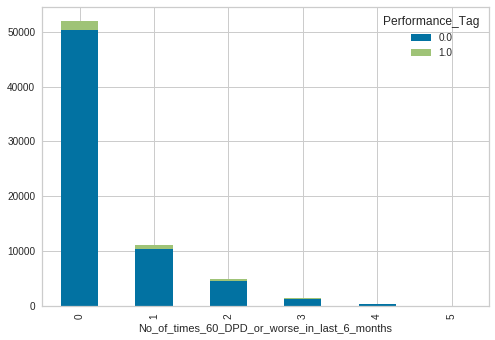

In [0]:
DPD_60.plot(kind='bar', stacked = True)

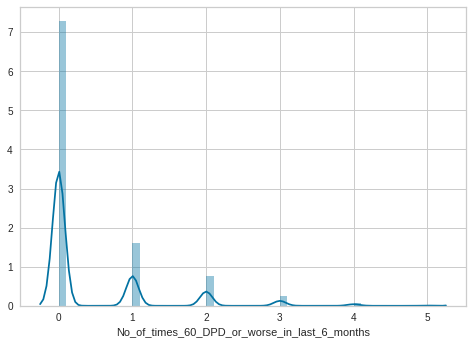

In [0]:
sns.distplot(credit_df.No_of_times_60_DPD_or_worse_in_last_6_months)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.No_of_trades_opened_in_last_6_months, 10)

D = pd.DataFrame({'bins':credit_df.No_of_times_60_DPD_or_worse_in_last_6_months, 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,1582.0,51869,50287.0,0.030500
1,1,784.0,11132,10348.0,0.070428
2,2,389.0,4916,4527.0,0.079129
3,3,148.0,1469,1321.0,0.100749
4,4,39.0,411,372.0,0.094891
5,5,6.0,70,64.0,0.085714


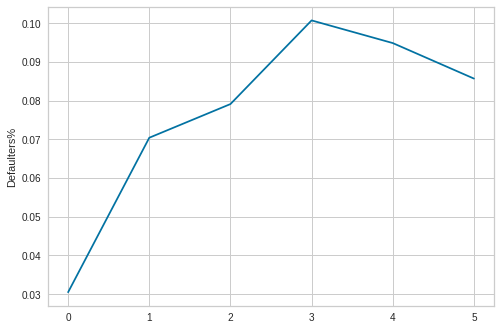

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

* After defaulting for 3 times in 60-DPD category. The Default rate has gone down a little.

### No_of_times_30_DPD_or_worse_in_last_6_months

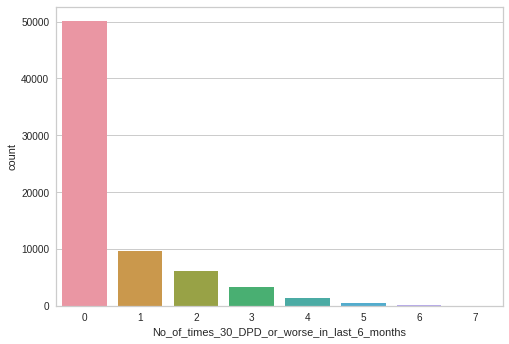

In [0]:
sns.countplot(x=credit_df.No_of_times_30_DPD_or_worse_in_last_6_months)

In [0]:
DPD_30 = credit_df.groupby(['No_of_times_30_DPD_or_worse_in_last_6_months', 'Performance_Tag']).size().unstack(1)
DPD_30

Performance_Tag,0.0,1.0
No_of_times_30_DPD_or_worse_in_last_6_months,,
0,48642,1455
1,8878,623
2,5432,466
3,2584,245
4,938,107
5,343,43
6,88,8
7,14,1


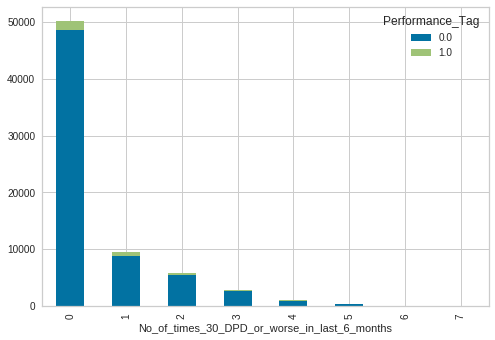

In [0]:
DPD_30.plot(kind='bar', stacked = True)

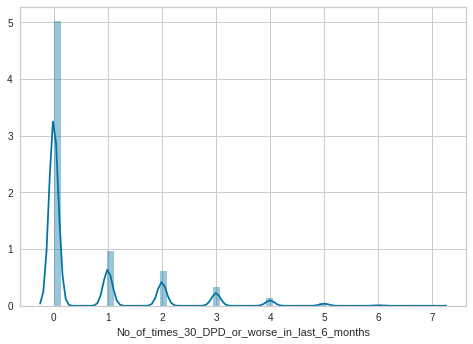

In [0]:
sns.distplot(credit_df.No_of_times_30_DPD_or_worse_in_last_6_months)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.No_of_trades_opened_in_last_6_months, 10)

D = pd.DataFrame({'bins':credit_df.No_of_times_30_DPD_or_worse_in_last_6_months, 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])

D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,1455.0,50097,48642.0,0.029044
1,1,623.0,9501,8878.0,0.065572
2,2,466.0,5898,5432.0,0.079010
3,3,245.0,2829,2584.0,0.086603
4,4,107.0,1045,938.0,0.102392
5,5,43.0,386,343.0,0.111399
6,6,8.0,96,88.0,0.083333
7,7,1.0,15,14.0,0.066667


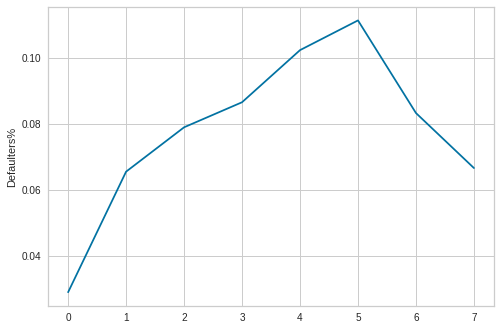

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

### No_of_times_90_DPD_or_worse_in_last_12_months                                          

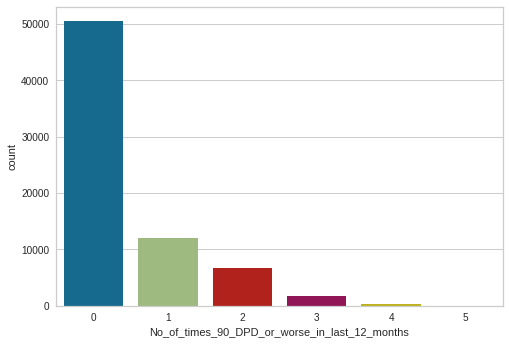

In [0]:
sns.countplot(x=credit_df.No_of_times_90_DPD_or_worse_in_last_12_months)

In [0]:
DPD_90_12 = credit_df.groupby(['No_of_times_90_DPD_or_worse_in_last_12_months', 'Performance_Tag']).size().unstack(1)
DPD_90_12

Performance_Tag,0.0,1.0
No_of_times_90_DPD_or_worse_in_last_12_months,,
0,48982,1510
1,10867,796
2,5671,489
3,1124,120
4,244,28
5,31,5


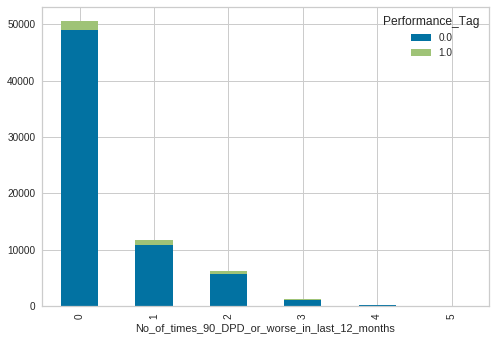

In [0]:
DPD_90_12.plot(kind='bar', stacked = True)

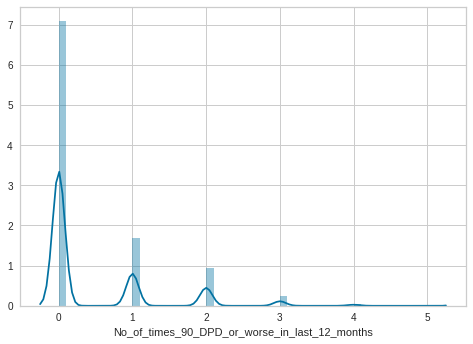

In [0]:
sns.distplot(credit_df.No_of_times_90_DPD_or_worse_in_last_12_months)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.No_of_trades_opened_in_last_6_months, 10)

D = pd.DataFrame({'bins':credit_df.No_of_times_90_DPD_or_worse_in_last_12_months, 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,1510.0,50492,48982.0,0.029906
1,1,796.0,11663,10867.0,0.068250
2,2,489.0,6160,5671.0,0.079383
3,3,120.0,1244,1124.0,0.096463
4,4,28.0,272,244.0,0.102941
5,5,5.0,36,31.0,0.138889


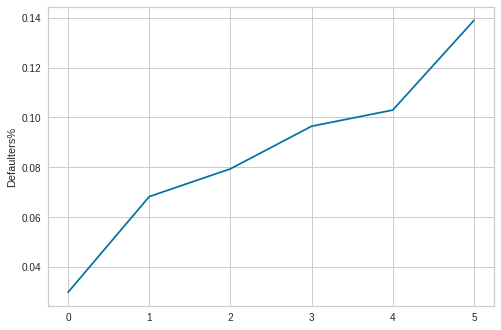

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

### No_of_times_60_DPD_or_worse_in_last_12_months                                

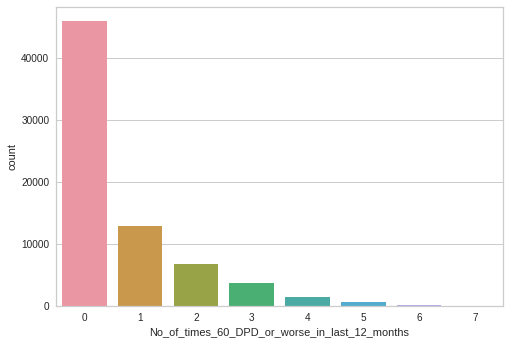

In [0]:
sns.countplot(x=credit_df.No_of_times_60_DPD_or_worse_in_last_12_months)

In [0]:
DPD_60_12 = credit_df.groupby(['No_of_times_60_DPD_or_worse_in_last_12_months', 'Performance_Tag']).size().unstack(1)
DPD_60_12

Performance_Tag,0.0,1.0
No_of_times_60_DPD_or_worse_in_last_12_months,,
0,44489.0,1378.0
1,12153.0,663.0
2,5932.0,483.0
3,2931.0,274.0
4,947.0,101.0
5,362.0,36.0
6,98.0,13.0
7,7.0,NaN


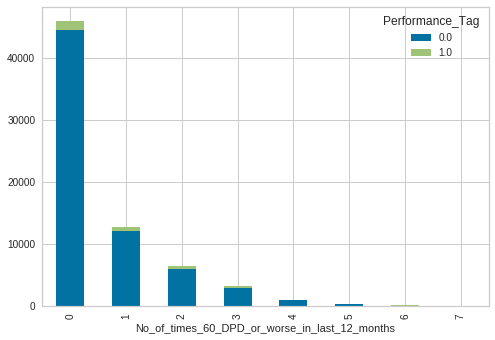

In [0]:
DPD_60_12.plot(kind='bar', stacked = True)

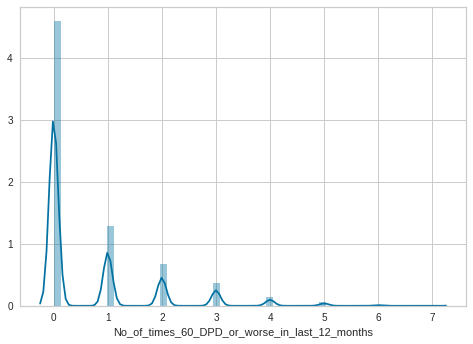

In [0]:
sns.distplot(credit_df.No_of_times_60_DPD_or_worse_in_last_12_months)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.No_of_trades_opened_in_last_6_months, 10)

D = pd.DataFrame({'bins':credit_df.No_of_times_60_DPD_or_worse_in_last_12_months, 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,1378.0,45867,44489.0,0.030043
1,1,663.0,12816,12153.0,0.051732
2,2,483.0,6415,5932.0,0.075292
3,3,274.0,3205,2931.0,0.085491
4,4,101.0,1048,947.0,0.096374
5,5,36.0,398,362.0,0.090452
6,6,13.0,111,98.0,0.117117
7,7,0.0,7,7.0,0.000000


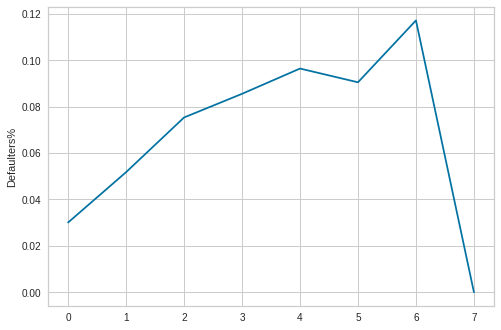

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

### No_of_times_30_DPD_or_worse_in_last_12_months

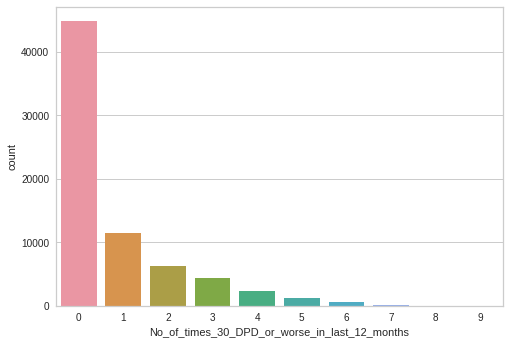

In [0]:
sns.countplot(x=credit_df.No_of_times_30_DPD_or_worse_in_last_12_months)

In [0]:
DPD_30_12 = credit_df.groupby(['No_of_times_30_DPD_or_worse_in_last_12_months', 'Performance_Tag']).size().unstack(1)
DPD_30_12

Performance_Tag,0.0,1.0
No_of_times_30_DPD_or_worse_in_last_12_months,,
0,43540.0,1316.0
1,10956.0,518.0
2,5665.0,452.0
3,3787.0,349.0
4,1751.0,173.0
5,764.0,89.0
6,338.0,38.0
7,96.0,11.0
8,21.0,2.0


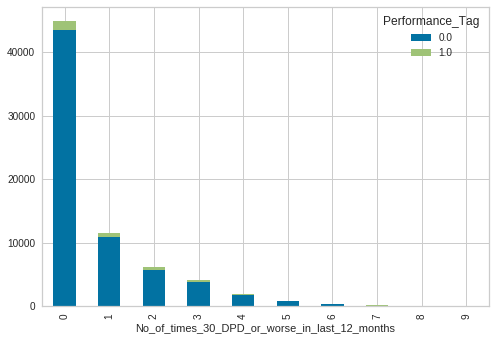

In [0]:
DPD_30_12.plot(kind='bar', stacked = True)

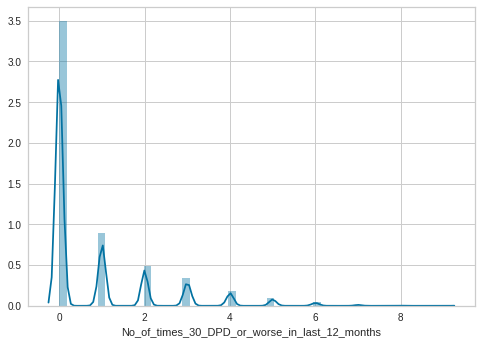

In [0]:
sns.distplot(credit_df.No_of_times_30_DPD_or_worse_in_last_12_months)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.No_of_trades_opened_in_last_6_months, 10)

D = pd.DataFrame({'bins':credit_df.No_of_times_30_DPD_or_worse_in_last_12_months, 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,1316.0,44856,43540.0,0.029338
1,1,518.0,11474,10956.0,0.045146
2,2,452.0,6117,5665.0,0.073892
3,3,349.0,4136,3787.0,0.084381
4,4,173.0,1924,1751.0,0.089917
5,5,89.0,853,764.0,0.104338
6,6,38.0,376,338.0,0.101064
7,7,11.0,107,96.0,0.102804
8,8,2.0,23,21.0,0.086957
9,9,0.0,1,1.0,0.000000


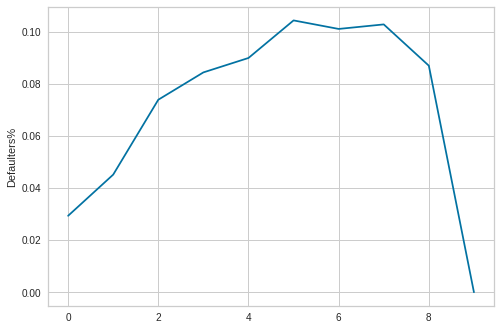

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

### No_of_trades_opened_in_last_6_months

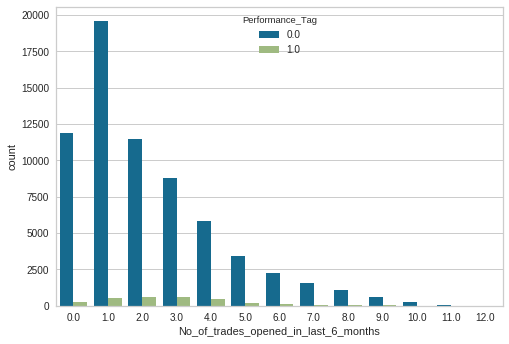

In [0]:
sns.countplot(x=credit_df.No_of_trades_opened_in_last_6_months, hue=credit_df.Performance_Tag)

In [0]:
trade_6 = credit_df.groupby(['No_of_trades_opened_in_last_6_months', 'Performance_Tag']).size().unstack(1)
trade_6

Performance_Tag,0.0,1.0
No_of_trades_opened_in_last_6_months,,
0.0,11921.0,272.0
1.0,19587.0,534.0
2.0,11477.0,639.0
3.0,8804.0,599.0
4.0,5861.0,436.0
5.0,3453.0,212.0
6.0,2227.0,109.0
7.0,1584.0,65.0
8.0,1102.0,52.0


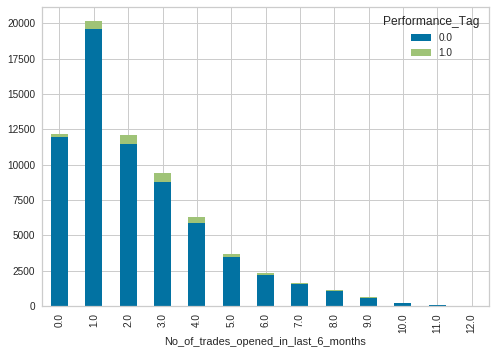

In [0]:
trade_6.plot(kind='bar', stacked = True)

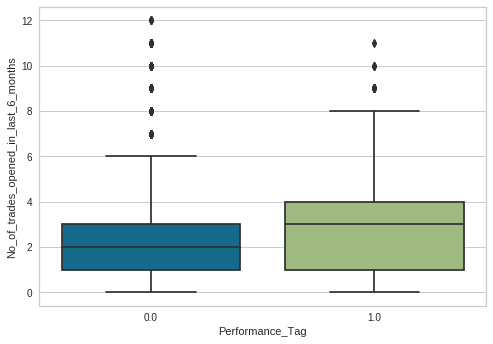

In [0]:
sns.boxplot(x=credit_df.Performance_Tag, y=credit_df.No_of_trades_opened_in_last_6_months)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.No_of_trades_opened_in_last_6_months, 10)

D = pd.DataFrame({'bins':credit_df.No_of_trades_opened_in_last_6_months, 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0.0,272.0,12193,11921.0,0.022308
1,1.0,534.0,20121,19587.0,0.026539
2,2.0,639.0,12116,11477.0,0.052740
3,3.0,599.0,9403,8804.0,0.063703
4,4.0,436.0,6297,5861.0,0.069239
5,5.0,212.0,3665,3453.0,0.057844
6,6.0,109.0,2336,2227.0,0.046661
7,7.0,65.0,1649,1584.0,0.039418
8,8.0,52.0,1154,1102.0,0.045061
9,9.0,21.0,618,597.0,0.033981


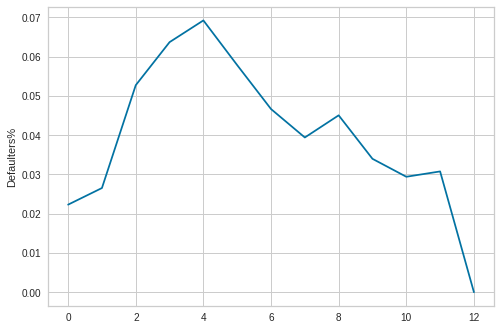

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

In [0]:
# There's one missing value for this column. Replacing it with the most frequent bin i.e, 1.0
credit_df.No_of_trades_opened_in_last_6_months.fillna(1.0, inplace=True)

### No_of_trades_opened_in_last_12_months

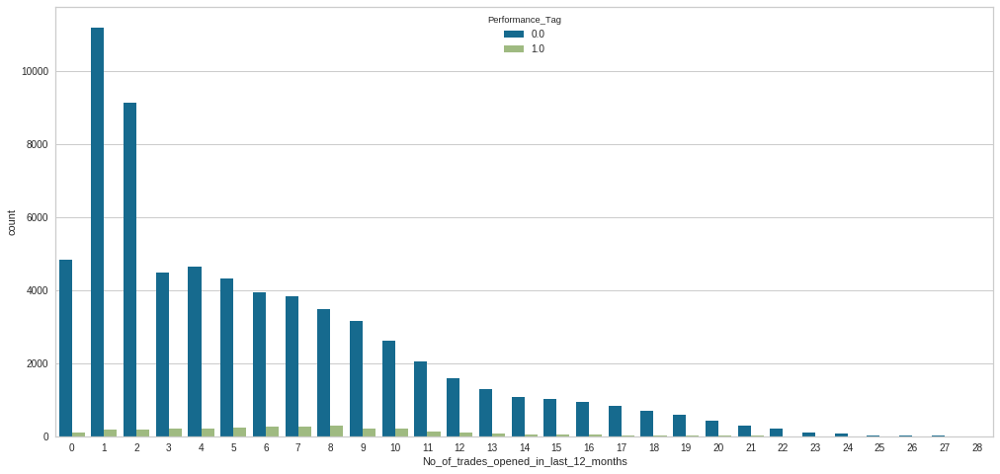

In [0]:
plt.figure(figsize=(17,8))
sns.countplot(x=credit_df.No_of_trades_opened_in_last_12_months, hue=credit_df.Performance_Tag)

In [0]:
trade_12 = credit_df.groupby(['No_of_trades_opened_in_last_12_months', 'Performance_Tag']).size().unstack(1)
trade_12

Performance_Tag,0.0,1.0
No_of_trades_opened_in_last_12_months,,
0,4844.0,111.0
1,11199.0,178.0
2,9145.0,178.0
3,4480.0,198.0
4,4642.0,208.0
5,4315.0,233.0
6,3939.0,267.0
7,3823.0,268.0
8,3494.0,305.0


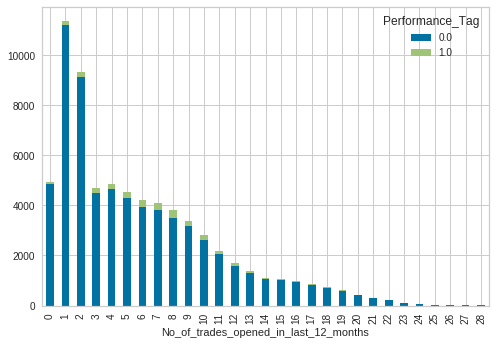

In [0]:
trade_12.plot(kind='bar', stacked = True)

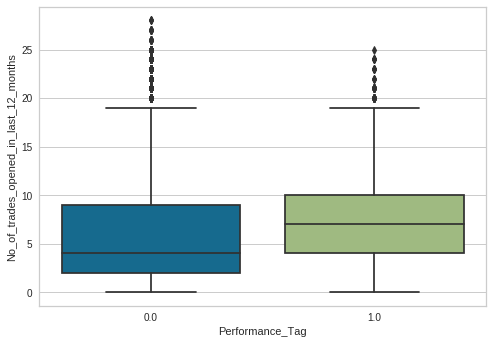

In [0]:
sns.boxplot(x=credit_df.Performance_Tag, y=credit_df.No_of_trades_opened_in_last_12_months)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.No_of_trades_opened_in_last_12_months, 10)

D = pd.DataFrame({'bins':credit_df.No_of_trades_opened_in_last_12_months, 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,111.0,4955,4844.0,0.022402
1,1,178.0,11377,11199.0,0.015646
2,2,178.0,9323,9145.0,0.019093
3,3,198.0,4678,4480.0,0.042326
4,4,208.0,4850,4642.0,0.042887
5,5,233.0,4548,4315.0,0.051231
6,6,267.0,4206,3939.0,0.063481
7,7,268.0,4091,3823.0,0.065510
8,8,305.0,3799,3494.0,0.080284
9,9,214.0,3376,3162.0,0.063389


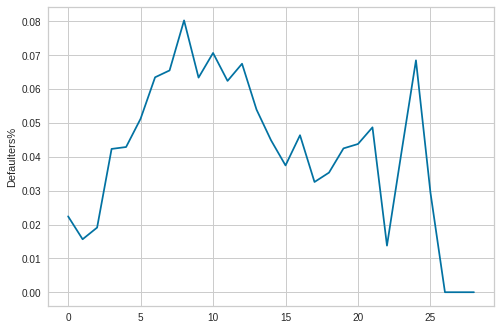

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

### No_of_PL_trades_opened_in_last_6_months

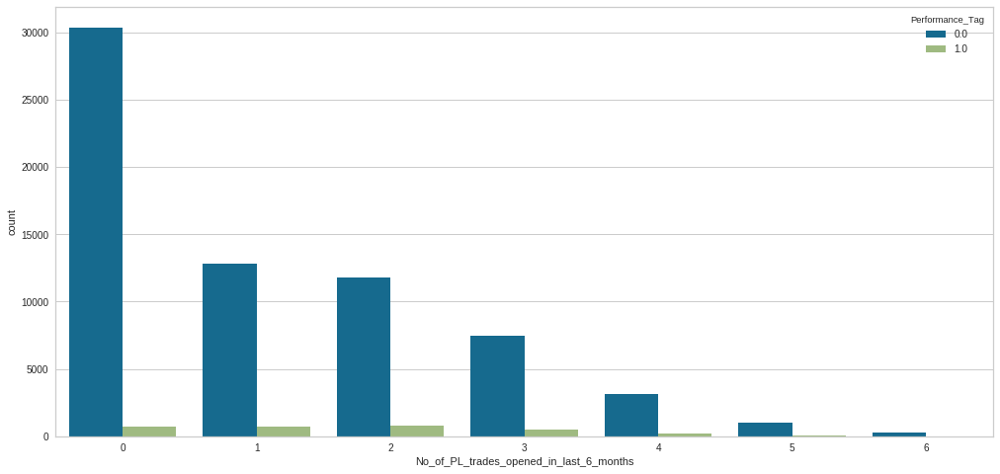

In [0]:
plt.figure(figsize=(17,8))
sns.countplot(x=credit_df.No_of_PL_trades_opened_in_last_6_months, hue=credit_df.Performance_Tag)

In [0]:
pl_trade_6 = credit_df.groupby(['No_of_PL_trades_opened_in_last_6_months', 'Performance_Tag']).size().unstack(1)
pl_trade_6

Performance_Tag,0.0,1.0
No_of_PL_trades_opened_in_last_6_months,,
0,30380,699
1,12855,692
2,11762,803
3,7448,501
4,3144,197
5,1042,48
6,288,8


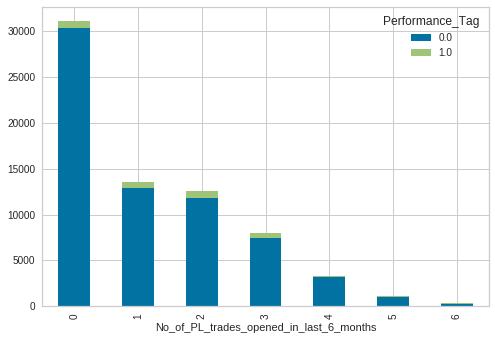

In [0]:
pl_trade_6.plot(kind='bar', stacked = True)

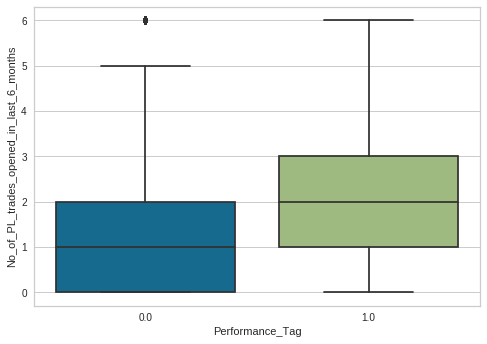

In [0]:
sns.boxplot(x=credit_df.Performance_Tag, y=credit_df.No_of_PL_trades_opened_in_last_6_months)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.No_of_trades_opened_in_last_12_months, 10)

D = pd.DataFrame({'bins':credit_df.No_of_PL_trades_opened_in_last_6_months, 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,699.0,31079,30380.0,0.022491
1,1,692.0,13547,12855.0,0.051081
2,2,803.0,12565,11762.0,0.063908
3,3,501.0,7949,7448.0,0.063027
4,4,197.0,3341,3144.0,0.058964
5,5,48.0,1090,1042.0,0.044037
6,6,8.0,296,288.0,0.027027


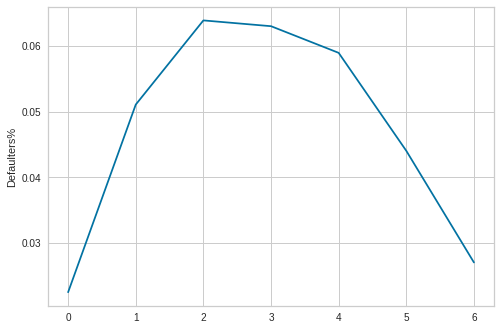

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

### No_of_PL_trades_opened_in_last_12_months

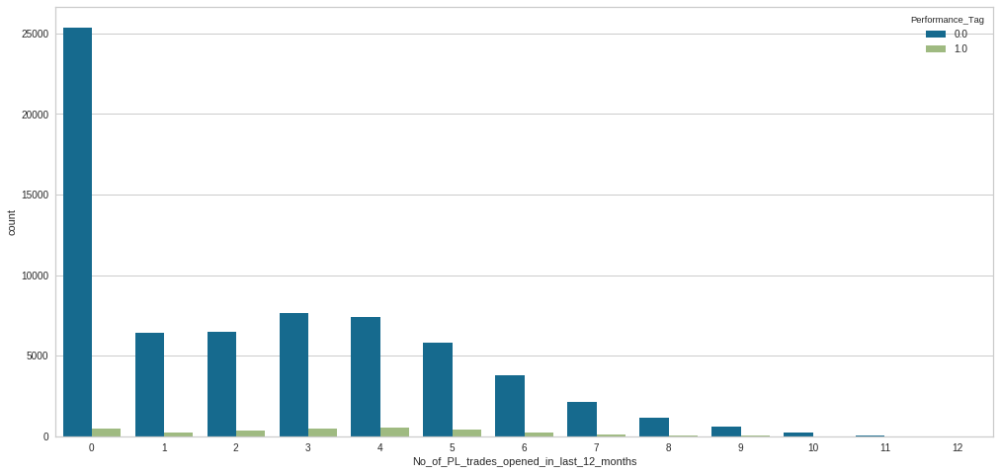

In [0]:
plt.figure(figsize=(17,8))
sns.countplot(x=credit_df.No_of_PL_trades_opened_in_last_12_months, hue=credit_df.Performance_Tag)

In [0]:
pl_trade_12 = credit_df.groupby(['No_of_PL_trades_opened_in_last_12_months', 'Performance_Tag']).size().unstack(1)
pl_trade_12

Performance_Tag,0.0,1.0
No_of_PL_trades_opened_in_last_12_months,,
0,25366,457
1,6394,247
2,6464,366
3,7623,508
4,7368,535
5,5798,391
6,3780,243
7,2114,109
8,1122,50


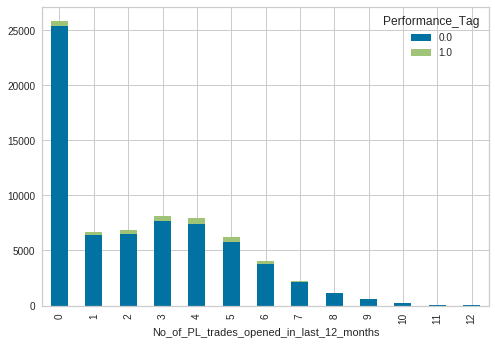

In [0]:
pl_trade_12.plot(kind='bar', stacked = True)

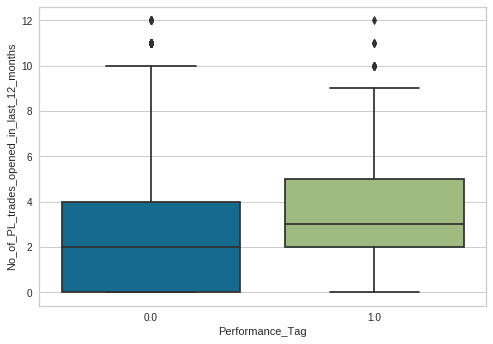

In [0]:
sns.boxplot(x=credit_df.Performance_Tag, y=credit_df.No_of_PL_trades_opened_in_last_12_months)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.No_of_trades_opened_in_last_12_months, 10)

D = pd.DataFrame({'bins':credit_df.No_of_PL_trades_opened_in_last_12_months, 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,457.0,25823,25366.0,0.017697
1,1,247.0,6641,6394.0,0.037193
2,2,366.0,6830,6464.0,0.053587
3,3,508.0,8131,7623.0,0.062477
4,4,535.0,7903,7368.0,0.067696
5,5,391.0,6189,5798.0,0.063177
6,6,243.0,4023,3780.0,0.060403
7,7,109.0,2223,2114.0,0.049033
8,8,50.0,1172,1122.0,0.042662
9,9,28.0,601,573.0,0.046589


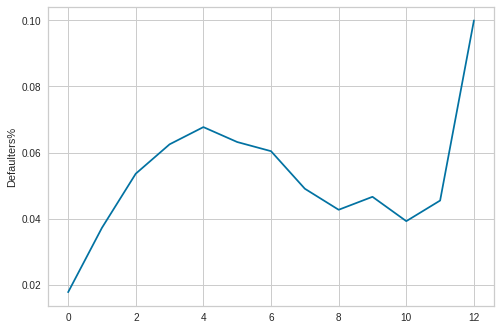

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

### No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans

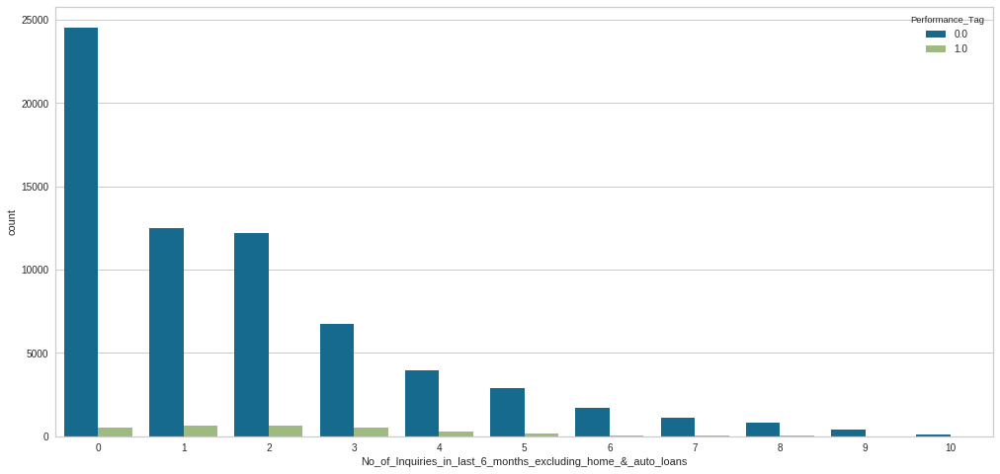

In [0]:
plt.figure(figsize=(17,8))
sns.countplot(x=credit_df['No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans'], hue=credit_df.Performance_Tag)

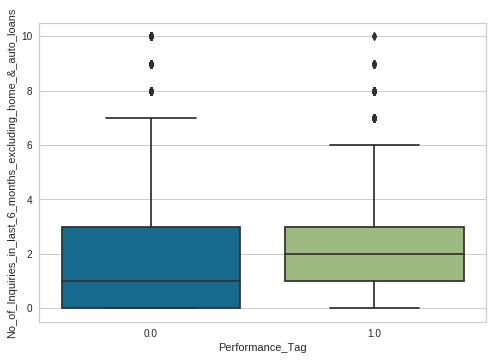

In [0]:
sns.boxplot(x=credit_df.Performance_Tag, y=credit_df['No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans'])

In [0]:
inq_6mon = credit_df.groupby(['No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans', 'Performance_Tag']).size().unstack()
inq_6mon

Performance_Tag,0.0,1.0
No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans,,
0,24541,527
1,12517,659
2,12167,665
3,6740,517
4,3979,269
5,2869,150
6,1677,73
7,1109,40
8,802,33


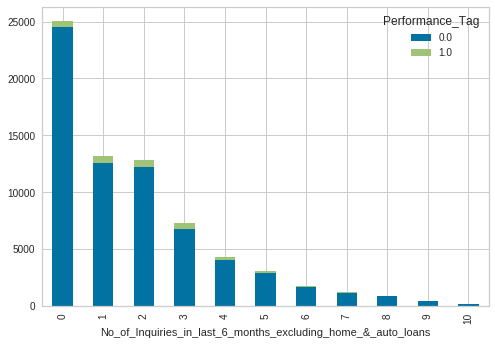

In [0]:
inq_6mon.plot(kind='bar', stacked=True)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.No_of_trades_opened_in_last_12_months, 10)

D = pd.DataFrame({'bins':credit_df['No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans'], 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,527.0,25068,24541.0,0.021023
1,1,659.0,13176,12517.0,0.050015
2,2,665.0,12832,12167.0,0.051824
3,3,517.0,7257,6740.0,0.071242
4,4,269.0,4248,3979.0,0.063324
5,5,150.0,3019,2869.0,0.049685
6,6,73.0,1750,1677.0,0.041714
7,7,40.0,1149,1109.0,0.034813
8,8,33.0,835,802.0,0.039521
9,9,13.0,425,412.0,0.030588


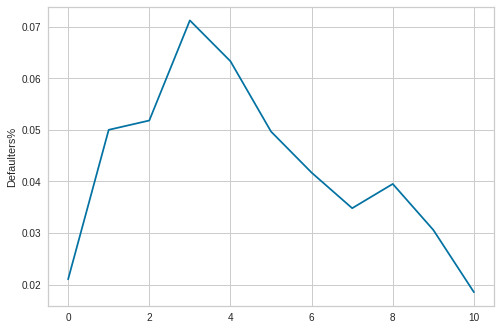

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

### No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans

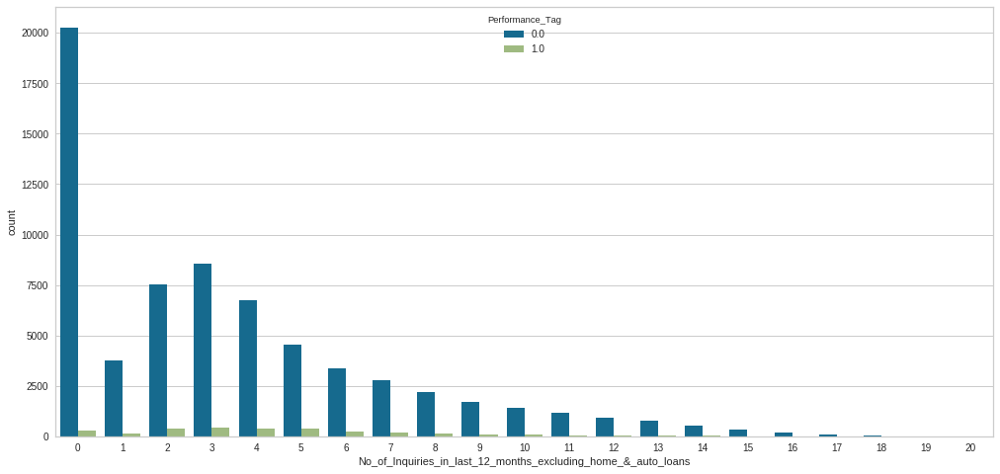

In [0]:
plt.figure(figsize=(17,8))
sns.countplot(x=credit_df['No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans'], hue=credit_df.Performance_Tag)

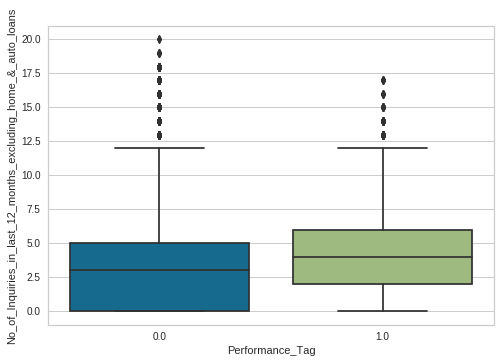

In [0]:
sns.boxplot(x=credit_df.Performance_Tag, y=credit_df['No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans'])

In [0]:
inq_12mon = credit_df.groupby(['No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans', 'Performance_Tag']).size().unstack()
inq_12mon

Performance_Tag,0.0,1.0
No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans,,
0,20273.0,307.0
1,3744.0,155.0
2,7525.0,382.0
3,8535.0,444.0
4,6733.0,380.0
5,4564.0,362.0
6,3368.0,247.0
7,2783.0,209.0
8,2204.0,141.0


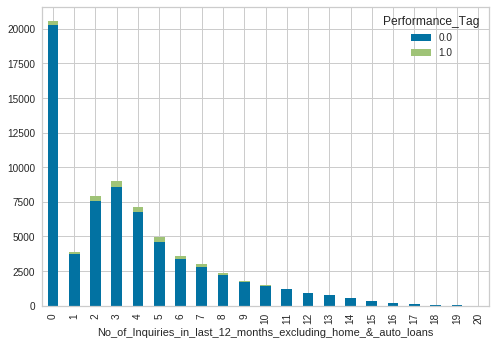

In [0]:
inq_12mon.plot(kind='bar', stacked=True)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.No_of_trades_opened_in_last_12_months, 10)

D = pd.DataFrame({'bins':credit_df['No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans'], 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,307.0,20580,20273.0,0.014917
1,1,155.0,3899,3744.0,0.039754
2,2,382.0,7907,7525.0,0.048312
3,3,444.0,8979,8535.0,0.049449
4,4,380.0,7113,6733.0,0.053423
5,5,362.0,4926,4564.0,0.073488
6,6,247.0,3615,3368.0,0.068326
7,7,209.0,2992,2783.0,0.069853
8,8,141.0,2345,2204.0,0.060128
9,9,71.0,1777,1706.0,0.039955


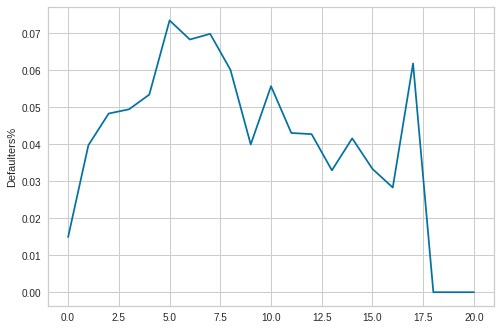

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

### Presence_of_open_home_loan

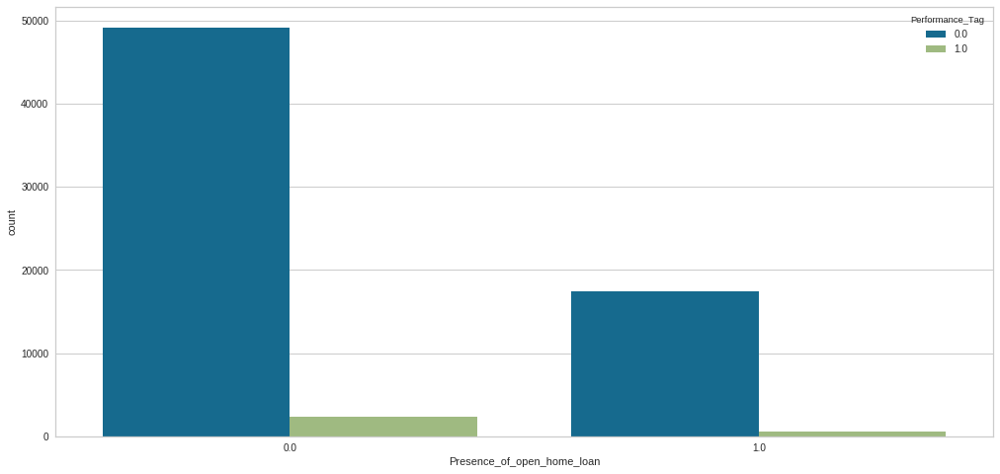

In [0]:
plt.figure(figsize=(17,8))
sns.countplot(x=credit_df['Presence_of_open_home_loan'], hue=credit_df.Performance_Tag)

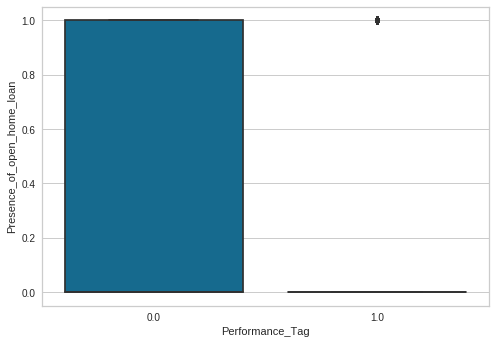

In [0]:
sns.boxplot(x=credit_df.Performance_Tag, y=credit_df['Presence_of_open_home_loan'])

In [0]:
open_home_ln = credit_df.groupby(['Presence_of_open_home_loan', 'Performance_Tag']).size().unstack()
open_home_ln

Performance_Tag,0.0,1.0
Presence_of_open_home_loan,,
0.0,49191,2333
1.0,17464,607


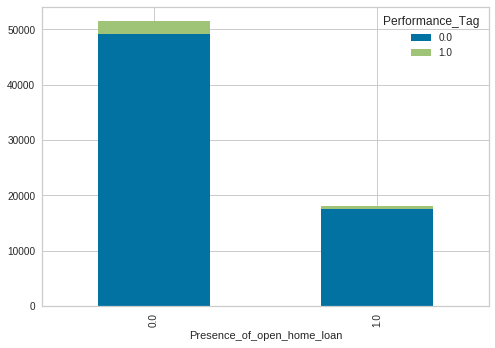

In [0]:
open_home_ln.plot(kind='bar', stacked=True)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.Presence_of_open_home_loan, 10)

D = pd.DataFrame({'bins':credit_df['Presence_of_open_home_loan'], 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0.0,2333.0,51524,49191.0,0.04528
1,1.0,607.0,18071,17464.0,0.03359


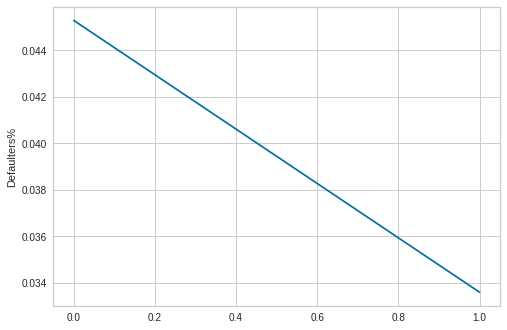

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

In [0]:
# Replacing the Null values with 0.0 as that's the majority class

credit_df['Presence_of_open_home_loan'].fillna(0.0, inplace=True)


### Total_No_of_Trades

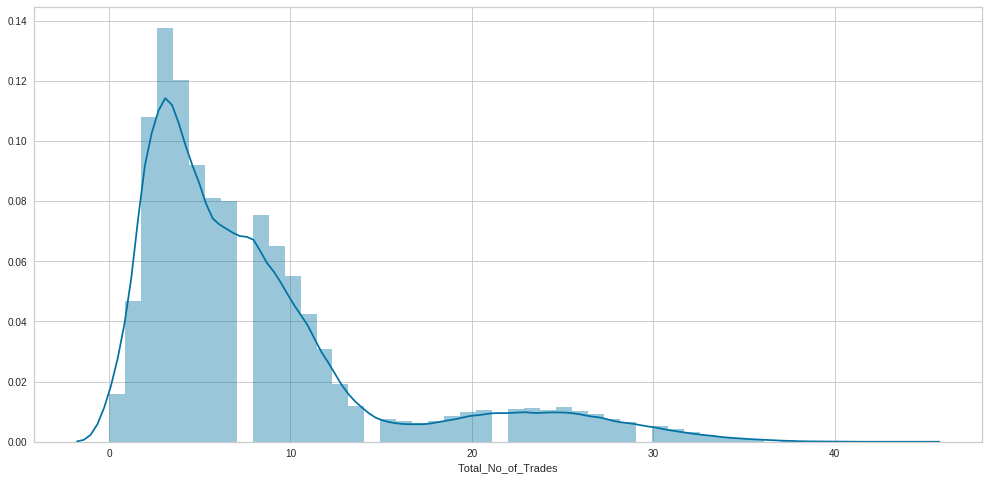

In [0]:
plt.figure(figsize=(17,8))
sns.distplot(credit_df['Total_No_of_Trades'])

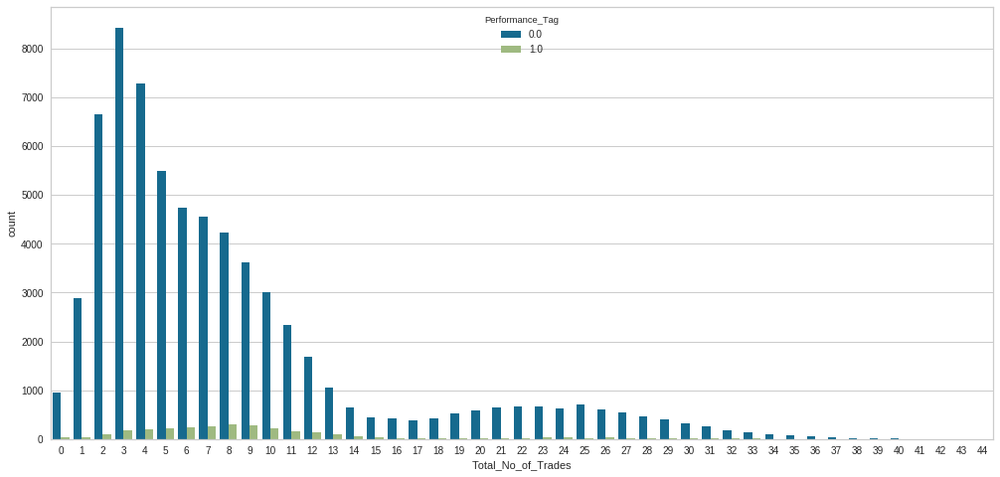

In [0]:
plt.figure(figsize=(17,8))
sns.countplot(x=credit_df['Total_No_of_Trades'], hue=credit_df.Performance_Tag)

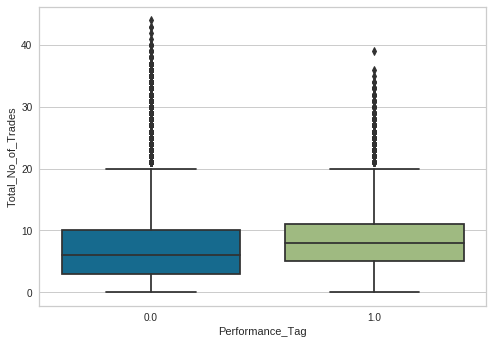

In [0]:
sns.boxplot(x=credit_df.Performance_Tag, y=credit_df['Total_No_of_Trades'])

In [0]:
trade_num = credit_df.groupby(['Total_No_of_Trades', 'Performance_Tag']).size().unstack()
trade_num

Performance_Tag,0.0,1.0
Total_No_of_Trades,,
0,946.0,42.0
1,2882.0,44.0
2,6659.0,106.0
3,8431.0,184.0
4,7285.0,205.0
5,5484.0,230.0
6,4729.0,238.0
7,4558.0,270.0
8,4237.0,296.0


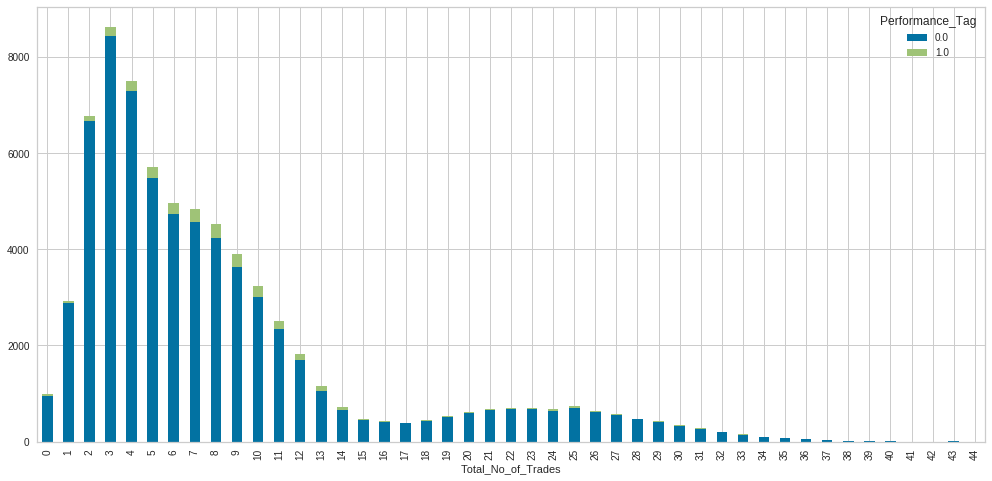

In [0]:

trade_num.plot(kind='bar', stacked=True, figsize=(17,8))

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.Presence_of_open_home_loan, 10)

D = pd.DataFrame({'bins':credit_df['Total_No_of_Trades'], 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,42.0,988,946.0,0.042510
1,1,44.0,2926,2882.0,0.015038
2,2,106.0,6765,6659.0,0.015669
3,3,184.0,8615,8431.0,0.021358
4,4,205.0,7490,7285.0,0.027370
5,5,230.0,5714,5484.0,0.040252
6,6,238.0,4967,4729.0,0.047916
7,7,270.0,4828,4558.0,0.055924
8,8,296.0,4533,4237.0,0.065299
9,9,282.0,3906,3624.0,0.072197


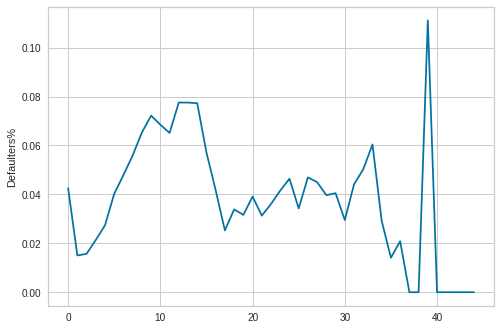

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

### Presence_of_open_auto_loan

In [0]:
open_auto_ln = credit_df.groupby(['Presence_of_open_auto_loan', 'Performance_Tag']).size().unstack()
open_auto_ln

Performance_Tag,0.0,1.0
Presence_of_open_auto_loan,,
0,61209,2729
1,5710,219


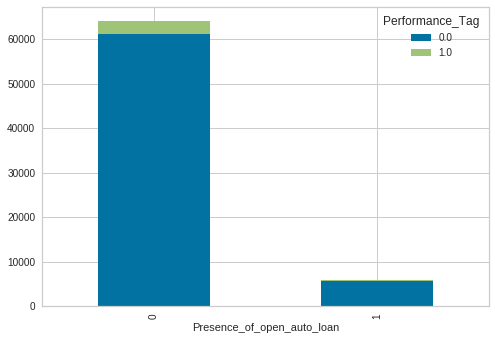

In [0]:
open_auto_ln.plot(kind='bar', stacked=True)

In [0]:
# binned_CC_12_mon = pd.qcut(credit_df.Presence_of_open_home_loan, 10)

D = pd.DataFrame({'bins':credit_df['Presence_of_open_auto_loan'], 'y':credit_df.Performance_Tag})
D_grp = D.groupby('bins', as_index=False).agg({'y':['sum', 'count']})
D_grp.columns=['bins', 'Defaulters', 'Count']
D_grp['Non-Defaulters'] = D_grp['Count'] - D_grp['Defaulters']
D_grp['Defaulters%'] = D_grp['Defaulters']/(D_grp['Defaulters']+D_grp['Non-Defaulters'])
D_grp

,bins,Defaulters,Count,Non-Defaulters,Defaulters%
0,0,2729.0,63938,61209.0,0.042682
1,1,219.0,5929,5710.0,0.036937


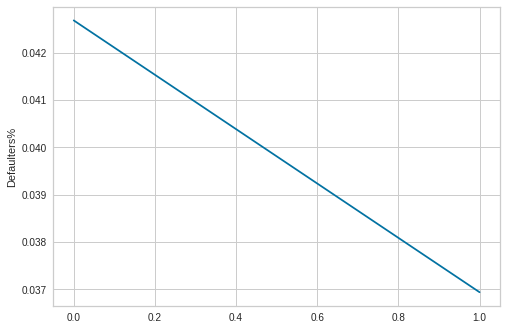

In [0]:
sns.lineplot(x=D_grp.index, y=D_grp['Defaulters%'])
plt.show()

### Performance_Tag

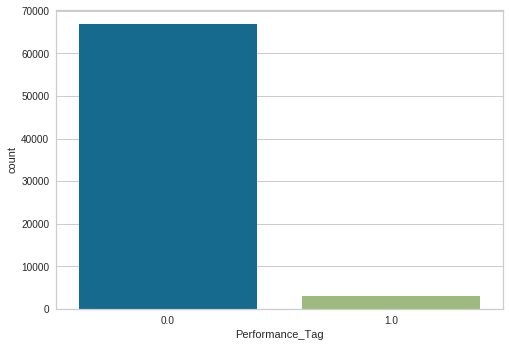

In [0]:
sns.countplot(credit_df.Performance_Tag)

* There's high data imbalance between the two categories.

In [0]:
credit_partial = credit_df[credit_df.Performance_Tag.notnull()]
credit_full = credit_df.copy()

In [0]:
# Removing Null values from the Performance Tag as there's no way to validate this Data. In ideal situation we could have circled back to the business to double check this data.
# We will validate the performance of these Null rows that are removed now on the Model to see what the outcomes are. For now we will consider these applicants as the ones who would default and were unfit for the Card.
credit_partial.isnull().sum()


Application_ID                                                   0
No_of_times_90_DPD_or_worse_in_last_6_months                     0
No_of_times_60_DPD_or_worse_in_last_6_months                     0
No_of_times_30_DPD_or_worse_in_last_6_months                     0
No_of_times_90_DPD_or_worse_in_last_12_months                    0
No_of_times_60_DPD_or_worse_in_last_12_months                    0
No_of_times_30_DPD_or_worse_in_last_12_months                    0
Avgas_CC_Utilization_in_last_12_months                           0
No_of_trades_opened_in_last_6_months                             0
No_of_trades_opened_in_last_12_months                            0
No_of_PL_trades_opened_in_last_6_months                          0
No_of_PL_trades_opened_in_last_12_months                         0
No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans     0
No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans    0
Presence_of_open_home_loan                                    

* Now that we don't have any NULL values, we can proceed with subsequent steps.

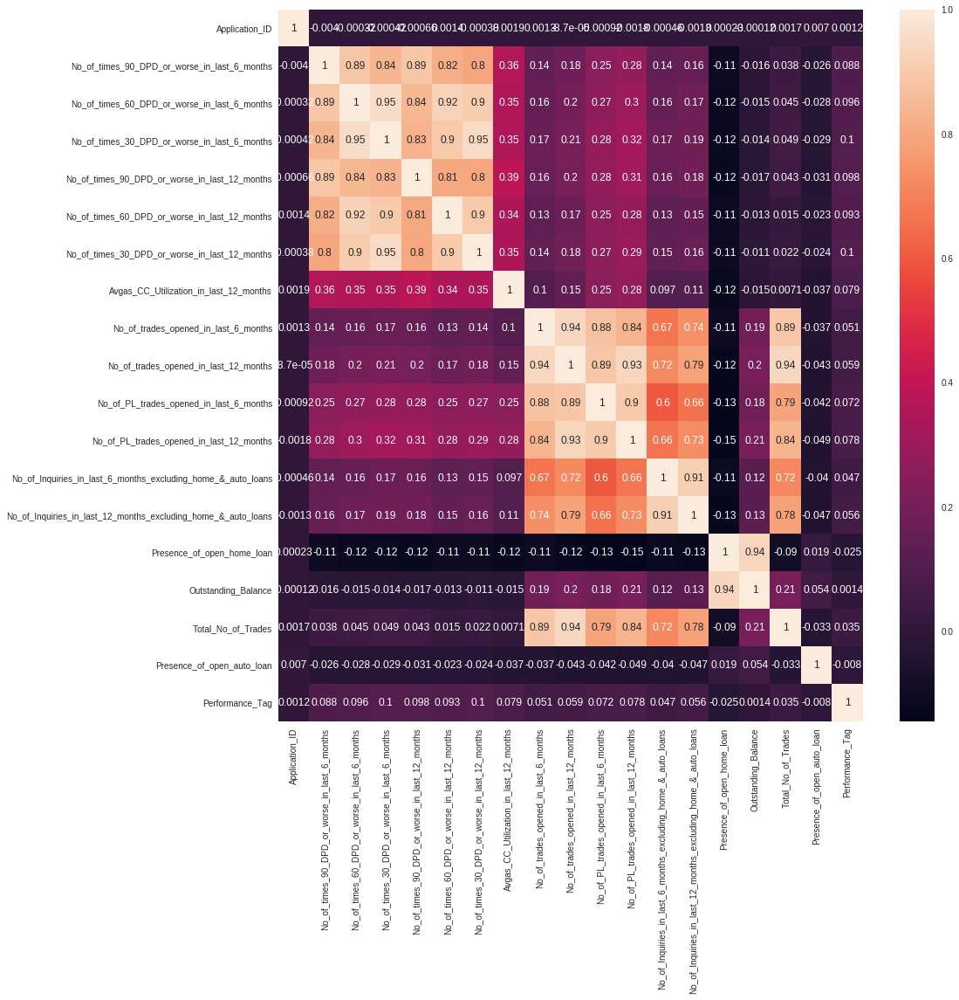

In [0]:
plt.figure(figsize = (15, 15))
sns.heatmap(credit_partial.corr(), annot = True)
plt.show()

# Building Model On Demographic Dataset

### Weight Of Evidence(WOE) and Information Value(IV) Treatment

In [0]:
iv, woe = iv_woe(data = demo_partial, target = 'Performance_Tag', bins=10, show_woe = True)

Application_ID
Information value of Application_ID is 0.001487
         Variable                       Cutoff  ...       WoE            IV
0  Application_ID     (100449.999, 99490857.8]  ... -0.010006  9.967684e-06
1  Application_ID    (99490857.8, 199470441.0]  ... -0.068746  4.580316e-04
2  Application_ID   (199470441.0, 298569304.0]  ...  0.035645  1.291359e-04
3  Application_ID   (298569304.0, 399380461.8]  ...  0.000663  4.400566e-08
4  Application_ID   (399380461.8, 498001549.0]  ...  0.059235  3.605619e-04
5  Application_ID   (498001549.0, 599104434.0]  ... -0.049898  2.433483e-04
6  Application_ID   (599104434.0, 699936232.0]  ...  0.011230  1.267637e-05
7  Application_ID   (699936232.0, 798890216.0]  ...  0.035645  1.291359e-04
8  Application_ID   (798890216.0, 899541680.4]  ... -0.035316  1.227312e-04
9  Application_ID  (899541680.4, 1000084142.0]  ...  0.014729  2.184329e-05

[10 rows x 9 columns]
Age
Information value of Age is 0.004169
  Variable          Cutoff     N  ...

In [0]:
iv

,Variable,IV
0,Application_ID,0.001487
0,Age,0.004169
0,Gender,0.000319
0,Marital_Status_at_the_time_of_application,0.000093
0,No_of_dependents,0.002652
0,Income,0.042842
0,Education,0.000764
0,Profession,0.002287
0,Type_of_residence,0.000920
0,No_of_months_in_current_residence,0.070893


In [0]:
woe

,Variable,Cutoff,N,Events,% of Events,Non-Events,% of Non-Events,WoE,IV
0,Age,"(19.999, 31.0]",7272,302.0,0.102442,6970.0,0.104156,-0.016588,2.842168e-05
1,Age,"(31.0, 36.0]",7866,342.0,0.116011,7524.0,0.112434,0.031314,1.119902e-04
2,Age,"(36.0, 39.0]",7145,320.0,0.108548,6825.0,0.101989,0.062329,4.088304e-04
3,Age,"(39.0, 42.0]",7003,310.0,0.105156,6693.0,0.100016,0.050111,2.575493e-04
4,Age,"(42.0, 45.0]",6879,278.0,0.094301,6601.0,0.098642,-0.044999,1.953161e-04
5,Age,"(45.0, 48.0]",6869,299.0,0.101425,6570.0,0.098178,0.032530,1.056035e-04
6,Age,"(48.0, 51.0]",6791,267.0,0.090570,6524.0,0.097491,-0.073638,5.096597e-04
7,Age,"(51.0, 54.0]",6786,248.0,0.084125,6538.0,0.097700,-0.149602,2.030902e-03
8,Age,"(54.0, 58.0]",6408,290.0,0.098372,6118.0,0.091424,0.073246,5.089023e-04
9,Age,"(58.0, 65.0]",6848,292.0,0.099050,6556.0,0.097969,0.010974,1.186289e-05


* Based on the above Information Values for each variables, we can conclude that only "Income", "No_of_months_in_current_residence" and "No_of_months_in_current_company" are the variables that's worth keeping in our dataset. except these anything which has a IV value of less than 0.02 are useless for prediction.

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text xticklabel objects>)

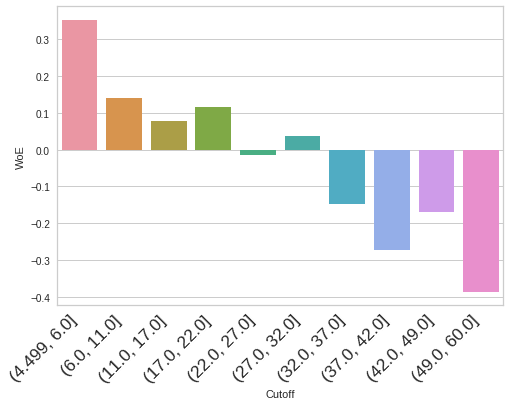

In [0]:
# Income Field WOE Monotonic Pattern
sns.barplot(x=woe[woe.Variable == 'Income']['Cutoff'], y=woe[woe.Variable == 'Income']['WoE'])
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large'  
)


(array([0, 1, 2, 3, 4, 5]), <a list of 6 Text xticklabel objects>)

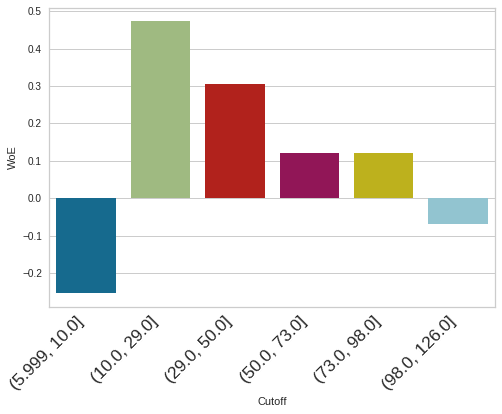

In [0]:
# No_of_months_in_current_residence Field WOE Monotonic Pattern

sns.barplot(x=woe[woe.Variable == 'No_of_months_in_current_residence']['Cutoff'], y=woe[woe.Variable == 'No_of_months_in_current_residence']['WoE'])
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large'  
)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text xticklabel objects>)

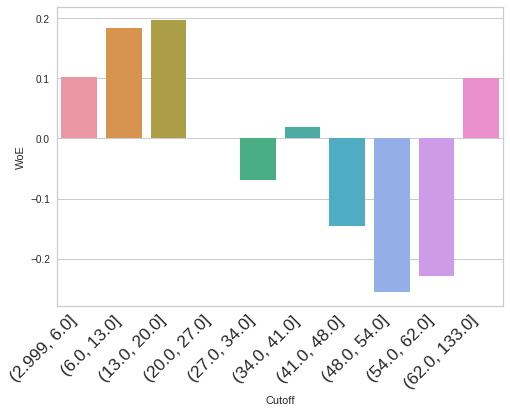

In [0]:
# No_of_months_in_current_company Field WOE Monotonic Pattern

sns.barplot(x=woe[woe.Variable == 'No_of_months_in_current_company']['Cutoff'], y=woe[woe.Variable == 'No_of_months_in_current_company']['WoE'])
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large'  
)

### Replacing the datset with their corresponding WOE values

In [0]:
demo_full.isnull().sum()

Application_ID                                  0
Age                                             0
Gender                                          0
Marital_Status_at_the_time_of_application       0
No_of_dependents                                0
Income                                          0
Education                                       0
Profession                                      0
Type_of_residence                               0
No_of_months_in_current_residence               0
No_of_months_in_current_company                 0
Performance_Tag                              1425
dtype: int64

In [0]:
woe = woe[woe.Variable != 'Application_ID']

In [0]:
def replace_woe(original_df, woe_df):
  for i,v in enumerate(woe.Variable.value_counts().index):
    var = woe_df[woe_df.Variable == v].set_index('Cutoff').to_dict()['WoE']
    original_df[v] = original_df[v].map(var)
  return original_df


In [0]:
demo_full_woe = demo_full.copy()


In [0]:
demo_full_woe = replace_woe(demo_full_woe, woe)

In [0]:
# Based on slightly different logic. Keeping the snippet for future reference.

# def replace_woe(fbinned_df, woe_df):
#   for var in woe_df.Variable.unique().tolist():
#     df_variable = woe_df.loc[woe_df.Variable.isin([var])]
#     rename_dict = df_variable.set_index('Cutoff').to_dict()['WoE']
#     fbinned_df[var] = fbinned_df[var].replace(rename_dict)
#   return fbinned_df

In [0]:
# demo_woe_df.reset_index(drop=True, inplace=True)

In [0]:
demo_full_woe.isnull().sum()

Application_ID                                  0
Age                                             0
Gender                                          0
Marital_Status_at_the_time_of_application       0
No_of_dependents                                0
Income                                          0
Education                                       0
Profession                                      0
Type_of_residence                               0
No_of_months_in_current_residence               0
No_of_months_in_current_company                 0
Performance_Tag                              1425
dtype: int64

In [0]:
# These rows has no missing values.
demo_partial_woe = demo_full_woe[demo_full_woe.Performance_Tag.notnull()]

# Performace Tag missing for these rows.
demo_delta_woe = demo_full_woe[demo_full_woe.Performance_Tag.isnull()]

In [0]:
demo_full.to_csv(path_or_buf='/content/drive/My Drive/demo_full.csv',index=False)
demo_partial.to_csv(path_or_buf='/content/drive/My Drive/demo_partial.csv',index=False)

demo_full_woe.to_csv(path_or_buf='/content/drive/My Drive/demo_full_woe.csv',index=False)
demo_partial_woe.to_csv(path_or_buf='/content/drive/My Drive/demo_partial_woe.csv',index=False)
demo_delta_woe.to_csv(path_or_buf='/content/drive/My Drive/demo_delta_woe.csv',index=False)

In [0]:
demo_partial_woe = pd.read_csv('/content/drive/My Drive/demo_partial_woe.csv')
demo_delta_woe = pd.read_csv('/content/drive/My Drive/demo_delta_woe.csv')

In [0]:
demo_partial_woe.head(5)

,Application_ID,Age,Gender,Marital_Status_at_the_time_of_application,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag
0,954457215,0.032530,0.031820,-0.004030,-0.085507,-0.273218,0.017020,-0.028710,-0.004353,-0.069491,-0.229240,0.0
1,432830445,-0.016588,-0.010033,-0.004030,-0.025646,-0.385850,-0.018175,-0.013652,-0.004353,-0.069491,-0.145849,0.0
2,941387308,0.031314,-0.010033,0.022972,-0.085507,-0.169700,0.017020,-0.013652,-0.004353,-0.069491,-0.255198,0.0
3,392161677,-0.044999,-0.010033,-0.004030,0.039731,-0.385850,0.017020,0.092553,-0.004353,0.121151,-0.255198,0.0
4,182011211,0.031314,0.031820,-0.004030,0.006023,-0.169700,-0.018175,-0.028710,-0.004353,-0.069491,-0.145849,0.0


In [0]:
demo_delta_woe.head(5)

,Application_ID,Age,Gender,Marital_Status_at_the_time_of_application,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag
0,906908303,0.031314,-0.010033,0.022972,0.039731,0.352682,0.017020,-0.028710,-0.004353,0.472881,0.196433,NaN
1,10990583,0.032530,0.031820,-0.004030,-0.025646,0.078752,0.007594,0.092553,-0.004353,-0.069491,0.000570,NaN
2,589678446,0.032530,-0.010033,-0.004030,0.053667,0.139283,-0.018175,0.092553,-0.004353,-0.253229,-0.068801,NaN
3,809411322,0.050111,-0.010033,-0.004030,0.053667,0.115591,0.007594,-0.028710,-0.004353,-0.253229,-0.145849,NaN
4,150246616,0.050111,0.031820,-0.004030,-0.025646,0.078752,-0.024417,-0.028710,-0.004353,-0.253229,-0.255198,NaN


### Train Test Split

In [0]:
# Dropping all the columns for which IV is less than 0.02 as they will hardly help in adding any value to the prediction
cols_rem = ['Age', 'Gender', 'Marital_Status_at_the_time_of_application',
       'No_of_dependents','Education', 'Profession',
       'Type_of_residence', 'Application_ID']
demo_partial_woe.drop(columns=cols_rem, inplace=True, axis=1)

NameError: ignored

In [0]:
demo_partial_woe.head(5)

NameError: ignored

In [0]:
# train test split
X = demo_partial_woe.drop(columns='Performance_Tag')
y = demo_partial_woe.Performance_Tag
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2, random_state=42, stratify=y)

In [0]:
y_train.value_counts()

0.0    53535
1.0     2358
Name: Performance_Tag, dtype: int64

In [0]:
y_test.value_counts()

0.0    13384
1.0      590
Name: Performance_Tag, dtype: int64

### SMOTEENN For Class Imbalance Treatment

In [0]:
from imblearn.combine import SMOTEENN

In [0]:
smt = SMOTEENN(random_state=42)

X_train_Smote, y_train_Smote = smt.fit_sample(X_train,y_train)

In [0]:
print("Number transactions X_train dataset: ", X_train_Smote.shape)
print("Number transactions y_train dataset: ", y_train_Smote.shape)

print('Non-Churn/Churn in train set: ',np.bincount(y_train_Smote.astype(int)))

Number transactions X_train dataset:  (37386, 3)
Number transactions y_train dataset:  (37386,)
Non-Churn/Churn in train set:  [17773 19613]


### Building Base Logistic Model

In [0]:
logit  = LogisticRegression(n_jobs=-1,random_state=100)
parameters = { 'C' : [1e-08,1e-07,1e-06,0.00001,0.0001,0.001,0.01, 0.1], 'penalty' : ['l1', 'l2']}

gc = grid_search(logit,X_train_Smote,y_train_Smote,parameters,5)


Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


0.7279554314763428
{'C': 0.001, 'penalty': 'l2'}


[Parallel(n_jobs=-1)]: Done  77 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    3.5s finished


In [0]:
print(gc.best_estimator_)

LogisticRegression(C=0.001, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=-1, penalty='l2',
                   random_state=100, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)


LogisticRegression(C=0.001, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=-1, penalty='l2',
                   random_state=100, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

 Classification report : 
               precision    recall  f1-score   support

         0.0       0.97      0.66      0.79     13384
         1.0       0.06      0.46      0.10       590

    accuracy                           0.65     13974
   macro avg       0.51      0.56      0.44     13974
weighted avg       0.93      0.65      0.76     13974

Accuracy   Score :  0.653141548590239


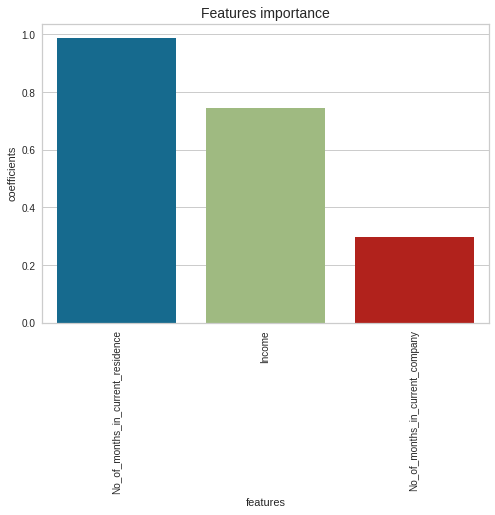

------------------------------------------------------------------------------------------------------------------------------------------------------
Area under curve :  0.5629341130821522 



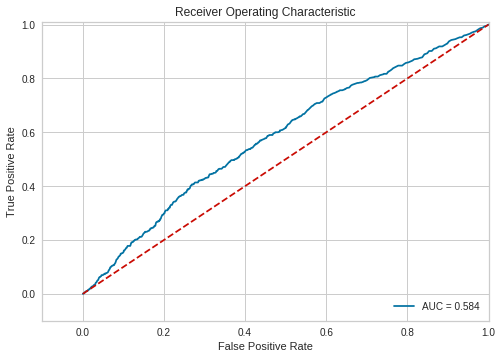

------------------------------------------------------------------------------------------------------------------------------------------------------


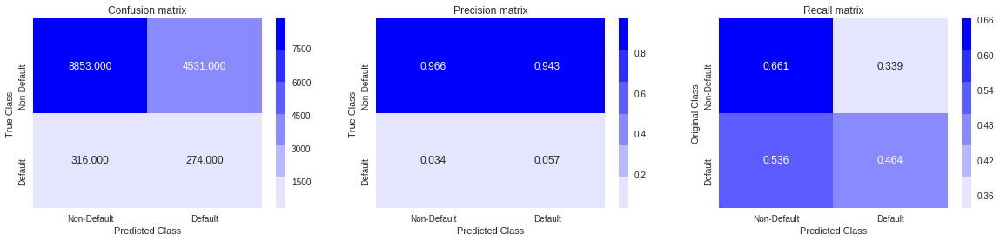

--------------------------------------------------------------- CUTOFF - DataFrame ------------------------------------------------------------------------
     prob  accuracy  sensi_recall     speci    precis       ppv       npv
0.0   0.0  0.524608      1.000000  0.000000  0.524608  0.524608       NaN
0.1   0.1  0.524608      1.000000  0.000000  0.524608  0.524608       NaN
0.2   0.2  0.524608      1.000000  0.000000  0.524608  0.524608       NaN
0.3   0.3  0.524608      1.000000  0.000000  0.524608  0.524608       NaN
0.4   0.4  0.605414      0.973793  0.198897  0.572907  0.572907  0.873055
0.5   0.5  0.668352      0.675215  0.660778  0.687163  0.687163  0.648338
0.6   0.6  0.558578      0.185030  0.970798  0.874879  0.874879  0.519105
0.7   0.7  0.475392      0.000000  1.000000       NaN       NaN  0.475392
0.8   0.8  0.475392      0.000000  1.000000       NaN       NaN  0.475392
0.9   0.9  0.475392      0.000000  1.000000       NaN       NaN  0.475392
------------------------------

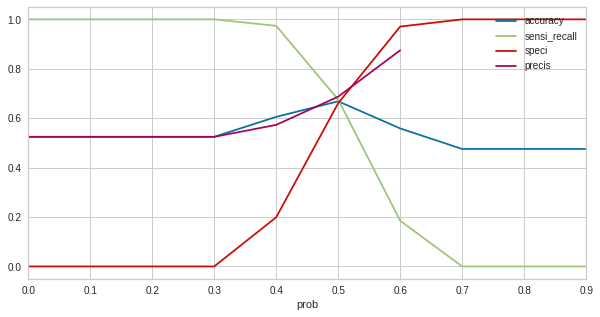

In [0]:
logit  = LogisticRegression(n_jobs=-1,random_state=100, penalty='l2', C=0.001, class_weight='balanced')

bank_risk_prediction(logit,X_train_Smote,X_test,y_train_Smote,y_test,
                         X_train.columns,"coefficients",threshold_plot = True)


* Predictions based on Cutoff

Sensitivity (trainset): 0.65	Specificity (trainset): 0.68
Sensitivity (testset): 0.44	Specificity (testset): 0.69
------------------------------------------------------------------------------------------------------------------------
LogisticRegression(C=0.001, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=-1, penalty='l2',
                   random_state=100, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.97      0.69      0.80     13384
         1.0       0.06      0.44      0.10       590

    accuracy                           0.68     13974
   macro avg       0.51      0.57      0.45     13974
weighted avg       0.93      0.68      0.77     13974

----------------------------------------------------------------------

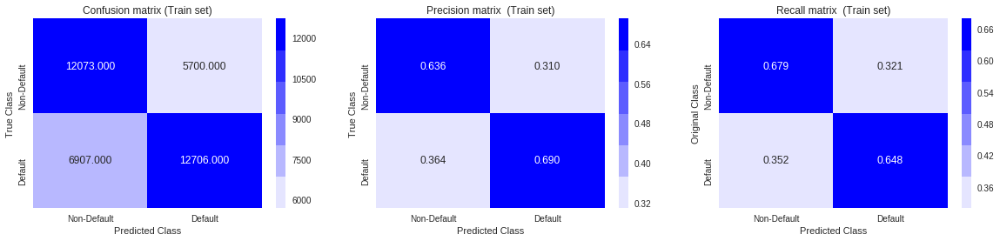

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[9201 4183]
 [ 328  262]]


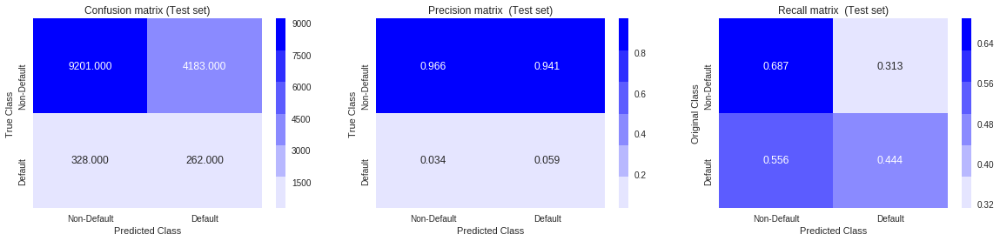

------------------------------------------------------------------------------------------------------------------------
Area under curve (testset):  0.5657652192853596 



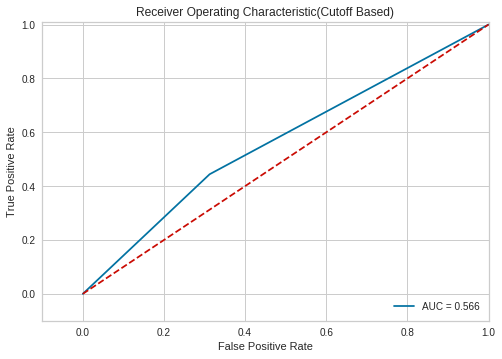

------------------------------------------------------------------------------------------------------------------------------------------------------


In [0]:
# logit  = LogisticRegression(n_jobs=-1,random_state=100, penalty='l2', C=0.001, class_weight='balanced')

bank_risk_prediction_cutoff(logit,X_train_Smote,X_test,y_train_Smote,y_test,0.51,X_test.columns)

* Predictions on Null Rows in Target Column(Performance Tag)

Sensitivity (trainset): 0.65	Specificity (trainset): 0.68
Sensitivity (testset): 0.55	Specificity (testset): 0.0
------------------------------------------------------------------------------------------------------------------------
LogisticRegression(C=0.001, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=-1, penalty='l2',
                   random_state=100, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         0
         1.0       1.00      0.55      0.71      1425

    accuracy                           0.55      1425
   macro avg       0.50      0.28      0.36      1425
weighted avg       1.00      0.55      0.71      1425

-----------------------------------------------------------------------

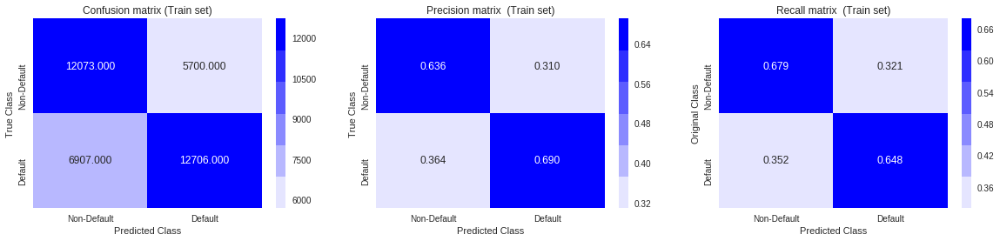

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[  0   0]
 [636 789]]


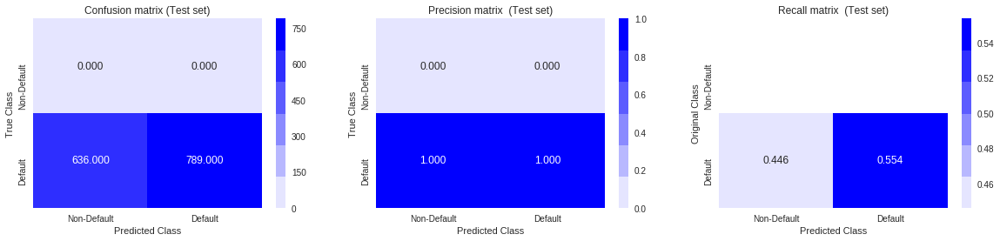

------------------------------------------------------------------------------------------------------------------------


In [0]:
woe_all_nulls_data = demo_delta_woe.copy() 
woe_all_nulls_data.Performance_Tag.fillna(1, inplace=True)

woe_all_nulls_data.drop(columns=['Application_ID', 'Age', 'Gender',
       'Marital_Status_at_the_time_of_application', 'No_of_dependents',
       'Education', 'Profession', 'Type_of_residence'], axis=1, inplace=True)


perf_all_nulls_X = woe_all_nulls_data.drop(columns=['Performance_Tag'])
perf_all_nulls_y = woe_all_nulls_data.Performance_Tag

bank_risk_prediction_cutoff(logit,X_train_Smote,perf_all_nulls_X,y_train_Smote,perf_all_nulls_y,0.51,perf_all_nulls_X.columns, all_nulls = True)

* We can see that model did correctly identify around 789 as defaulters but a substantial chunk of Applicants fall in False Negative which is not good.

### Decision Trees

In [0]:
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 500, 50),
    'min_samples_split': range(50, 500, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

In [0]:
# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1,n_jobs=-1)

In [0]:
# Fit the grid search to the data
grid_search.fit(X_train_Smote,y_train_Smote)

# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

Fitting 5 folds for each of 256 candidates, totalling 1280 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 116 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 716 tasks      | elapsed:   20.7s


best accuracy 0.94163590648906
DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=12,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=30, min_samples_split=30,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')


[Parallel(n_jobs=-1)]: Done 1280 out of 1280 | elapsed:   36.7s finished


[[8146 5238]
 [ 328  262]]
DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=12,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=30, min_samples_split=30,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

 Classification report : 
               precision    recall  f1-score   support

         0.0       0.96      0.61      0.74     13384
         1.0       0.05      0.44      0.09       590

    accuracy                           0.60     13974
   macro avg       0.50      0.53      0.42     13974
weighted avg       0.92      0.60      0.72     13974

Accuracy   Score :  0.6010447974810362


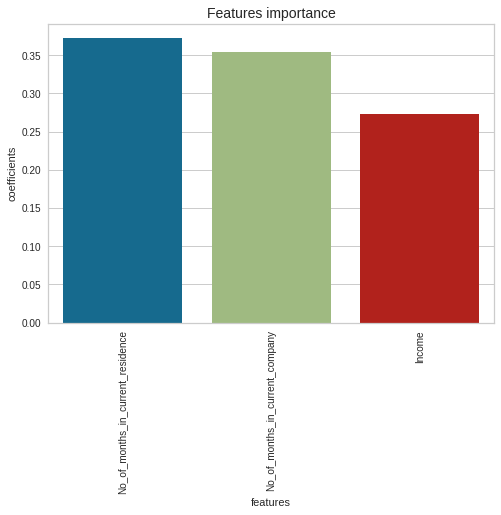

------------------------------------------------------------------------------------------------------------------------------------------------------
Area under curve :  0.5260162653104643 



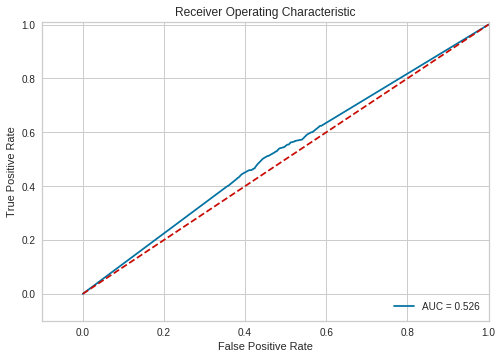

------------------------------------------------------------------------------------------------------------------------------------------------------


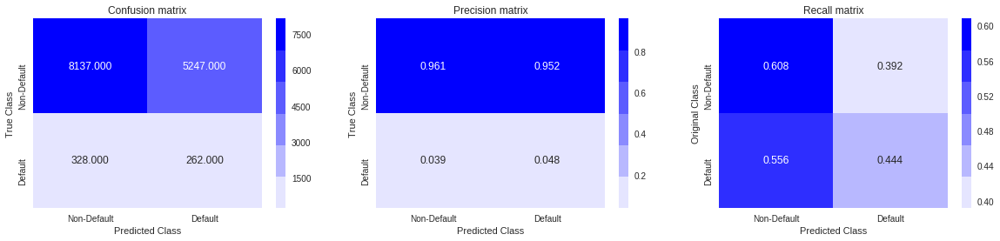

--------------------------------------------------------------- CUTOFF - DataFrame ------------------------------------------------------------------------
     prob  accuracy  sensi_recall     speci    precis       ppv       npv
0.0   0.0  0.854117      1.000000  0.693130  0.782423  0.782423  1.000000
0.1   0.1  0.898866      0.993321  0.794632  0.842210  0.842210  0.990810
0.2   0.2  0.917616      0.983225  0.845215  0.875153  0.875153  0.978568
0.3   0.3  0.938908      0.954979  0.921173  0.930406  0.930406  0.948826
0.4   0.4  0.943241      0.943252  0.943228  0.948280  0.948280  0.937741
0.5   0.5  0.945461      0.923520  0.969673  0.971102  0.971102  0.919932
0.6   0.6  0.942412      0.899047  0.990266  0.990284  0.990284  0.898876
0.7   0.7  0.939603      0.887116  0.997524  0.997477  0.997477  0.888984
0.8   0.8  0.936313      0.878601  1.000000  1.000000  1.000000  0.881860
0.9   0.9  0.936313      0.878601  1.000000  1.000000  1.000000  0.881860
------------------------------

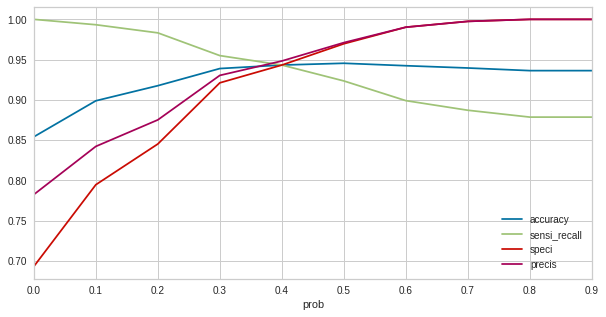

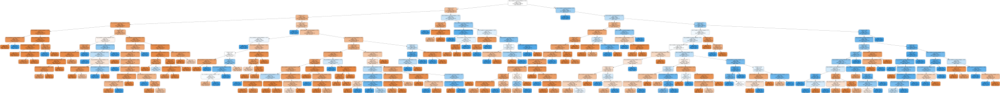

In [0]:
dtree  = gc.best_estimator_

plot_decision_tree(X_train_Smote,X_test,y_train_Smote,y_test,X_test.columns,12,"gini",'balanced',30,30,"best", model_performance=True)


* Predictions based on Cutoff

[[7794 5590]
 [ 321  269]]
Sensitivity (trainset): 0.94	Specificity (trainset): 0.94
Sensitivity (testset): 0.47	Specificity (testset): 0.57
------------------------------------------------------------------------------------------------------------------------
DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=12,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=30, min_samples_split=30,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.96      0.57      0.71     13384
         1.0       0.05      0.47      0.08       590

    accuracy                           0.56     13974
   macro avg       0.50      0.52      0.40     13974
weighted avg     

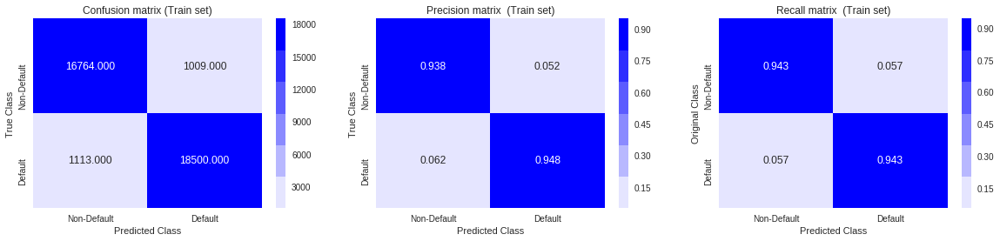

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[7597 5787]
 [ 314  276]]


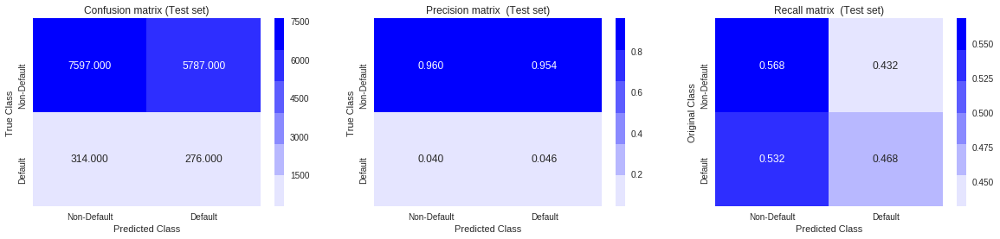

------------------------------------------------------------------------------------------------------------------------
Area under curve (testset):  0.5177073307870769 



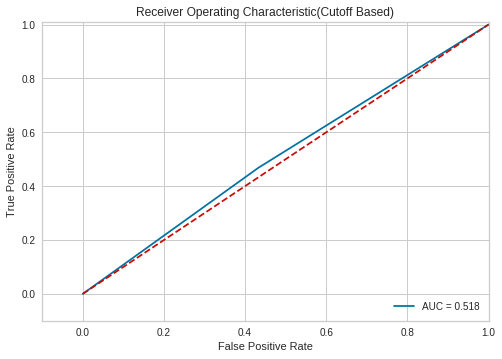

------------------------------------------------------------------------------------------------------------------------------------------------------


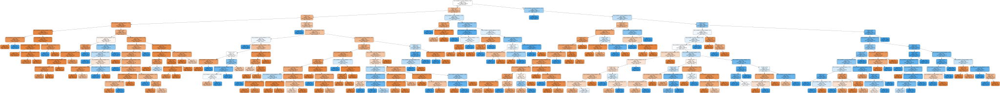

In [0]:
plot_decision_tree(X_train_Smote,X_test,y_train_Smote,y_test,X_test.columns,12,"gini",'balanced',30,30,"best",cut_off = 0.4)

* Predictions on Null Rows in Target Column(Performance Tag)

[[  0   0]
 [602 823]]
Sensitivity (trainset): 0.94	Specificity (trainset): 0.94
Sensitivity (testset): 0.58	Specificity (testset): 0.0
------------------------------------------------------------------------------------------------------------------------
DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=12,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=30, min_samples_split=30,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         0
         1.0       1.00      0.58      0.74      1425

    accuracy                           0.58      1425
   macro avg       0.50      0.29      0.37      1425
weighted avg       1.0

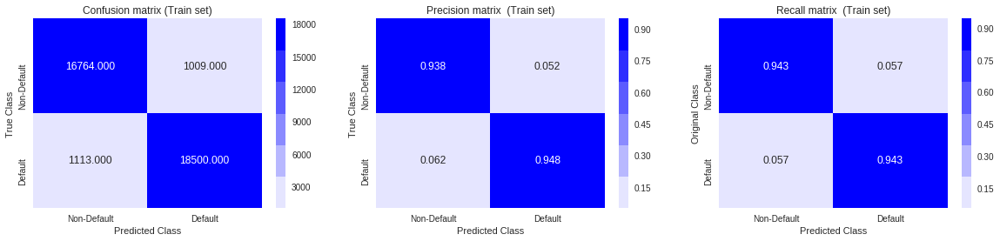

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[  0   0]
 [594 831]]


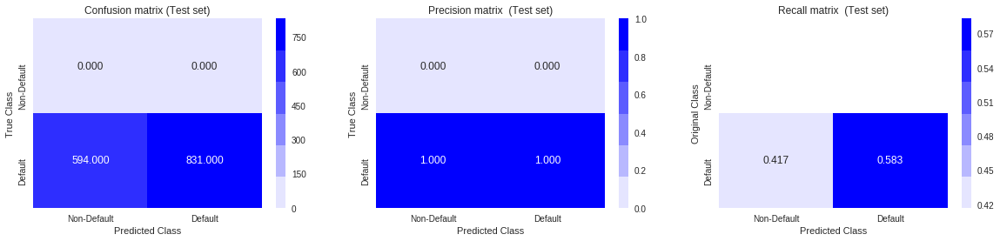

------------------------------------------------------------------------------------------------------------------------


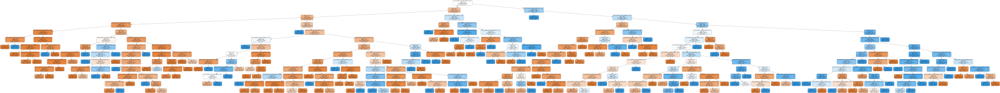

In [0]:
woe_all_nulls_data = demo_delta_woe.copy() 
woe_all_nulls_data.Performance_Tag.fillna(1, inplace=True)

woe_all_nulls_data.drop(columns=['Application_ID', 'Age', 'Gender',
       'Marital_Status_at_the_time_of_application', 'No_of_dependents',
       'Education', 'Profession', 'Type_of_residence'], axis=1, inplace=True)


perf_all_nulls_X = woe_all_nulls_data.drop(columns=['Performance_Tag'])
perf_all_nulls_y = woe_all_nulls_data.Performance_Tag

plot_decision_tree(X_train_Smote,perf_all_nulls_X,y_train_Smote,perf_all_nulls_y,X_test.columns,12,"gini",'balanced',30,30,"best",cut_off = 0.4, all_nulls = True)

# bank_risk_prediction_cutoff(logit,X_train_Smote,perf_all_nulls_X,y_train_Smote,perf_all_nulls_y,0.51,perf_all_nulls_X.columns, all_nulls = True)

* We can see that model did correctly identify around 831 as defaulters but a substantial chunk of Applicants fall in False Negative which is not good. But Decision tree performed better than Logistic Regression Model on the Null Data

### Random Forest

* Tunning - Min Sample Leaf

In [0]:
# Fine Tunning Min Sample Leaf node

n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(50, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train_Smote, y_train_Smote)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    6.8s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.118442,0.005524,0.012278,0.000441,50,{'min_samples_leaf': 50},0.925567,0.921744,0.927861,0.931668,0.939062,0.929180,0.005898,1,0.928043,0.923646,0.933461,0.936907,0.947040,0.933819,0.008016
1,0.108051,0.001229,0.011764,0.000343,100,{'min_samples_leaf': 100},0.878664,0.906959,0.893194,0.901581,0.904131,0.896905,0.010215,2,0.883301,0.905672,0.900000,0.901472,0.904085,0.898906,0.008048
2,0.106311,0.003903,0.011297,0.000179,150,{'min_samples_leaf': 150},0.841703,0.877900,0.866174,0.854666,0.855431,0.859175,0.012160,3,0.844232,0.870809,0.872849,0.859983,0.857944,0.861164,0.010276
3,0.103348,0.006489,0.010803,0.000337,200,{'min_samples_leaf': 200},0.833036,0.871782,0.847311,0.847017,0.845487,0.848927,0.012594,4,0.836902,0.871511,0.855194,0.851252,0.848894,0.852751,0.011191
4,0.102293,0.001487,0.011320,0.000729,250,{'min_samples_leaf': 250},0.855213,0.855468,0.829212,0.833758,0.864610,0.847652,0.013703,5,0.858126,0.847801,0.834098,0.839781,0.868969,0.849755,0.012552


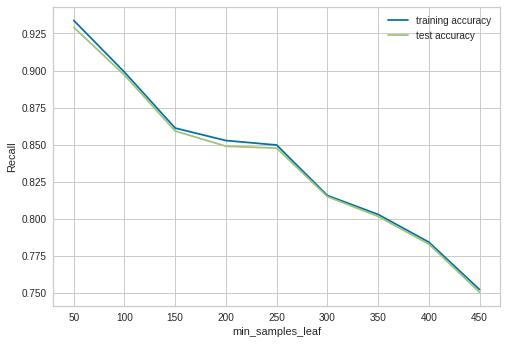

In [0]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

* Tunning - Min Sample Split

In [0]:
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                 return_train_score=True, verbose = 1)
rf.fit(X_train_Smote, y_train_Smote)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    4.6s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.117849,0.002712,0.009478,0.000224,200,{'min_samples_split': 200},0.953196,0.966970,0.948248,0.965222,0.960808,0.958888,0.007138,1,0.953390,0.967400,0.955932,0.966600,0.963892,0.961443,0.005715
1,0.112389,0.003601,0.009526,0.000226,250,{'min_samples_split': 250},0.947446,0.956138,0.942765,0.949839,0.945693,0.948376,0.004515,2,0.946569,0.956232,0.950381,0.951688,0.947944,0.950563,0.003354
2,0.111311,0.003581,0.009082,0.000212,300,{'min_samples_split': 300},0.930195,0.936079,0.933405,0.944355,0.935661,0.935939,0.004698,3,0.926107,0.932225,0.941487,0.941525,0.939151,0.936099,0.006044
3,0.109073,0.003440,0.009401,0.000970,350,{'min_samples_split': 350},0.928724,0.913212,0.915352,0.919609,0.923087,0.919997,0.005541,4,0.931958,0.913869,0.925304,0.918957,0.924239,0.922866,0.006111
4,0.112493,0.003610,0.008884,0.000381,400,{'min_samples_split': 400},0.914014,0.913346,0.893688,0.919074,0.901552,0.908335,0.009309,5,0.912966,0.915675,0.905243,0.916015,0.904313,0.910842,0.005072


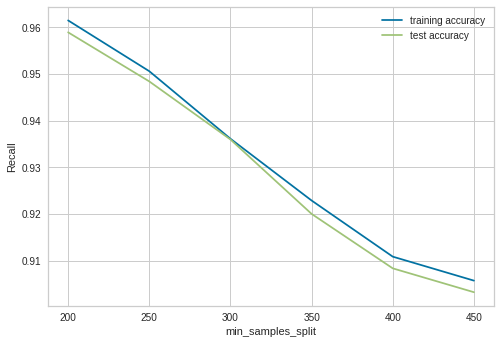

In [0]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

* Tunning Max Depth

In [0]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 4)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train_Smote, y_train_Smote)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    3.9s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.063718,0.002394,0.008755,0.000228,2,{'max_depth': 2},0.642875,0.783584,0.756564,0.647374,0.645334,0.695151,0.061790,5,0.649841,0.771638,0.763034,0.659104,0.644063,0.697536,0.057258
1,0.102695,0.007159,0.010388,0.000258,6,{'max_depth': 6},0.829212,0.837369,0.814428,0.864610,0.813361,0.831795,0.018739,4,0.833843,0.824028,0.830465,0.861768,0.814735,0.832968,0.015804
2,0.118721,0.004515,0.013271,0.001335,10,{'max_depth': 10},0.983431,0.974509,0.988274,0.986486,0.983427,0.983225,0.004737,3,0.986552,0.976227,0.992543,0.981582,0.984195,0.984220,0.005396
3,0.119033,0.002535,0.012926,0.000208,14,{'max_depth': 14},0.998980,0.997451,0.997706,0.998215,0.996940,0.997859,0.000695,1,0.999809,0.999809,0.999745,0.999618,0.999873,0.999771,0.000086
4,0.118722,0.002388,0.012697,0.000754,18,{'max_depth': 18},0.997706,0.997706,0.997706,0.998215,0.995920,0.997451,0.000790,2,0.999745,1.000000,0.999681,0.999618,0.999745,0.999758,0.000130


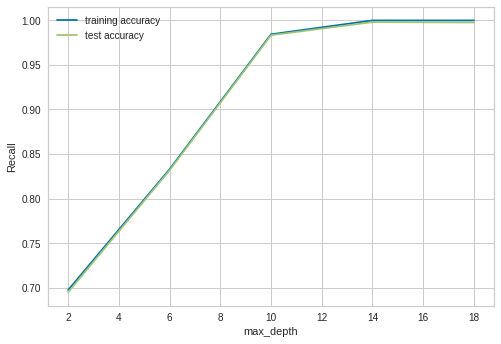

In [0]:
# plotting accuracies with param_max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

* Tunning n_Estimators

In [0]:
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight='balanced',max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                    return_train_score=True, verbose = 1)
rf.fit(X_train_Smote, y_train_Smote)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:  2.7min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.899205,0.008287,0.066371,0.002919,100,{'n_estimators': 100},0.844252,0.875605,0.851644,0.836308,0.858746,0.853312,0.013420,1,0.850605,0.870682,0.863480,0.837614,0.855841,0.855644,0.011296
1,4.392546,0.045840,0.314768,0.004922,500,{'n_estimators': 500},0.842977,0.854193,0.837369,0.854921,0.850076,0.847907,0.006764,4,0.849841,0.842129,0.846463,0.856606,0.852846,0.849577,0.005007
2,7.885641,0.036421,0.563055,0.009623,900,{'n_estimators': 900},0.839918,0.852664,0.837624,0.856706,0.858236,0.849029,0.008602,3,0.844869,0.841300,0.845698,0.858326,0.857498,0.849538,0.007000
3,11.525246,0.436090,0.808151,0.006722,1300,{'n_estimators': 1300},0.839664,0.851389,0.840938,0.859255,0.857726,0.849793,0.008198,2,0.845252,0.841619,0.850797,0.861003,0.858072,0.851348,0.007356


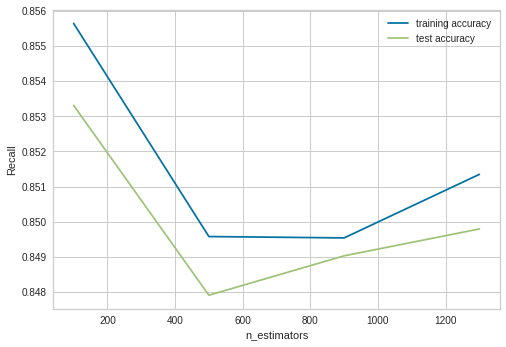

In [0]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Recall")
plt.legend()
plt.show()

* Tunning Max Features

In [0]:
n_folds = 5

# parameters to build the model on
parameters = {'max_features': ['auto', 'sqrt']}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced', max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train_Smote, y_train_Smote)

Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.5s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.100482,0.004747,0.010777,0.000359,auto,{'max_features': 'auto'},0.817232,0.855213,0.818506,0.819990,0.843447,0.830877,0.015544,2,0.819567,0.846335,0.828872,0.832579,0.852463,0.835963,0.011920
1,0.097237,0.005468,0.010404,0.000196,sqrt,{'max_features': 'sqrt'},0.866429,0.841193,0.826918,0.856196,0.839878,0.846122,0.013755,1,0.869981,0.832441,0.845507,0.854694,0.845899,0.849704,0.012379


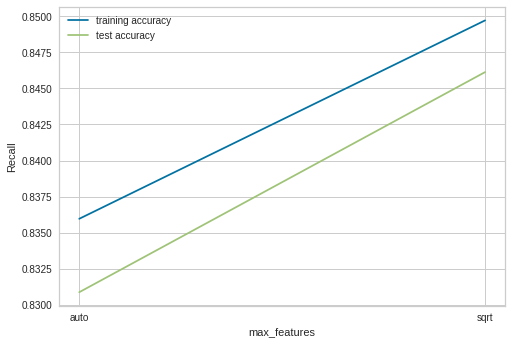

In [0]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Recall")
plt.legend()
plt.show()

In [0]:
# Number of trees in random forest
n_estimators = [1000, 1300, 1400]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(6, 10, num = 1)]

# Minimum number of samples required to split a node
min_samples_split = [200, 300, 400]
# Minimum number of samples required at each leaf node
min_samples_leaf = [50, 150, 200]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'class_weight': ['balanced']
               }

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=1, random_state=42)
# Fit the random search model
rf_random.fit(X_train_Smote, y_train_Smote)

print(rf_random.best_params_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed: 102.7min finished


{'n_estimators': 1000, 'min_samples_split': 200, 'min_samples_leaf': 50, 'max_features': 'auto', 'max_depth': 6, 'class_weight': 'balanced', 'bootstrap': False}


RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=6, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=50,
                       min_samples_split=200, min_weight_fraction_leaf=0.0,
                       n_estimators=1000, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

 Classification report : 
               precision    recall  f1-score   support

         0.0       0.96      0.72      0.82     13384
         1.0       0.06      0.39      0.10       590

    accuracy                           0.71     13974
   macro avg       0.51      0.56      0.46     13974
weighted avg       0.93      0.71      0.79     13974

Accuracy   Score :  0.7063832832403034


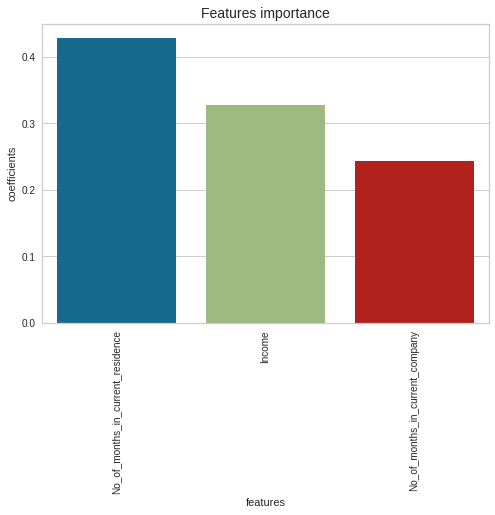

------------------------------------------------------------------------------------------------------------------------------------------------------
Area under curve :  0.5558942121632711 



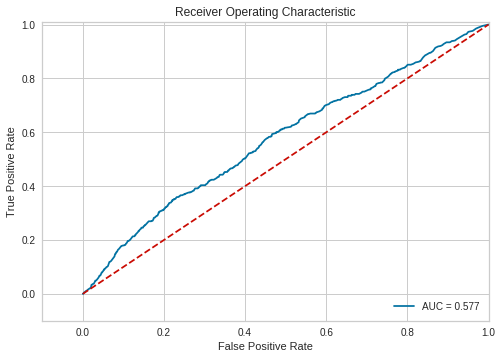

------------------------------------------------------------------------------------------------------------------------------------------------------


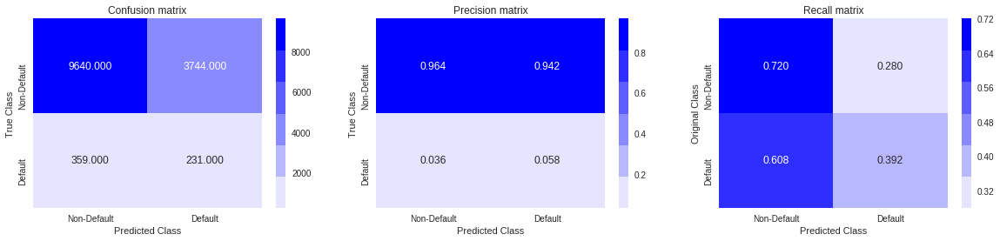

--------------------------------------------------------------- CUTOFF - DataFrame ------------------------------------------------------------------------
     prob  accuracy  sensi_recall     speci    precis       ppv       npv
0.0   0.0  0.524608      1.000000  0.000000  0.524608  0.524608       NaN
0.1   0.1  0.579548      1.000000  0.115569  0.555106  0.555106  1.000000
0.2   0.2  0.648264      0.999388  0.260789  0.598705  0.598705  0.997418
0.3   0.3  0.764190      0.995411  0.509031  0.691104  0.691104  0.990150
0.4   0.4  0.829482      0.946311  0.700557  0.777154  0.777154  0.922023
0.5   0.5  0.854170      0.834803  0.875542  0.880979  0.880979  0.827669
0.6   0.6  0.815894      0.699587  0.944241  0.932640  0.932640  0.740143
0.7   0.7  0.730461      0.507266  0.976763  0.960143  0.960143  0.642392
0.8   0.8  0.638929      0.311732  1.000000  1.000000  1.000000  0.568336
0.9   0.9  0.504066      0.054658  1.000000  1.000000  1.000000  0.489426
------------------------------

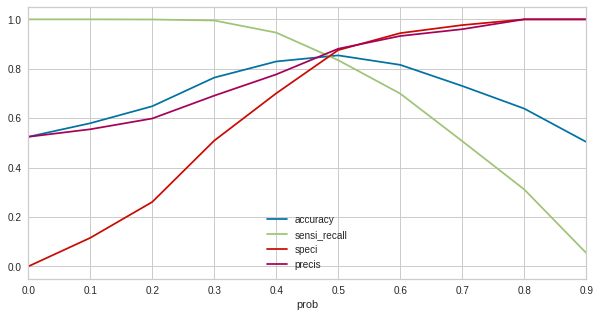

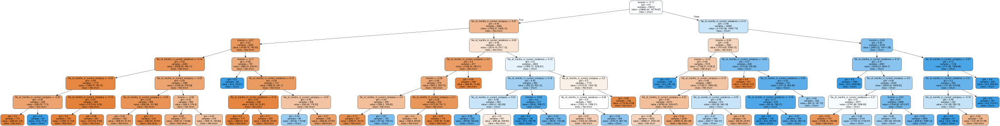

In [0]:
features_num = X_test.columns.tolist()

plot_tree_randomforest(X_train_Smote,X_test,y_train_Smote,y_test,features_num,1000,50,6,"gini",'balanced',50,200,"best",True)

* Predictions based on Cutoff

Sensitivity (trainset): 0.84	Specificity (trainset): 0.86
Sensitivity (testset): 0.4	Specificity (testset): 0.71
------------------------------------------------------------------------------------------------------------------------
RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=6, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=50,
                       min_samples_split=200, min_weight_fraction_leaf=0.0,
                       n_estimators=1000, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.96      0.71      0.82     13384
         1.0       0.06      0.40      0.10       590

    accuracy                           0.70     13974
   macro avg

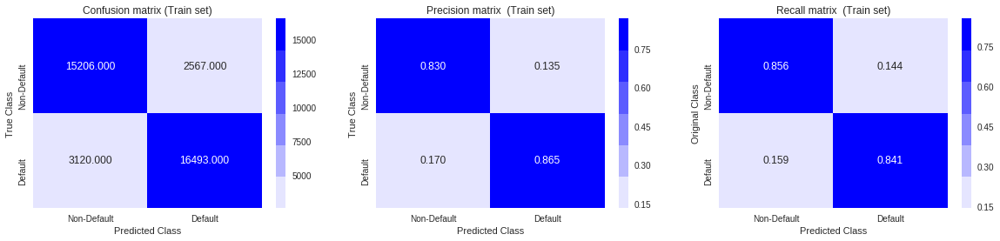

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[9485 3899]
 [ 352  238]]


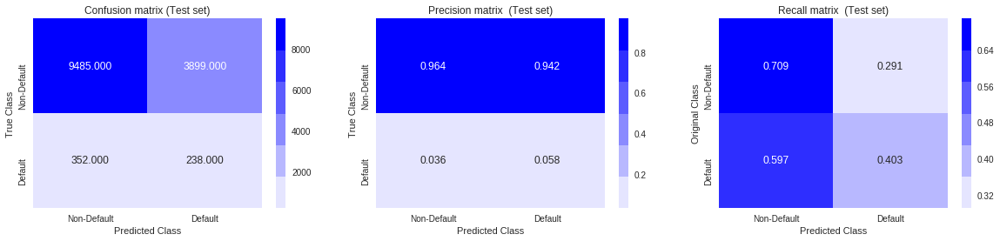

------------------------------------------------------------------------------------------------------------------------
Area under curve (testset):  0.5560359194383377 



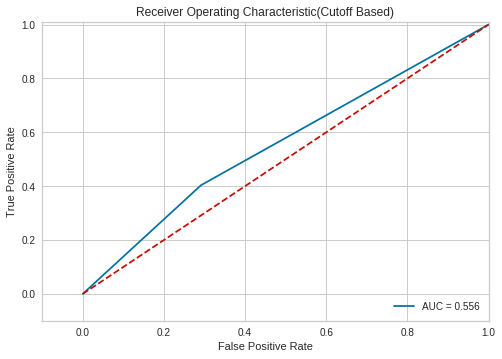

------------------------------------------------------------------------------------------------------------------------------------------------------


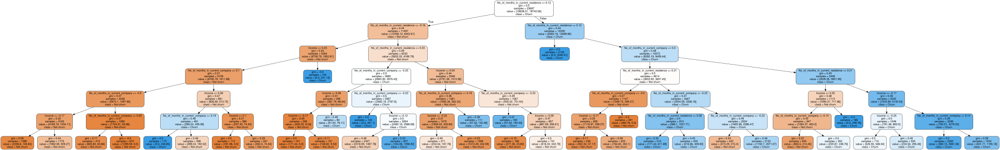

In [0]:
plot_tree_randomforest(X_train_Smote,X_test,y_train_Smote,y_test,features_num,1000,50,6,"gini",'balanced',50,200,"best",cut_off = 0.49)


* Predictions on Null Rows in Target Column(Performance Tag)

In [0]:
demo_delta_woe.columns

Index(['Application_ID', 'Age', 'Gender',
       'Marital_Status_at_the_time_of_application', 'No_of_dependents',
       'Income', 'Education', 'Profession', 'Type_of_residence',
       'No_of_months_in_current_residence', 'No_of_months_in_current_company',
       'Performance_Tag'],
      dtype='object')

Sensitivity (trainset): 0.86	Specificity (trainset): 0.86
Sensitivity (testset): 0.62	Specificity (testset): 0.0
------------------------------------------------------------------------------------------------------------------------
RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=6, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=50,
                       min_samples_split=200, min_weight_fraction_leaf=0.0,
                       n_estimators=1000, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         0
         1.0       1.00      0.62      0.77      1425

    accuracy                           0.62      1425
   macro avg

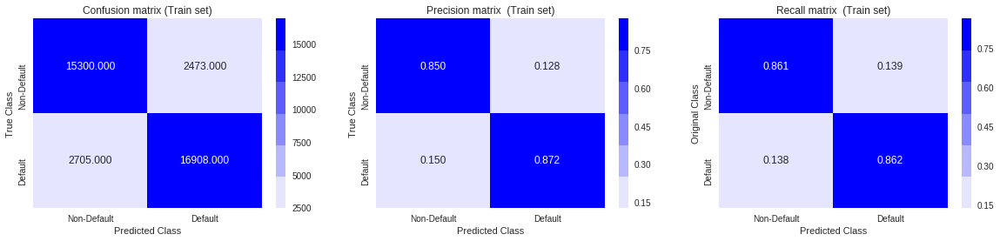

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[  0   0]
 [535 890]]


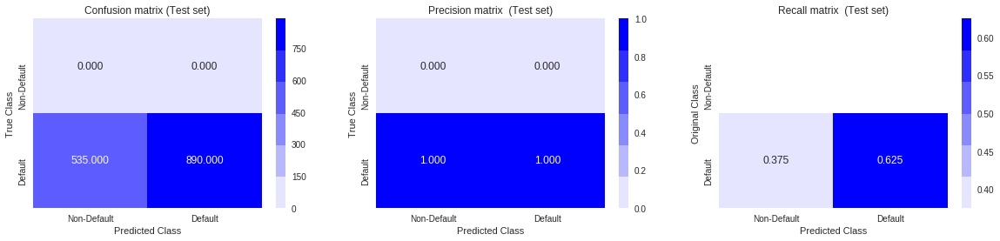

------------------------------------------------------------------------------------------------------------------------


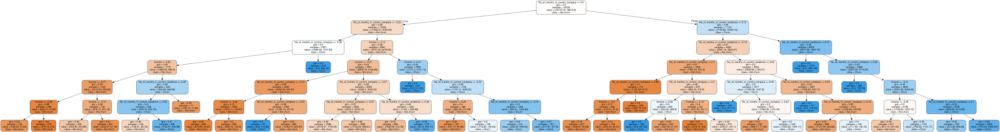

In [0]:
woe_all_nulls_data = demo_delta_woe.copy() 
woe_all_nulls_data.Performance_Tag.fillna(1, inplace=True)

woe_all_nulls_data.drop(columns=['Application_ID', 'Age', 'Gender',
       'Marital_Status_at_the_time_of_application', 'No_of_dependents',
       'Education', 'Profession', 'Type_of_residence'], axis=1, inplace=True)


perf_all_nulls_X = woe_all_nulls_data.drop(columns=['Performance_Tag'])
perf_all_nulls_y = woe_all_nulls_data.Performance_Tag

plot_tree_randomforest(X_train_Smote,perf_all_nulls_X,y_train_Smote,perf_all_nulls_y,features_num,1000,50,6,"gini",'balanced',50,200,"best",cut_off = 0.49, all_nulls = True)


* We can see that model did correctly identify around 891 as defaulters but a substantial chunk of Applicants fall in False Negative which is not good. But Random Forest performed better than Logistic Regression and Decision Tree Models on the Null Data

# Combining Demographic and Credit-Bureau datasets and Sanity check

#### Sanity Check on Demographic and Credit Bureau Data

In [0]:
demo_woe_df.isnull().sum()

Age                                          0
Gender                                       0
Marital_Status_at_the_time_of_application    0
No_of_dependents                             0
Income                                       0
Education                                    0
Profession                                   0
Type_of_residence                            0
No_of_months_in_current_residence            0
No_of_months_in_current_company              0
Performance_Tag                              0
Application_ID                               0
dtype: int64

In [0]:
credit_final.isnull().sum()

Application_ID                                                   0
No_of_times_90_DPD_or_worse_in_last_6_months                     0
No_of_times_60_DPD_or_worse_in_last_6_months                     0
No_of_times_30_DPD_or_worse_in_last_6_months                     0
No_of_times_90_DPD_or_worse_in_last_12_months                    0
No_of_times_60_DPD_or_worse_in_last_12_months                    0
No_of_times_30_DPD_or_worse_in_last_12_months                    0
Avgas_CC_Utilization_in_last_12_months                           0
No_of_trades_opened_in_last_6_months                             0
No_of_trades_opened_in_last_12_months                            0
No_of_PL_trades_opened_in_last_6_months                          0
No_of_PL_trades_opened_in_last_12_months                         0
No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans     0
No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans    0
Presence_of_open_home_loan                                    

In [0]:
### Printing Application ID which are not common in both the Dataframes
credit_final[~credit_final['Application_ID'].isin(demo_woe_df['Application_ID'])]

,Application_ID,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,No_of_times_30_DPD_or_worse_in_last_12_months,Avgas_CC_Utilization_in_last_12_months,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans,No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans,Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,Performance_Tag


* There are no mismatch with respect to the Application ID. Both the Datasets have Unique and Common Application IDs

In [0]:
iv, woe = iv_woe(data = credit_partial, target = 'Performance_Tag', bins=10, show_woe = True)

Application_ID
Information value of Application_ID is 0.001487
         Variable                       Cutoff  ...       WoE            IV
0  Application_ID     (100449.999, 99490857.8]  ... -0.010006  9.967684e-06
1  Application_ID    (99490857.8, 199470441.0]  ... -0.068746  4.580316e-04
2  Application_ID   (199470441.0, 298569304.0]  ...  0.035645  1.291359e-04
3  Application_ID   (298569304.0, 399380461.8]  ...  0.000663  4.400566e-08
4  Application_ID   (399380461.8, 498001549.0]  ...  0.059235  3.605619e-04
5  Application_ID   (498001549.0, 599104434.0]  ... -0.049898  2.433483e-04
6  Application_ID   (599104434.0, 699936232.0]  ...  0.011230  1.267637e-05
7  Application_ID   (699936232.0, 798890216.0]  ...  0.035645  1.291359e-04
8  Application_ID   (798890216.0, 899541680.4]  ... -0.035316  1.227312e-04
9  Application_ID  (899541680.4, 1000084142.0]  ...  0.014729  2.184329e-05

[10 rows x 9 columns]
No_of_times_90_DPD_or_worse_in_last_6_months
Information value of No_of_times_

In [0]:
iv

,Variable,IV
0,Application_ID,0.001487
0,No_of_times_90_DPD_or_worse_in_last_6_months,0.162992
0,No_of_times_60_DPD_or_worse_in_last_6_months,0.211549
0,No_of_times_30_DPD_or_worse_in_last_6_months,0.244473
0,No_of_times_90_DPD_or_worse_in_last_12_months,0.216024
0,No_of_times_60_DPD_or_worse_in_last_12_months,0.188546
0,No_of_times_30_DPD_or_worse_in_last_12_months,0.218904
0,Avgas_CC_Utilization_in_last_12_months,0.299389
0,No_of_trades_opened_in_last_6_months,0.187402
0,No_of_trades_opened_in_last_12_months,0.293711


In [0]:
woe

,Variable,Cutoff,N,Events,% of Events,Non-Events,% of Non-Events,WoE,IV
0,Application_ID,"(100449.999, 99490857.8]",6987,292.0,0.099050,6695.0,0.100046,-0.010006,9.967684e-06
1,Application_ID,"(99490857.8, 199470441.0]",6987,276.0,0.093623,6711.0,0.100285,-0.068746,4.580316e-04
2,Application_ID,"(199470441.0, 298569304.0]",6986,305.0,0.103460,6681.0,0.099837,0.035645,1.291359e-04
3,Application_ID,"(298569304.0, 399380461.8]",6987,295.0,0.100068,6692.0,0.100001,0.000663,4.400566e-08
4,Application_ID,"(399380461.8, 498001549.0]",6987,312.0,0.105834,6675.0,0.099747,0.059235,3.605619e-04
5,Application_ID,"(498001549.0, 599104434.0]",6986,281.0,0.095319,6705.0,0.100196,-0.049898,2.433483e-04
6,Application_ID,"(599104434.0, 699936232.0]",6987,298.0,0.101085,6689.0,0.099957,0.011230,1.267637e-05
7,Application_ID,"(699936232.0, 798890216.0]",6986,305.0,0.103460,6681.0,0.099837,0.035645,1.291359e-04
8,Application_ID,"(798890216.0, 899541680.4]",6987,285.0,0.096676,6702.0,0.100151,-0.035316,1.227312e-04
9,Application_ID,"(899541680.4, 1000084142.0]",6987,299.0,0.101425,6688.0,0.099942,0.014729,2.184329e-05


* Based on the above Information Values for each variables, we can conclude that compared to Demographic dataset, Credit bureau dataset carried a lot of discriminatory power to seperate out good from bad applicants.

In [0]:
woe.Variable.value_counts().index.tolist()

['Avgas_CC_Utilization_in_last_12_months',
 'Application_ID',
 'Outstanding_Balance',
 'No_of_times_30_DPD_or_worse_in_last_12_months',
 'Total_No_of_Trades',
 'No_of_trades_opened_in_last_12_months',
 'No_of_times_30_DPD_or_worse_in_last_6_months',
 'No_of_times_60_DPD_or_worse_in_last_12_months',
 'No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans',
 'No_of_PL_trades_opened_in_last_12_months',
 'No_of_PL_trades_opened_in_last_6_months',
 'No_of_trades_opened_in_last_6_months',
 'No_of_times_90_DPD_or_worse_in_last_12_months',
 'No_of_times_60_DPD_or_worse_in_last_6_months',
 'No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans',
 'No_of_times_90_DPD_or_worse_in_last_6_months',
 'Presence_of_open_auto_loan',
 'Presence_of_open_home_loan']

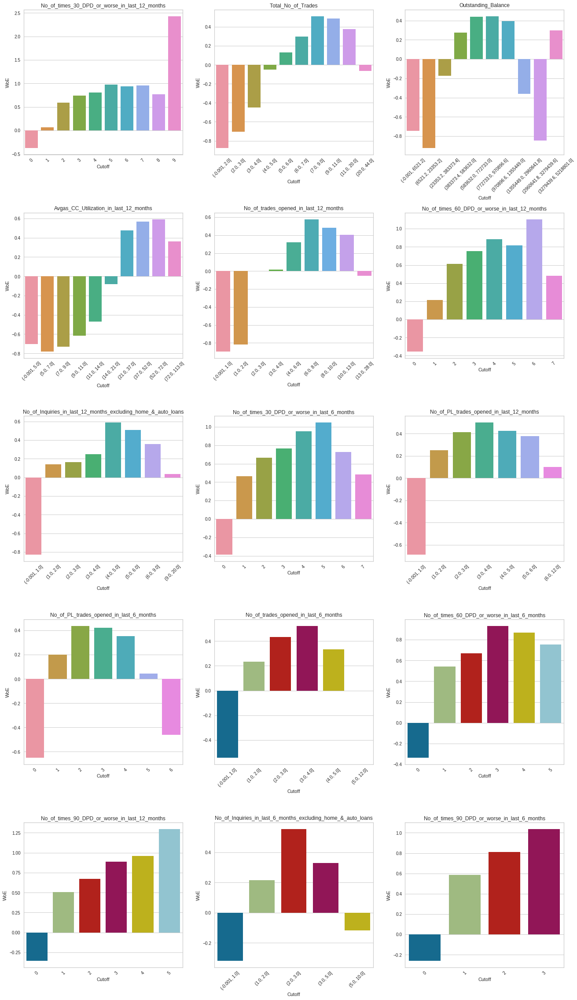

In [0]:
# WOE Monotonic Pattern of all the relevant Variables
woe_lst = ['No_of_times_30_DPD_or_worse_in_last_12_months',
 'Total_No_of_Trades',
 'Outstanding_Balance',
 'Avgas_CC_Utilization_in_last_12_months',
 'No_of_trades_opened_in_last_12_months',
 'No_of_times_60_DPD_or_worse_in_last_12_months',
 'No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans',
 'No_of_times_30_DPD_or_worse_in_last_6_months',
 'No_of_PL_trades_opened_in_last_12_months',
 'No_of_PL_trades_opened_in_last_6_months',
 'No_of_trades_opened_in_last_6_months',
 'No_of_times_60_DPD_or_worse_in_last_6_months',
 'No_of_times_90_DPD_or_worse_in_last_12_months',
 'No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans',
 'No_of_times_90_DPD_or_worse_in_last_6_months']

fig = plt.figure(figsize=(22,40))
fig.subplots_adjust(hspace=0.4, wspace=0.2)
for i,v in enumerate(woe_lst): 
  plt.subplot(5, 3, i+1)
  sns.barplot(x=woe[woe.Variable == v]['Cutoff'], y=woe[woe.Variable == v]['WoE'])
  plt.xticks(rotation=45)
  plt.title(v)


#### Replacing the datset with their corresponding WOE values

In [0]:
#-------------------------

In [0]:
credit_full.isnull().sum()

Application_ID                                                      0
No_of_times_90_DPD_or_worse_in_last_6_months                        0
No_of_times_60_DPD_or_worse_in_last_6_months                        0
No_of_times_30_DPD_or_worse_in_last_6_months                        0
No_of_times_90_DPD_or_worse_in_last_12_months                       0
No_of_times_60_DPD_or_worse_in_last_12_months                       0
No_of_times_30_DPD_or_worse_in_last_12_months                       0
Avgas_CC_Utilization_in_last_12_months                              0
No_of_trades_opened_in_last_6_months                                0
No_of_trades_opened_in_last_12_months                               0
No_of_PL_trades_opened_in_last_6_months                             0
No_of_PL_trades_opened_in_last_12_months                            0
No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans        0
No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans       0
Presence_of_open_hom

In [0]:
woe = woe[woe.Variable != 'Application_ID']

In [0]:
def replace_woe(original_df, woe_df):
  for i,v in enumerate(woe.Variable.value_counts().index):
    var = woe_df[woe_df.Variable == v].set_index('Cutoff').to_dict()['WoE']
    original_df[v] = original_df[v].map(var)
  return original_df


In [0]:
credit_full_woe = credit_full.copy()


In [0]:
credit_full_woe = replace_woe(credit_full_woe, woe)

In [0]:
# Based on slightly different logic. Keeping the snippet for future reference.

# def replace_woe(fbinned_df, woe_df):
#   for var in woe_df.Variable.unique().tolist():
#     df_variable = woe_df.loc[woe_df.Variable.isin([var])]
#     rename_dict = df_variable.set_index('Cutoff').to_dict()['WoE']
#     fbinned_df[var] = fbinned_df[var].replace(rename_dict)
#   return fbinned_df

In [0]:
# demo_woe_df.reset_index(drop=True, inplace=True)

In [0]:
credit_full_woe.isnull().sum()

Application_ID                                                      0
No_of_times_90_DPD_or_worse_in_last_6_months                        0
No_of_times_60_DPD_or_worse_in_last_6_months                        0
No_of_times_30_DPD_or_worse_in_last_6_months                        0
No_of_times_90_DPD_or_worse_in_last_12_months                       0
No_of_times_60_DPD_or_worse_in_last_12_months                       0
No_of_times_30_DPD_or_worse_in_last_12_months                       0
Avgas_CC_Utilization_in_last_12_months                              0
No_of_trades_opened_in_last_6_months                                0
No_of_trades_opened_in_last_12_months                               0
No_of_PL_trades_opened_in_last_6_months                             0
No_of_PL_trades_opened_in_last_12_months                            0
No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans        0
No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans       0
Presence_of_open_hom

In [0]:
# These rows has no missing values.
credit_partial_woe = credit_full_woe[credit_full_woe.Performance_Tag.notnull()]

# Performace Tag missing for these rows.
credit_delta_woe = credit_full_woe[credit_full_woe.Performance_Tag.isnull()]

In [0]:
credit_full.to_csv(path_or_buf='/content/drive/My Drive/credit_full.csv',index=False)
credit_partial.to_csv(path_or_buf='/content/drive/My Drive/credit_partial.csv',index=False)

credit_full_woe.to_csv(path_or_buf='/content/drive/My Drive/credit_full_woe.csv',index=False)
credit_partial_woe.to_csv(path_or_buf='/content/drive/My Drive/credit_partial_woe.csv',index=False)
credit_delta_woe.to_csv(path_or_buf='/content/drive/My Drive/credit_delta_woe.csv',index=False)

In [0]:
credit_partial_woe = pd.read_csv('/content/drive/My Drive/demo_partial_woe.csv')
credit_delta_woe = pd.read_csv('/content/drive/My Drive/demo_delta_woe.csv')

In [0]:
credit_partial_woe.head(5)

NameError: ignored

In [0]:
credit_delta_woe.head(5)

,Application_ID,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,No_of_times_30_DPD_or_worse_in_last_12_months,Avgas_CC_Utilization_in_last_12_months,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans,No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans,Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,Performance_Tag
0,906908303,-0.261032,-0.336701,0.666479,0.508469,0.614256,0.738098,0.474692,0.523923,0.403087,0.423261,0.100597,0.215660,0.247751,0.071871,0.395372,0.375602,0.011997,NaN
1,10990583,0.587564,0.542216,0.465571,0.885199,0.614256,0.593976,-0.079207,0.434656,0.575286,0.423261,0.499721,0.554584,0.588045,0.071871,0.444145,0.296139,0.011997,NaN
2,589678446,1.037494,0.867024,1.045826,0.885199,0.814231,0.936896,0.362502,0.234160,0.575286,0.438081,0.499721,-0.319542,0.166250,0.071871,0.436830,0.512261,0.011997,NaN
3,809411322,0.587564,0.933424,0.951435,0.885199,0.884177,0.972425,0.362502,0.234160,0.575286,0.200454,0.499721,0.328515,0.588045,0.071871,0.444145,0.512261,0.011997,NaN
4,150246616,0.809821,0.668121,0.951435,0.885199,0.614256,0.936896,0.568478,0.434656,0.575286,0.438081,0.413912,0.554584,0.509670,0.071871,0.444145,0.296139,-0.138547,NaN


In [0]:
master_df = pd.merge(demo_partial_woe, credit_partial_woe, on='Application_ID', how='inner')

In [0]:
master_delta_df = pd.merge(demo_delta_woe, credit_delta_woe, on='Application_ID', how='inner')

In [0]:
master_df

,Application_ID,Age,Gender,Marital_Status_at_the_time_of_application,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag_x,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,No_of_times_30_DPD_or_worse_in_last_12_months,Avgas_CC_Utilization_in_last_12_months,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans,No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans,Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,Performance_Tag_y
0,954457215,0.032530,0.031820,-0.004030,-0.085507,-0.273218,0.017020,-0.028710,-0.004353,-0.069491,-0.229240,0.0,-0.261032,-0.336701,-0.387125,-0.356987,-0.352253,-0.376727,-0.703240,-0.543589,-0.816823,-0.649533,-0.686829,-0.319542,-0.828596,-0.237012,-0.843135,-0.448207,0.011997,0.0
1,432830445,-0.016588,-0.010033,-0.004030,-0.025646,-0.385850,-0.018175,-0.013652,-0.004353,-0.069491,-0.145849,0.0,-0.261032,-0.336701,-0.387125,-0.356987,-0.352253,-0.376727,-0.703240,-0.543589,-0.816823,-0.649533,-0.686829,-0.319542,-0.828596,0.071871,-0.745927,-0.049155,0.011997,0.0
2,941387308,0.031314,-0.010033,0.022972,-0.085507,-0.169700,0.017020,-0.013652,-0.004353,-0.069491,-0.255198,0.0,-0.261032,-0.336701,-0.387125,-0.356987,-0.352253,-0.376727,-0.778815,-0.543589,-0.894245,-0.649533,-0.686829,-0.319542,-0.828596,-0.237012,-0.843135,-0.878040,0.011997,0.0
3,392161677,-0.044999,-0.010033,-0.004030,0.039731,-0.385850,0.017020,0.092553,-0.004353,0.121151,-0.255198,0.0,-0.261032,-0.336701,-0.387125,-0.356987,-0.352253,-0.376727,-0.616822,-0.543589,-0.894245,-0.649533,-0.686829,-0.319542,-0.828596,-0.237012,0.296845,-0.448207,-0.138547,0.0
4,182011211,0.031314,0.031820,-0.004030,0.006023,-0.169700,-0.018175,-0.028710,-0.004353,-0.069491,-0.145849,0.0,-0.261032,-0.336701,-0.387125,-0.356987,-0.352253,-0.376727,-0.468356,-0.543589,-0.894245,-0.649533,-0.686829,-0.319542,-0.828596,-0.237012,-0.843135,-0.448207,0.011997,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69862,254036864,-0.044999,-0.010033,-0.004030,0.053667,0.078752,-0.018175,-0.028710,-0.004353,-0.253229,0.101657,0.0,0.587564,0.668121,0.951435,0.508469,0.752385,0.936896,-0.703240,0.434656,0.483818,0.423261,0.425795,0.328515,0.509670,0.071871,0.395372,0.512261,0.011997,0.0
69863,375231276,-0.016588,-0.010033,0.022972,0.039731,0.352682,0.017020,-0.028710,0.003794,0.472881,0.182979,1.0,-0.261032,0.542216,0.666479,-0.356987,0.213800,0.593976,-0.703240,0.523923,0.403087,0.423261,0.377938,0.215660,0.247751,-0.237012,0.296845,0.512261,0.011997,1.0
69864,32481239,0.031314,-0.010033,-0.004030,-0.025646,0.352682,0.017020,-0.013652,-0.004353,0.304993,0.000570,0.0,-0.261032,0.542216,0.666479,0.508469,0.752385,0.593976,-0.703240,-0.543589,0.575286,0.200454,0.425795,0.215660,0.247751,-0.237012,0.296845,0.296139,0.011997,0.0
69865,704812159,-0.149602,-0.010033,-0.004030,0.053667,0.352682,0.017020,0.092553,-0.004353,0.121151,-0.229240,0.0,0.809821,0.668121,0.951435,0.885199,0.884177,0.972425,0.589983,0.434656,0.483818,0.423261,0.425795,0.328515,0.509670,-0.237012,0.296845,0.512261,0.011997,0.0


In [0]:
master_df.isnull().sum()

Income                                                           0
No_of_months_in_current_residence                                0
No_of_months_in_current_company                                  0
No_of_times_90_DPD_or_worse_in_last_6_months                     0
No_of_times_60_DPD_or_worse_in_last_6_months                     0
No_of_times_30_DPD_or_worse_in_last_6_months                     0
No_of_times_90_DPD_or_worse_in_last_12_months                    0
No_of_times_60_DPD_or_worse_in_last_12_months                    0
No_of_times_30_DPD_or_worse_in_last_12_months                    0
Avgas_CC_Utilization_in_last_12_months                           0
No_of_trades_opened_in_last_6_months                             0
No_of_trades_opened_in_last_12_months                            0
No_of_PL_trades_opened_in_last_6_months                          0
No_of_PL_trades_opened_in_last_12_months                         0
No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans  

In [0]:
master_delta_df

,Application_ID,Age,Gender,Marital_Status_at_the_time_of_application,No_of_dependents,Income,Education,Profession,Type_of_residence,No_of_months_in_current_residence,No_of_months_in_current_company,Performance_Tag_x,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,No_of_times_30_DPD_or_worse_in_last_12_months,Avgas_CC_Utilization_in_last_12_months,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans,No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans,Presence_of_open_home_loan,Outstanding_Balance,Total_No_of_Trades,Presence_of_open_auto_loan,Performance_Tag_y
0,906908303,0.031314,-0.010033,0.022972,0.039731,0.352682,0.017020,-0.028710,-0.004353,0.472881,0.196433,NaN,-0.261032,-0.336701,0.666479,0.508469,0.614256,0.738098,0.474692,0.523923,0.403087,0.423261,0.100597,0.215660,0.247751,0.071871,0.395372,0.375602,0.011997,NaN
1,10990583,0.032530,0.031820,-0.004030,-0.025646,0.078752,0.007594,0.092553,-0.004353,-0.069491,0.000570,NaN,0.587564,0.542216,0.465571,0.885199,0.614256,0.593976,-0.079207,0.434656,0.575286,0.423261,0.499721,0.554584,0.588045,0.071871,0.444145,0.296139,0.011997,NaN
2,589678446,0.032530,-0.010033,-0.004030,0.053667,0.139283,-0.018175,0.092553,-0.004353,-0.253229,-0.068801,NaN,1.037494,0.867024,1.045826,0.885199,0.814231,0.936896,0.362502,0.234160,0.575286,0.438081,0.499721,-0.319542,0.166250,0.071871,0.436830,0.512261,0.011997,NaN
3,809411322,0.050111,-0.010033,-0.004030,0.053667,0.115591,0.007594,-0.028710,-0.004353,-0.253229,-0.145849,NaN,0.587564,0.933424,0.951435,0.885199,0.884177,0.972425,0.362502,0.234160,0.575286,0.200454,0.499721,0.328515,0.588045,0.071871,0.444145,0.512261,0.011997,NaN
4,150246616,0.050111,0.031820,-0.004030,-0.025646,0.078752,-0.024417,-0.028710,-0.004353,-0.253229,-0.255198,NaN,0.809821,0.668121,0.951435,0.885199,0.614256,0.936896,0.568478,0.434656,0.575286,0.438081,0.413912,0.554584,0.509670,0.071871,0.444145,0.296139,-0.138547,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1420,717735702,0.062329,0.031820,0.022972,0.006023,-0.169700,0.017020,0.092553,-0.004353,0.122377,0.101657,NaN,0.809821,0.933424,0.766520,0.885199,0.884177,0.807705,-0.703240,0.331944,0.403087,0.423261,0.425795,0.554584,0.247751,0.071871,0.444145,0.488895,0.011997,NaN
1421,979080449,0.050111,-0.010033,-0.004030,0.006023,0.115591,-0.018175,-0.028710,-0.004353,-0.253229,0.182979,NaN,0.809821,0.668121,0.951435,0.957392,0.884177,0.972425,-0.703240,0.234160,0.016993,0.200454,0.250986,0.328515,0.356171,0.071871,0.272194,-0.702379,0.011997,NaN
1422,815278690,0.031314,-0.010033,-0.004030,0.039731,0.139283,0.007594,0.092553,-0.004353,0.472881,0.101657,NaN,0.587564,0.668121,0.666479,0.508469,0.752385,0.593976,-0.703240,0.523923,0.483818,0.423261,0.425795,0.215660,0.247751,0.071871,0.444145,0.512261,0.011997,NaN
1423,736895532,0.062329,-0.010033,-0.004030,-0.025646,-0.146865,0.017020,0.092553,-0.004353,-0.253229,0.182979,NaN,0.587564,0.933424,0.951435,0.671598,0.752385,0.972425,-0.703240,0.523923,0.575286,0.438081,0.413912,0.215660,0.247751,0.071871,0.436830,0.296139,0.011997,NaN


In [0]:
master_delta_df.isnull().sum()

Age                                                                 0
Gender                                                              0
Marital_Status_at_the_time_of_application                           0
No_of_dependents                                                    0
Income                                                              0
Education                                                           0
Profession                                                          0
Type_of_residence                                                   0
No_of_months_in_current_residence                                   0
No_of_months_in_current_company                                     0
No_of_times_90_DPD_or_worse_in_last_6_months                        0
No_of_times_60_DPD_or_worse_in_last_6_months                        0
No_of_times_30_DPD_or_worse_in_last_6_months                        0
No_of_times_90_DPD_or_worse_in_last_12_months                       0
No_of_times_60_DPD_o

In [0]:
master_df.drop(columns='Performance_Tag_x', inplace=True)
master_df.rename(columns={'Performance_Tag_y' : 'Performance_Tag'}, inplace=True)

# Dropping Performance Tag Column of the master_delta_df for which the Performance_Tag is anyways NULL.
master_delta_df.drop(columns='Performance_Tag_x', inplace=True)
master_delta_df.rename(columns={'Performance_Tag_y' : 'Performance_Tag'}, inplace=True)

KeyError: ignored

In [0]:
master_df.drop(columns='Application_ID', inplace=True)

master_delta_df.drop(columns='Application_ID', inplace=True)

KeyError: ignored

In [0]:
master_df.to_csv(path_or_buf='/content/drive/My Drive/master_df.csv',index=False)
master_delta_df.to_csv(path_or_buf='/content/drive/My Drive/master_delta_df.csv',index=False)

In [0]:
# Removing Unwanted Columns from Demographic and Credit Bureau Datasey that has very low IV values
cols_remv = ['Age', 'Gender', 'Marital_Status_at_the_time_of_application',
            'No_of_dependents', 'Education', 'Profession', 'Type_of_residence', 
            'Presence_of_open_home_loan', 'Presence_of_open_auto_loan']
master_df.drop(columns=cols_remv, inplace=True, axis=1)
master_delta_df.drop(columns=cols_remv, inplace=True,axis=1)

In [0]:
master_df.columns

Index(['Income', 'No_of_months_in_current_residence',
       'No_of_months_in_current_company',
       'No_of_times_90_DPD_or_worse_in_last_6_months',
       'No_of_times_60_DPD_or_worse_in_last_6_months',
       'No_of_times_30_DPD_or_worse_in_last_6_months',
       'No_of_times_90_DPD_or_worse_in_last_12_months',
       'No_of_times_60_DPD_or_worse_in_last_12_months',
       'No_of_times_30_DPD_or_worse_in_last_12_months',
       'Avgas_CC_Utilization_in_last_12_months',
       'No_of_trades_opened_in_last_6_months',
       'No_of_trades_opened_in_last_12_months',
       'No_of_PL_trades_opened_in_last_6_months',
       'No_of_PL_trades_opened_in_last_12_months',
       'No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans',
       'No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans',
       'Outstanding_Balance', 'Total_No_of_Trades', 'Performance_Tag'],
      dtype='object')

In [0]:
# train test split
X = master_df.drop(columns='Performance_Tag')
y = master_df.Performance_Tag
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2, random_state=42, stratify=y)

In [0]:
y_train.value_counts()

0.0    53535
1.0     2358
Name: Performance_Tag, dtype: int64

In [0]:
y_test.value_counts()

0.0    13384
1.0      590
Name: Performance_Tag, dtype: int64

### SMOTEENN For Class IMBALANCE On Master Data

In [0]:
from imblearn.combine import SMOTEENN

In [0]:
smt = SMOTEENN(random_state=42)

X_train_Smote, y_train_Smote = smt.fit_sample(X_train,y_train)

In [0]:
print("Number transactions X_train dataset: ", X_train_Smote.shape)
print("Number transactions y_train dataset: ", y_train_Smote.shape)

print('Non-Churn/Churn in train set: ',np.bincount(y_train_Smote.astype(int)))

Number transactions X_train dataset:  (92548, 18)
Number transactions y_train dataset:  (92548,)
Non-Churn/Churn in train set:  [40779 51769]


# Building Model On Combined Dataset

### Building Base Logistic Model

In [0]:
logit  = LogisticRegression(n_jobs=-1,random_state=100)
parameters = { 'C' : [1e-08,1e-07,1e-06,0.00001,0.0001,0.001,0.01, 0.1]}

gc = grid_search(logit,X_train_Smote,y_train_Smote,parameters,5)


Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    7.5s finished


0.7410430887553494
{'C': 0.1}


In [0]:
print(gc.best_estimator_)

LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=-1, penalty='l2',
                   random_state=100, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)


LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=-1, penalty='l2',
                   random_state=100, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

 Classification report : 
               precision    recall  f1-score   support

         0.0       0.98      0.52      0.68     13384
         1.0       0.06      0.75      0.12       590

    accuracy                           0.53     13974
   macro avg       0.52      0.64      0.40     13974
weighted avg       0.94      0.53      0.66     13974

Accuracy   Score :  0.5324173465006441


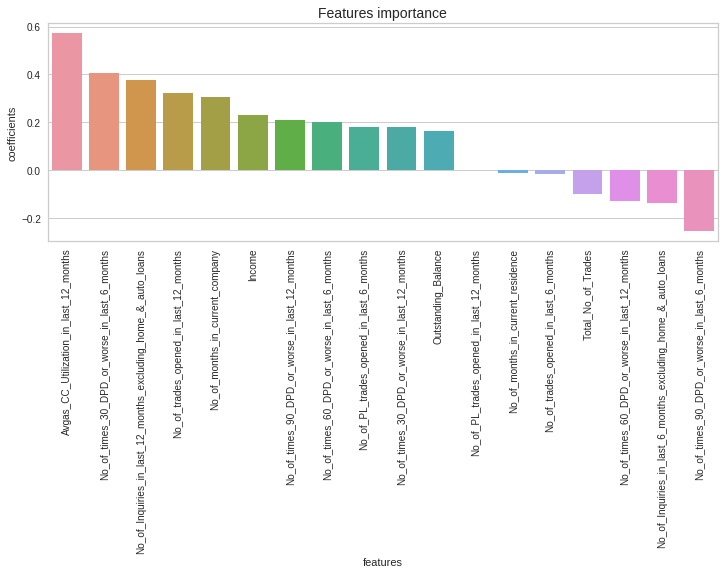

------------------------------------------------------------------------------------------------------------------------------------------------------
Area under curve (testset):  0.6368179308458367 



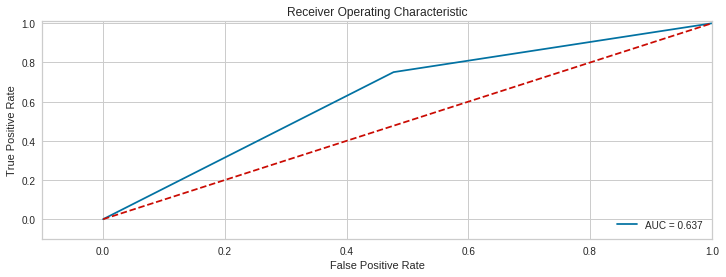

------------------------------------------------------------------------------------------------------------------------------------------------------


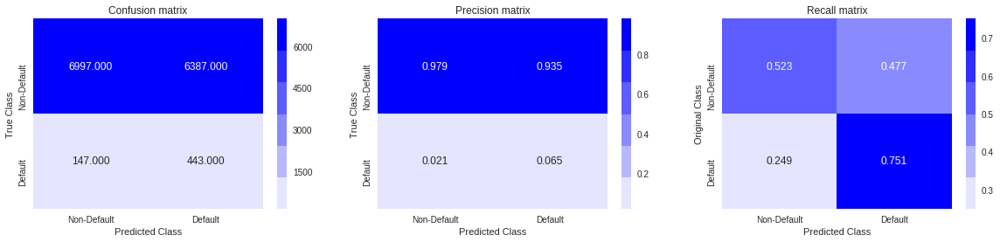

--------------------------------------------------------------- CUTOFF - DataFrame ------------------------------------------------------------------------
     prob  accuracy  sensi_recall     speci    precis       ppv       npv
0.0   0.0  0.559375      1.000000  0.000000  0.559375  0.559375       NaN
0.1   0.1  0.559375      1.000000  0.000000  0.559375  0.559375       NaN
0.2   0.2  0.559375      1.000000  0.000000  0.559375  0.559375       NaN
0.3   0.3  0.667178      0.907242  0.362417  0.643675  0.643675  0.754762
0.4   0.4  0.687308      0.863953  0.463057  0.671340  0.671340  0.728342
0.5   0.5  0.696417      0.777473  0.593516  0.708297  0.708297  0.677519
0.6   0.6  0.677281      0.655373  0.705093  0.738304  0.738304  0.617097
0.7   0.7  0.629965      0.480345  0.819907  0.772003  0.772003  0.554138
0.8   0.8  0.522669      0.185478  0.950734  0.826974  0.826974  0.479015
0.9   0.9  0.440625      0.000000  1.000000       NaN       NaN  0.440625
------------------------------

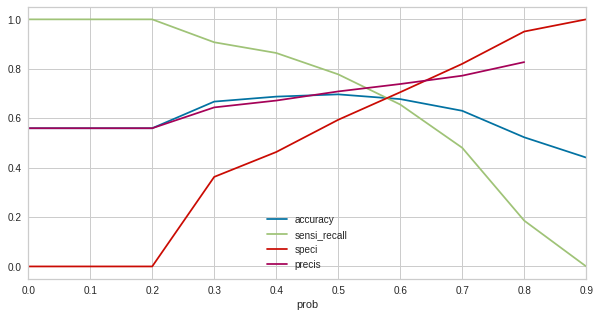

In [0]:
logit  = gc.best_estimator_

bank_risk_prediction(logit,X_train_Smote,X_test,y_train_Smote,y_test,
                         X_train.columns,"coefficients",threshold_plot = True)


* Predictions based on Cutoff

Sensitivity (trainset): 0.69	Specificity (trainset): 0.67
Sensitivity (testset): 0.68	Specificity (testset): 0.6
------------------------------------------------------------------------------------------------------------------------
LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=-1, penalty='l2',
                   random_state=100, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.98      0.60      0.75     13384
         1.0       0.07      0.68      0.13       590

    accuracy                           0.61     13974
   macro avg       0.52      0.64      0.44     13974
weighted avg       0.94      0.61      0.72     13974

-------------------------------------------------------------------------------

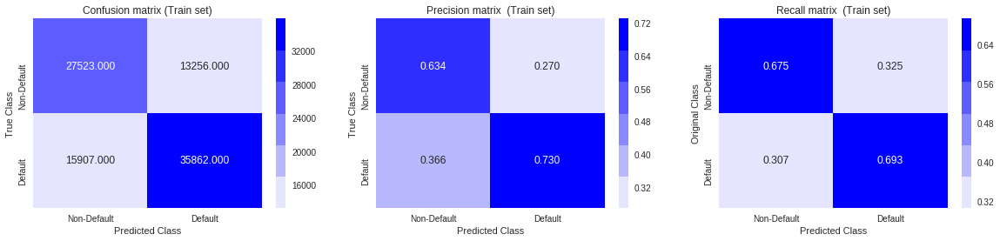

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[8088 5296]
 [ 187  403]]


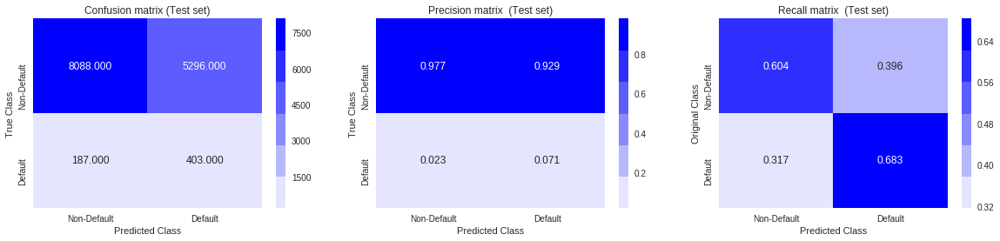

------------------------------------------------------------------------------------------------------------------------
Area under curve (testset):  0.6436772468011387 



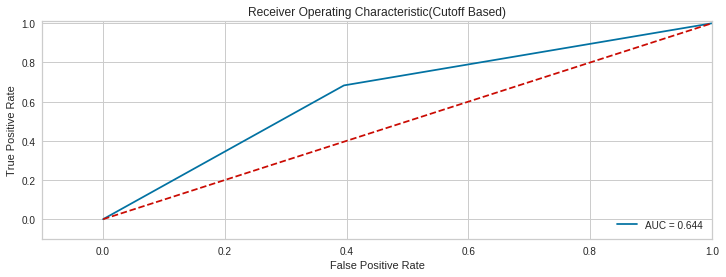

------------------------------------------------------------------------------------------------------------------------------------------------------


In [0]:
# logit  = LogisticRegression(n_jobs=-1,random_state=100, penalty='l2', C=0.001, class_weight='balanced')

bank_risk_prediction_cutoff(logit,X_train_Smote,X_test,y_train_Smote,y_test,0.57,X_test.columns)

* Predictions on Null Rows in Target Column(Performance Tag)

In [0]:
master_delta_df.columns

Index(['Income', 'No_of_months_in_current_residence',
       'No_of_months_in_current_company',
       'No_of_times_90_DPD_or_worse_in_last_6_months',
       'No_of_times_60_DPD_or_worse_in_last_6_months',
       'No_of_times_30_DPD_or_worse_in_last_6_months',
       'No_of_times_90_DPD_or_worse_in_last_12_months',
       'No_of_times_60_DPD_or_worse_in_last_12_months',
       'No_of_times_30_DPD_or_worse_in_last_12_months',
       'Avgas_CC_Utilization_in_last_12_months',
       'No_of_trades_opened_in_last_6_months',
       'No_of_trades_opened_in_last_12_months',
       'No_of_PL_trades_opened_in_last_6_months',
       'No_of_PL_trades_opened_in_last_12_months',
       'No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans',
       'No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans',
       'Outstanding_Balance', 'Total_No_of_Trades', 'Performance_Tag'],
      dtype='object')

Sensitivity (trainset): 0.77	Specificity (trainset): 0.61
Sensitivity (testset): 1.0	Specificity (testset): 0.0
------------------------------------------------------------------------------------------------------------------------
LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=-1, penalty='l2',
                   random_state=100, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         0
         1.0       1.00      1.00      1.00      1425

    accuracy                           1.00      1425
   macro avg       0.50      0.50      0.50      1425
weighted avg       1.00      1.00      1.00      1425

--------------------------------------------------------------------------------

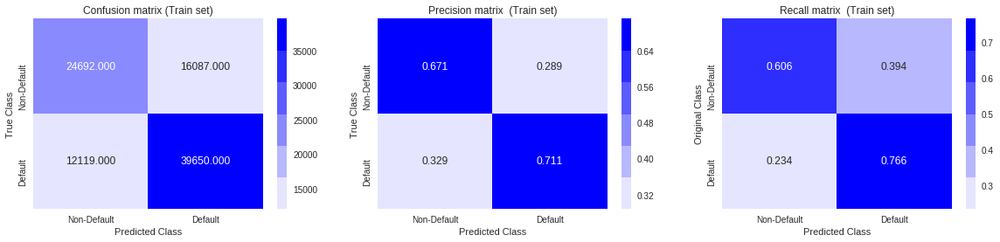

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[   0    0]
 [   1 1424]]


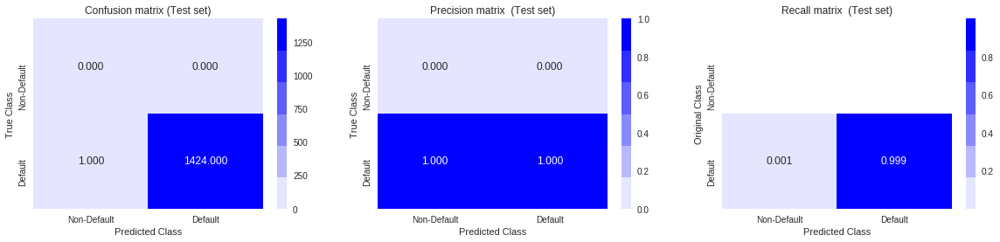

------------------------------------------------------------------------------------------------------------------------


In [0]:
woe_all_nulls_data = master_delta_df.copy() 
woe_all_nulls_data.Performance_Tag.fillna(1, inplace=True)

perf_all_nulls_X = woe_all_nulls_data.drop(columns=['Performance_Tag'])
perf_all_nulls_y = woe_all_nulls_data.Performance_Tag

bank_risk_prediction_cutoff(logit,X_train_Smote,perf_all_nulls_X,y_train_Smote,perf_all_nulls_y,0.51,perf_all_nulls_X.columns, all_nulls = True)

* We can see that model did correctly identify almost all the extra data(1424) as defaulters but still misclassfied 1 applicant incorrectly.

### Decision Trees

In [0]:
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 500, 50),
    'min_samples_split': range(50, 500, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

In [0]:
# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1,n_jobs=-1)

In [0]:
# Fit the grid search to the data
grid_search.fit(X_train_Smote,y_train_Smote)

# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

Fitting 5 folds for each of 810 candidates, totalling 4050 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 1796 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 2446 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done 3196 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 4046 tasks      | elapsed: 23.4min
[Parallel(n_jobs=-1)]: Done 4050 out of 4050 | elapsed: 23.5min finished


best accuracy 0.8953840169425595
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=13,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')


[[12827   557]
 [  540    50]]
DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=13, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

 Classification report : 
               precision    recall  f1-score   support

         0.0       0.96      0.96      0.96     13384
         1.0       0.08      0.08      0.08       590

    accuracy                           0.92     13974
   macro avg       0.52      0.52      0.52     13974
weighted avg       0.92      0.92      0.92     13974

Accuracy   Score :  0.9214255045083727


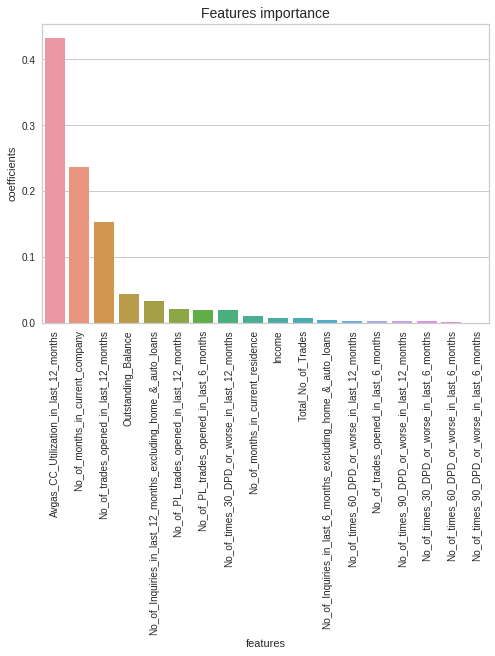

------------------------------------------------------------------------------------------------------------------------------------------------------
Area under curve (testset):  0.5215270953427822 



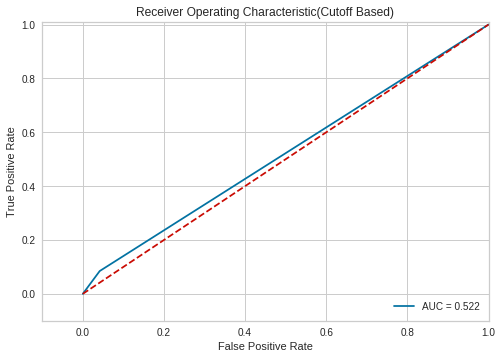

------------------------------------------------------------------------------------------------------------------------------------------------------


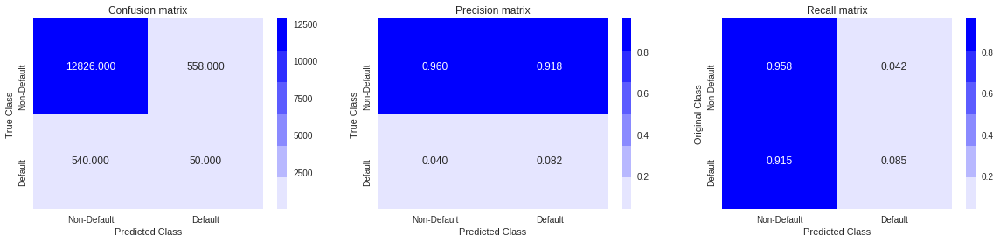

--------------------------------------------------------------- CUTOFF - DataFrame ------------------------------------------------------------------------
     prob  accuracy  sensi_recall     speci    precis       ppv       npv
0.0   0.0  0.637756      1.000000  0.177886  0.606948  0.606948  1.000000
0.1   0.1  0.802675      0.984180  0.572255  0.744959  0.744959  0.966094
0.2   0.2  0.881694      0.944368  0.802129  0.858334  0.858334  0.919078
0.3   0.3  0.896940      0.923912  0.862699  0.895207  0.895207  0.899307
0.4   0.4  0.900981      0.905909  0.894725  0.916138  0.916138  0.882221
0.5   0.5  0.901543      0.844192  0.974350  0.976625  0.976625  0.831252
0.6   0.6  0.897534      0.823871  0.991049  0.991515  0.991515  0.815917
0.7   0.7  0.894120      0.812938  0.997180  0.997275  0.997275  0.807659
0.8   0.8  0.893018      0.810137  0.998234  0.998286  0.998286  0.805505
0.9   0.9  0.889063      0.801735  0.999926  0.999928  0.999928  0.798903
------------------------------

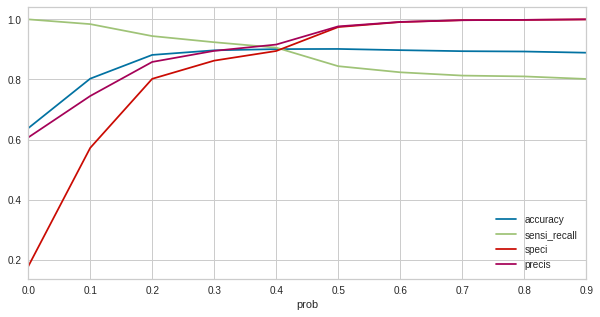

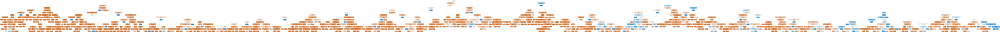

In [0]:
dtree  = gc.best_estimator_

# plot_decision_tree(X_train_Smote,X_test,y_train_Smote,y_test,X_test.columns,13,"gini",'balanced',50,50,"best", model_performance=True)

plot_decision_tree(X_train_Smote,X_test,y_train_Smote,y_test,X_test.columns,13,"entropy",'balanced',50,50,"best",model_performance = True, cut_off = False, all_nulls = False)


* Predictions based on Cutoff

[[13022   362]
 [  553    37]]
Sensitivity (trainset): 0.89	Specificity (trainset): 0.96
Sensitivity (testset): 0.1	Specificity (testset): 0.95
------------------------------------------------------------------------------------------------------------------------
DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.96      0.95      0.95     13384
         1.0       0.07      0.10      0.08       590

    accuracy                           0.91     13974
   macro avg       0.52      0.52      0.52     13974
weighted av

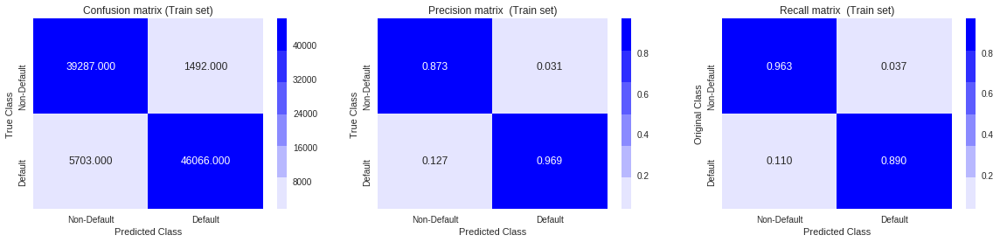

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[12676   708]
 [  533    57]]


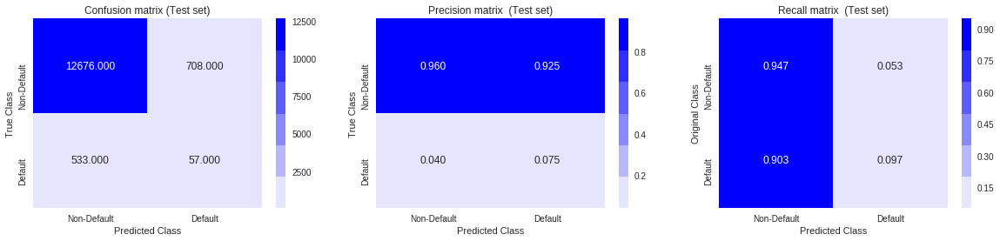

------------------------------------------------------------------------------------------------------------------------
Area under curve (testset):  0.5218555928150992 



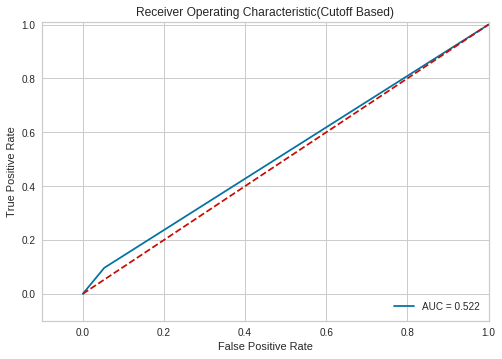

------------------------------------------------------------------------------------------------------------------------------------------------------


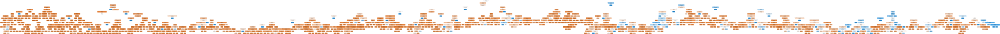

In [0]:
plot_decision_tree(X_train_Smote,X_test,y_train_Smote,y_test,X_test.columns,15,"entropy",'balanced',50,50,"best",cut_off = 0.4)

* Predictions on Null Rows in Target Column(Performance Tag)

In [0]:
master_delta_df.columns

Index(['Income', 'No_of_months_in_current_residence',
       'No_of_months_in_current_company',
       'No_of_times_90_DPD_or_worse_in_last_6_months',
       'No_of_times_60_DPD_or_worse_in_last_6_months',
       'No_of_times_30_DPD_or_worse_in_last_6_months',
       'No_of_times_90_DPD_or_worse_in_last_12_months',
       'No_of_times_60_DPD_or_worse_in_last_12_months',
       'No_of_times_30_DPD_or_worse_in_last_12_months',
       'Avgas_CC_Utilization_in_last_12_months',
       'No_of_trades_opened_in_last_6_months',
       'No_of_trades_opened_in_last_12_months',
       'No_of_PL_trades_opened_in_last_6_months',
       'No_of_PL_trades_opened_in_last_12_months',
       'No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans',
       'No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans',
       'Outstanding_Balance', 'Total_No_of_Trades', 'Performance_Tag'],
      dtype='object')

[[   0    0]
 [1203  222]]
Sensitivity (trainset): 0.89	Specificity (trainset): 0.92
Sensitivity (testset): 0.27	Specificity (testset): 0.0
------------------------------------------------------------------------------------------------------------------------
DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=13,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         0
         1.0       1.00      0.27      0.42      1425

    accuracy                           0.27      1425
   macro avg       0.50      0.13      0.21      1425
weighted avg      

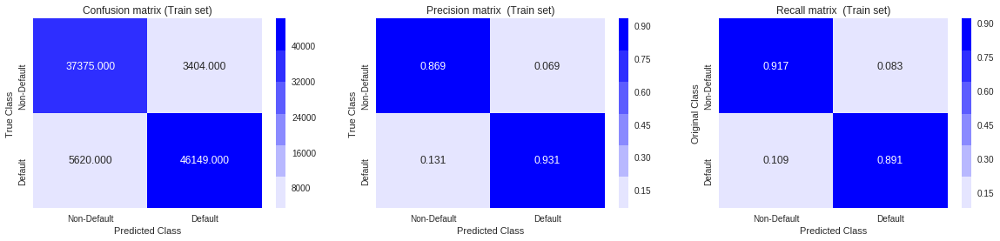

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[   0    0]
 [1045  380]]


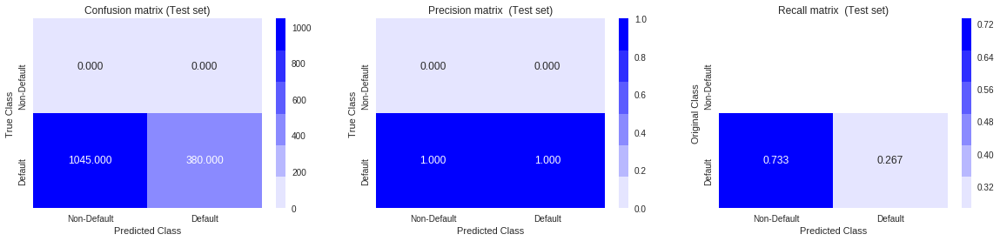

------------------------------------------------------------------------------------------------------------------------


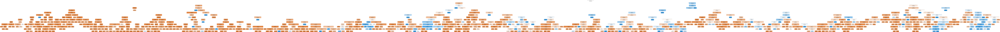

In [0]:
woe_all_nulls_data = master_delta_df.copy() 
woe_all_nulls_data.Performance_Tag.fillna(1, inplace=True)

perf_all_nulls_X = woe_all_nulls_data.drop(columns=['Performance_Tag'])
perf_all_nulls_y = woe_all_nulls_data.Performance_Tag

plot_decision_tree(X_train_Smote,perf_all_nulls_X,y_train_Smote,perf_all_nulls_y,X_test.columns,13,"gini",'balanced',50,50,"best",cut_off = 0.4, all_nulls = True)


* We can see that model's performance is very bad compared to previous Logistic regression.

### Random Forest

* Tunning - Min Sample Leaf

In [0]:
# Fine Tunning Min Sample Leaf node

n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(50, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train_Smote, y_train_Smote)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:   40.9s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.927330,0.012912,0.030402,0.000464,50,{'min_samples_leaf': 50},0.765598,0.934035,0.933552,0.928530,0.932773,0.898897,0.066679,1,0.939684,0.900664,0.900905,0.895907,0.900980,0.907628,0.016142
1,0.867688,0.011855,0.028421,0.001533,100,{'min_samples_leaf': 100},0.757292,0.904385,0.900522,0.911242,0.900512,0.874790,0.058880,2,0.908294,0.874152,0.876494,0.879657,0.873093,0.882338,0.013172
2,0.814975,0.019004,0.027372,0.002070,150,{'min_samples_leaf': 150},0.742901,0.892795,0.898010,0.884779,0.880325,0.859762,0.058753,3,0.886925,0.864155,0.871375,0.855608,0.856118,0.866836,0.011596
3,0.798180,0.012392,0.026756,0.001038,200,{'min_samples_leaf': 200},0.741549,0.871451,0.864787,0.872320,0.863614,0.842744,0.050717,4,0.868888,0.837643,0.843221,0.849016,0.842452,0.848244,0.010935
4,0.793859,0.015972,0.025729,0.000895,250,{'min_samples_leaf': 250},0.730346,0.872030,0.860440,0.853004,0.863808,0.835925,0.053143,5,0.861427,0.841869,0.839140,0.834215,0.843563,0.844043,0.009250


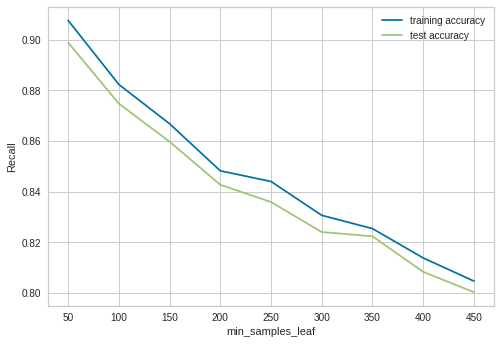

In [0]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.show()

* Tunning - Min Sample Split

In [0]:
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                 return_train_score=True, verbose = 1)
rf.fit(X_train_Smote, y_train_Smote)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:   30.8s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.950501,0.017729,0.026203,0.001785,200,{'min_samples_split': 200},0.863533,0.959481,0.956834,0.962129,0.954020,0.939199,0.037930,1,0.967044,0.942624,0.941206,0.943934,0.939452,0.946852,0.010205
1,0.928583,0.027208,0.025182,0.001442,250,{'min_samples_split': 250},0.860616,0.950729,0.952458,0.952242,0.948293,0.932867,0.036157,2,0.960210,0.934453,0.938167,0.934453,0.933509,0.940158,0.010152
2,0.919207,0.019810,0.024177,0.000971,300,{'min_samples_split': 300},0.857104,0.943274,0.943220,0.952782,0.942619,0.927800,0.035550,3,0.957022,0.929833,0.928307,0.935222,0.928350,0.935747,0.010936
3,0.911777,0.023757,0.023273,0.000689,350,{'min_samples_split': 350},0.851378,0.940303,0.941437,0.946137,0.938135,0.923478,0.036145,4,0.947392,0.924633,0.925565,0.925795,0.921799,0.929037,0.009287
4,0.900473,0.029651,0.023161,0.001196,400,{'min_samples_split': 400},0.847974,0.935008,0.935873,0.932253,0.931651,0.916551,0.034326,5,0.945204,0.920500,0.919501,0.916489,0.917518,0.923842,0.010774


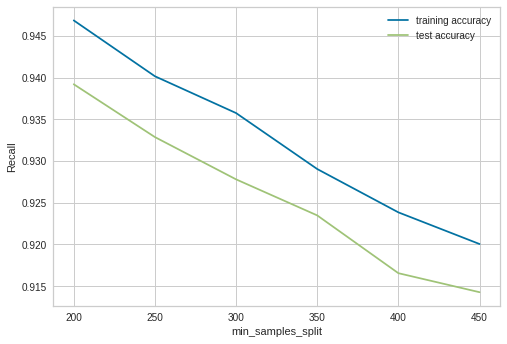

In [0]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.show()

* Tunning Max Depth

In [0]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 4)}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train_Smote, y_train_Smote)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:   21.6s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.274568,0.004356,0.018808,0.000754,2,{'max_depth': 2},0.726772,0.714989,0.732664,0.679737,0.753501,0.721532,0.024343,5,0.727852,0.706966,0.736086,0.685838,0.757775,0.722903,0.024666
1,0.598794,0.039972,0.021728,0.001054,6,{'max_depth': 6},0.738362,0.809059,0.787811,0.788874,0.804405,0.785702,0.025104,4,0.809827,0.788627,0.782567,0.776023,0.795828,0.790574,0.011644
2,0.817356,0.017582,0.026826,0.001438,10,{'max_depth': 10},0.756712,0.906220,0.907765,0.910180,0.894137,0.875002,0.059404,3,0.896728,0.883545,0.887191,0.885887,0.875845,0.885839,0.006716
3,0.973915,0.026296,0.031411,0.000957,14,{'max_depth': 14},0.781147,0.960692,0.958180,0.956539,0.956728,0.922656,0.070771,2,0.964095,0.937607,0.938597,0.937897,0.938502,0.943340,0.010384
4,1.040013,0.020909,0.034399,0.000999,18,{'max_depth': 18},0.788101,0.986865,0.982422,0.979525,0.983966,0.944175,0.078074,1,0.980635,0.976723,0.972908,0.970180,0.974816,0.975053,0.003531


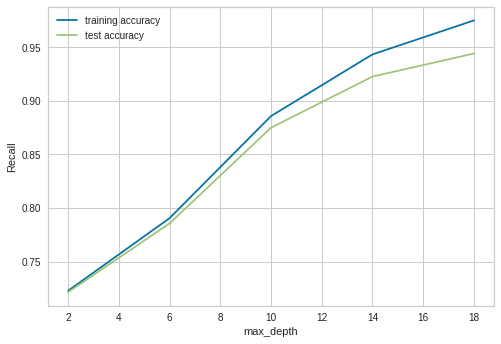

In [0]:
# plotting accuracies with param_max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.show()

* Tunning n_Estimators

In [0]:
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 400)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight='balanced',max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                    return_train_score=True, verbose = 1)
rf.fit(X_train_Smote, y_train_Smote)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed: 15.1min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,5.744644,0.052381,0.137365,0.004590,100,{'n_estimators': 100},0.742998,0.823740,0.813116,0.813888,0.809137,0.800576,0.029188,3,0.814681,0.799420,0.808837,0.805312,0.798049,0.805260,0.006126
1,28.541858,0.414963,0.641945,0.014077,500,{'n_estimators': 500},0.740583,0.829534,0.805969,0.812729,0.815512,0.800865,0.031104,2,0.812145,0.805022,0.803477,0.803718,0.803216,0.805516,0.003373
2,51.925700,0.628802,1.178883,0.035996,900,{'n_estimators': 900},0.743771,0.825285,0.807128,0.813599,0.811745,0.800305,0.028894,4,0.817095,0.801787,0.802439,0.804274,0.800126,0.805144,0.006122
3,78.257526,0.570940,1.773565,0.026454,1300,{'n_estimators': 1300},0.742708,0.826347,0.806645,0.815337,0.815512,0.801310,0.029960,1,0.815381,0.801811,0.803453,0.806109,0.804013,0.806153,0.004814


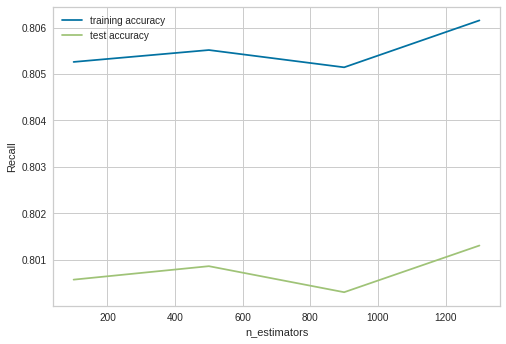

In [0]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Recall")
plt.legend()
plt.show()

* Tunning Max Features

In [0]:
n_folds = 5

# parameters to build the model on
parameters = {'max_features': ['auto', 'sqrt']}

# instantiate the model
rf = RandomForestClassifier(class_weight='balanced', max_depth=6)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="recall",
                 return_train_score=True, verbose = 1)
rf.fit(X_train_Smote, y_train_Smote)

Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    7.5s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=6,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [0]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.640625,0.009479,0.023819,0.001289,auto,{'max_features': 'auto'},0.745123,0.806355,0.797083,0.801719,0.787405,0.787537,0.022115,2,0.816564,0.783050,0.788507,0.790849,0.778153,0.791424,0.013320
1,0.636062,0.022350,0.023515,0.000989,sqrt,{'max_features': 'sqrt'},0.735561,0.815144,0.807804,0.812053,0.789240,0.791960,0.029599,1,0.811831,0.794615,0.802946,0.800749,0.783972,0.798823,0.009254


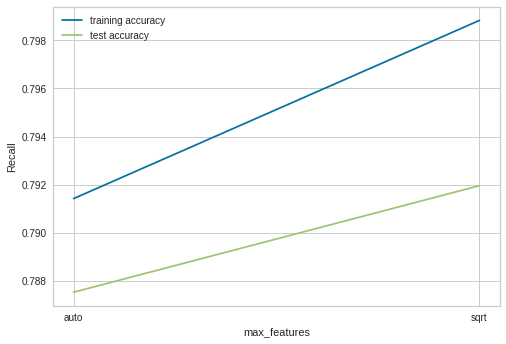

In [0]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Recall")
plt.legend()
plt.show()

* Finding Appropriate combination of Hyperparameter

In [0]:
# Number of trees in random forest
n_estimators = [1000, 1300, 1400]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(6, 10, num = 1)]

# Minimum number of samples required to split a node
min_samples_split = [200, 300, 400]
# Minimum number of samples required at each leaf node
min_samples_leaf = [50, 150, 200]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'class_weight': ['balanced']
               }

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3 , verbose=1, random_state=42, n_jobs=-1)
# Fit the random search model
rf_random.fit(X_train_Smote, y_train_Smote)

print(rf_random.best_params_)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed: 43.7min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed: 173.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 281.8min finished


{'n_estimators': 1400, 'min_samples_split': 200, 'min_samples_leaf': 50, 'max_features': 'auto', 'max_depth': 6, 'class_weight': 'balanced', 'bootstrap': False}


RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=4, max_features=10,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=350,
                       min_samples_split=400, min_weight_fraction_leaf=0.0,
                       n_estimators=900, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

 Classification report : 
               precision    recall  f1-score   support

         0.0       0.97      0.69      0.80     13384
         1.0       0.07      0.54      0.12       590

    accuracy                           0.68     13974
   macro avg       0.52      0.61      0.46     13974
weighted avg       0.93      0.68      0.78     13974

Accuracy   Score :  0.6797624159152712


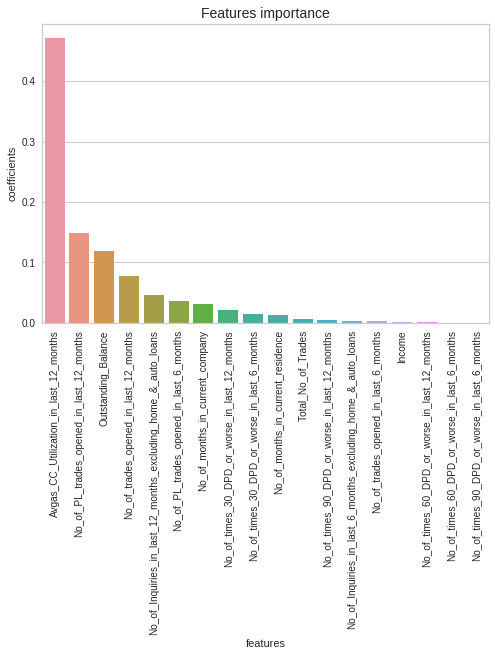

------------------------------------------------------------------------------------------------------------------------------------------------------
Area under curve (testset):  0.6116655860273335 



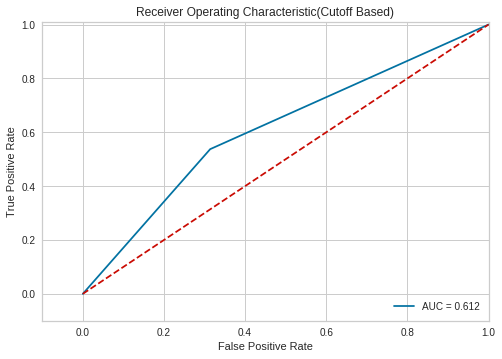

------------------------------------------------------------------------------------------------------------------------------------------------------


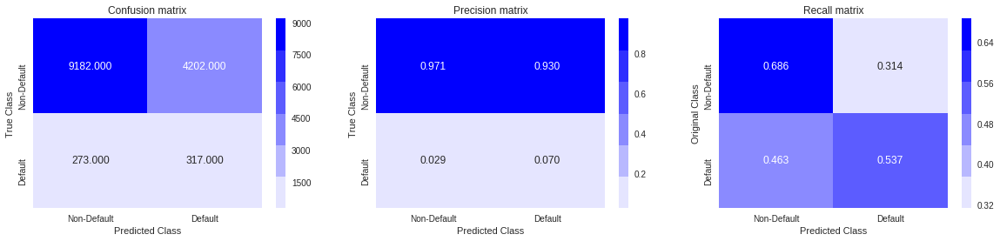

--------------------------------------------------------------- CUTOFF - DataFrame ------------------------------------------------------------------------
     prob  accuracy  sensi_recall     speci    precis       ppv       npv
0.0   0.0  0.559375      1.000000  0.000000  0.559375  0.559375       NaN
0.1   0.1  0.577527      0.999710  0.041566  0.569740  0.569740  0.991228
0.2   0.2  0.599667      0.995132  0.097624  0.583332  0.583332  0.940468
0.3   0.3  0.717963      0.939153  0.437161  0.679311  0.679311  0.849836
0.4   0.4  0.755943      0.876258  0.603203  0.737082  0.737082  0.793381
0.5   0.5  0.767061      0.779501  0.751269  0.799137  0.799137  0.728544
0.6   0.6  0.745591      0.642856  0.876015  0.868114  0.868114  0.658950
0.7   0.7  0.679842      0.454365  0.966085  0.944469  0.944469  0.582411
0.8   0.8  0.521718      0.144971  1.000000  1.000000  1.000000  0.479510
0.9   0.9  0.443489      0.005119  1.000000  1.000000  1.000000  0.441891
------------------------------

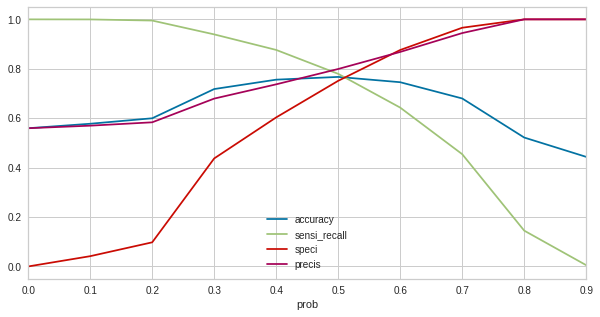

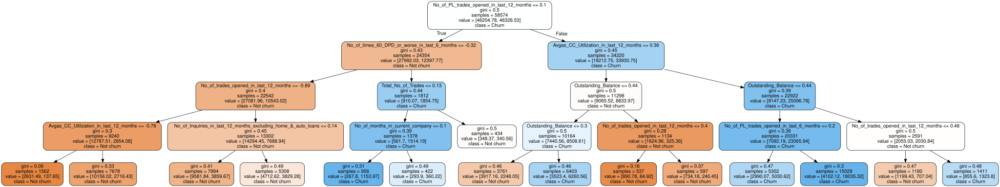

In [0]:
features_num = X_test.columns.tolist()

# plot_tree_randomforest(X_train_Smote,X_test,y_train_Smote,y_test,features_num,1400,'auto',50,6,"gini",'balanced',50,200,"best",True)

plot_tree_randomforest(X_train_Smote,X_test,y_train_Smote,y_test,features_num,900,10,50,4,"gini",'balanced',350,400,"best",True)

* Predictions based on Cutoff

Sensitivity (trainset): 0.75	Specificity (trainset): 0.79
Sensitivity (testset): 0.48	Specificity (testset): 0.73
------------------------------------------------------------------------------------------------------------------------
RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=4, max_features=10,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=350,
                       min_samples_split=400, min_weight_fraction_leaf=0.0,
                       n_estimators=900, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.97      0.73      0.83     13384
         1.0       0.07      0.48      0.13       590

    accuracy                           0.72     13974
   macro avg   

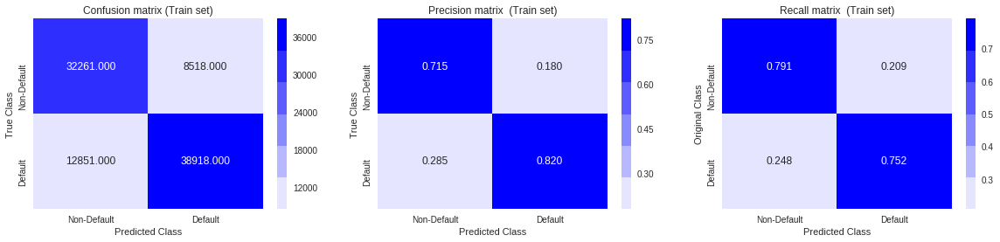

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[9756 3628]
 [ 305  285]]


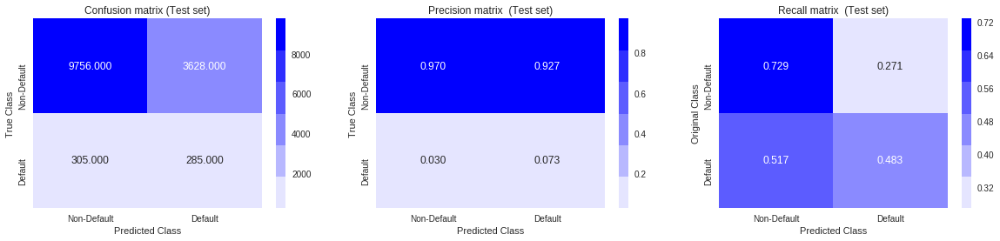

------------------------------------------------------------------------------------------------------------------------
Area under curve (testset):  0.6059904566038882 



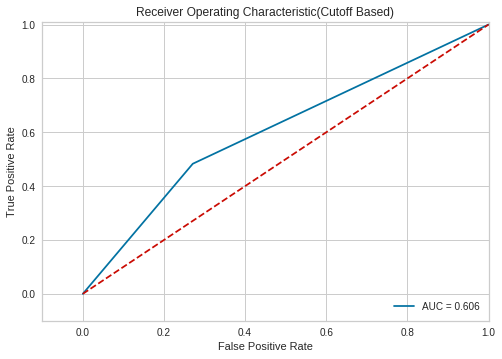

------------------------------------------------------------------------------------------------------------------------------------------------------


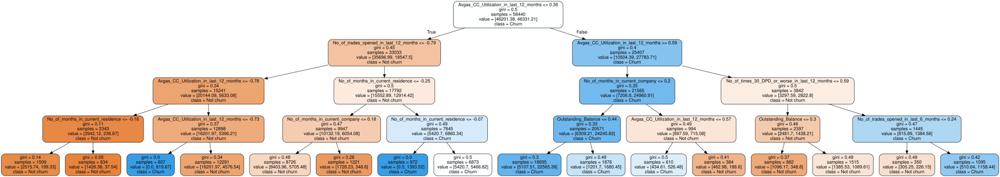

In [0]:
# plot_tree_randomforest(X_train_Smote,X_test,y_train_Smote,y_test,features_num,1400,50,6,"gini",'balanced',50,200,"best",cut_off = 0.49)

plot_tree_randomforest(X_train_Smote,X_test,y_train_Smote,y_test,features_num,900,10,50,4,"gini",'balanced',350,400,"best",cut_off = 0.52)


* Predictions on Null Rows in Target Column(Performance Tag)

In [0]:
master_delta_df.columns

Index(['Income', 'No_of_months_in_current_residence',
       'No_of_months_in_current_company',
       'No_of_times_90_DPD_or_worse_in_last_6_months',
       'No_of_times_60_DPD_or_worse_in_last_6_months',
       'No_of_times_30_DPD_or_worse_in_last_6_months',
       'No_of_times_90_DPD_or_worse_in_last_12_months',
       'No_of_times_60_DPD_or_worse_in_last_12_months',
       'No_of_times_30_DPD_or_worse_in_last_12_months',
       'Avgas_CC_Utilization_in_last_12_months',
       'No_of_trades_opened_in_last_6_months',
       'No_of_trades_opened_in_last_12_months',
       'No_of_PL_trades_opened_in_last_6_months',
       'No_of_PL_trades_opened_in_last_12_months',
       'No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans',
       'No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans',
       'Outstanding_Balance', 'Total_No_of_Trades', 'Performance_Tag'],
      dtype='object')

Sensitivity (trainset): 0.76	Specificity (trainset): 0.79
Sensitivity (testset): 0.8	Specificity (testset): 0.0
------------------------------------------------------------------------------------------------------------------------
RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=4, max_features=10,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=350,
                       min_samples_split=400, min_weight_fraction_leaf=0.0,
                       n_estimators=900, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

 Classification report (testset) : 
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         0
         1.0       1.00      0.80      0.89      1425

    accuracy                           0.80      1425
   macro avg     

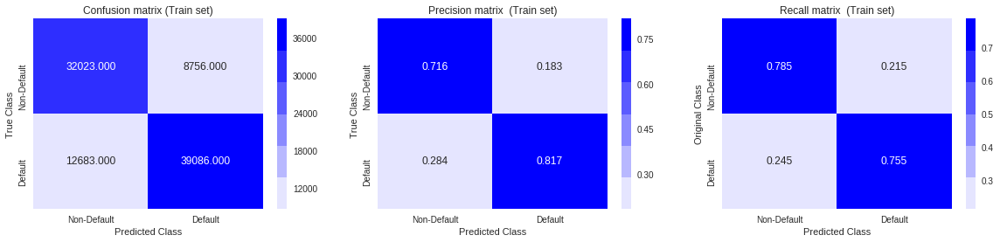

------------------------------------------------------------------------------------------------------------------------
Test Confussion Matrix:  [[   0    0]
 [ 288 1137]]


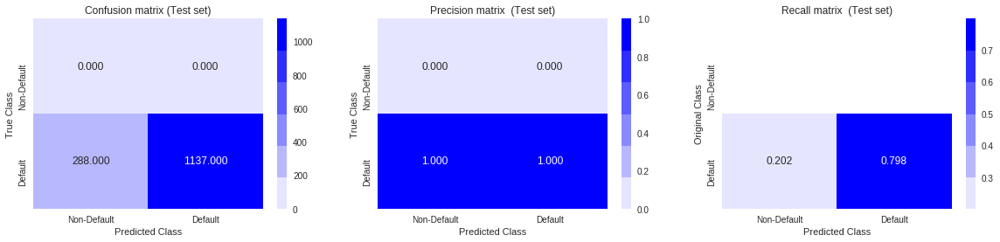

------------------------------------------------------------------------------------------------------------------------


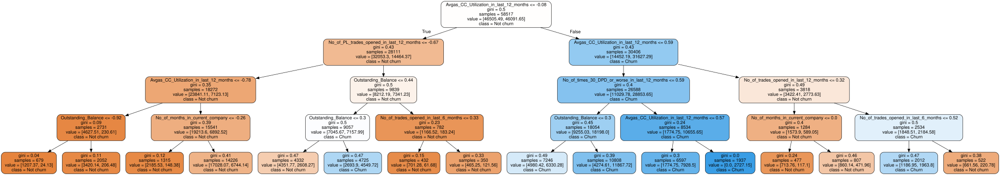

In [0]:
woe_all_nulls_data = master_delta_df.copy() 
woe_all_nulls_data.Performance_Tag.fillna(1, inplace=True)

perf_all_nulls_X = woe_all_nulls_data.drop(columns=['Performance_Tag'])
perf_all_nulls_y = woe_all_nulls_data.Performance_Tag

# plot_tree_randomforest(X_train_Smote,perf_all_nulls_X,y_train_Smote,perf_all_nulls_y,features_num,1400,50,6,"gini",'balanced',50,200,"best",cut_off = 0.49, all_nulls = True)

plot_tree_randomforest(X_train_Smote,perf_all_nulls_X,y_train_Smote,perf_all_nulls_y,features_num,900,10,50,4,"gini",'balanced',350,400,"best",cut_off = 0.52, all_nulls = True)


* We can see that model did correctly identify around 1137 as defaulters and around 288 missidentified as False Negatives.

### Gradient Boosting

In [0]:
def modelfit(alg, training_x, testing_x, training_y, testing_y, performCV=True, printFeatureImportance=True, cv_folds=5):
    #Fit the algorithm on the data
    alg.fit(training_x, training_y)
        
    #Predict training set:
    dtrain_predictions = alg.predict(training_x)
    dtrain_predprob = alg.predict_proba(training_x)[:,1]
    
    #Perform cross-validation:
    if performCV:
        # cv_score = cross_validation.cross_val_score(alg, training_x, training_y, cv=cv_folds, scoring='roc_auc')
        cv_score = cross_val_score(alg, training_x, training_y, cv=cv_folds, scoring='roc_auc')
        # cv_score = RandomizedSearchCV(alg, random_state=40, n_iter=100, cv=cv_folds, verbose=0, n_jobs=-1)
        
    
    #Print model report:
    print ("\nModel Report")
    print ("Accuracy : %.4g" % metrics.accuracy_score(training_y, dtrain_predictions))
    print ("AUC Score (Train): %f" % metrics.roc_auc_score(training_y, dtrain_predprob))
    
    if performCV:
        print ("CV Score : Mean - %.7g | Std - %.7g | Min - %.7g | Max - %.7g" % (np.mean(cv_score),np.std(cv_score),np.min(cv_score),np.max(cv_score)))
        
    #Print Feature Importance:
    if printFeatureImportance:
        feat_imp = pd.Series(alg.feature_importances_, testing_x.columns).sort_values(ascending=False)
        feat_imp.plot(kind='bar', title='Feature Importances')
        plt.ylabel('Feature Importance Score')

In [0]:
from sklearn.ensemble import GradientBoostingClassifier
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 12, 4


Model Report
Accuracy : 0.9585
AUC Score (Train): 0.985152
CV Score : Mean - 0.9814911 | Std - 0.02902101 | Min - 0.9234677 | Max - 0.9968615


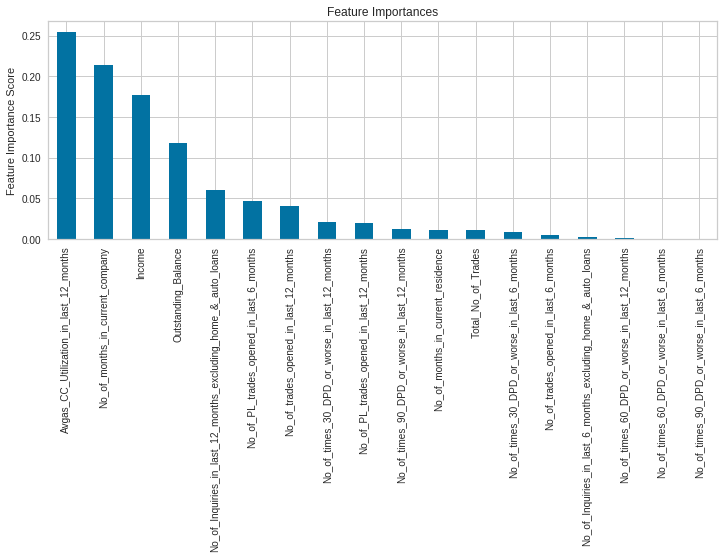

In [0]:
gbm0 = GradientBoostingClassifier(random_state=10)
modelfit(gbm0, X_train_Smote,X_test,y_train_Smote,y_test)

In [0]:
#Choose all predictors except target & IDcols
# predictors = [x for x in train.columns if x not in [target, IDcol]]
param_test1 = {'n_estimators':range(80,200,10)}
gsearch1 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=1, min_samples_split=500,min_samples_leaf=50,max_depth=8,max_features='sqrt',subsample=0.8,random_state=10), 
param_grid = param_test1, scoring='roc_auc',n_jobs=4,iid=False, cv=5)
gsearch1.fit(X_train_Smote,y_train_Smote)
print('-------'*30)
print('CV Grid Results: ',gsearch1.cv_results_)
print('-------'*30)
print('CV Best Params: ',gsearch1.best_params_)
print('-------'*30)
print('CV Best Scores: ',gsearch1.best_score_)

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
CV Grid Results:  {'mean_fit_time': array([24.59789562, 27.59697566, 29.50165358, 31.74287376, 34.33996878,
       36.85842052, 39.41761112, 41.85704837, 44.71461291, 46.72801638,
       49.58259068, 49.76436009]), 'std_fit_time': array([ 0.9704495 ,  2.18280785,  3.10217181,  4.01378986,  5.24339664,
        6.39928906,  7.25291357,  8.53507878,  9.38655251, 10.5831914 ,
       11.69330214, 11.62365287]), 'mean_score_time': array([0.1722146 , 0.20045924, 0.21859899, 0.22641015, 0.23464475,
       0.241396  , 0.24205155, 0.28314571, 0.2916667 , 0.31467528,
       0.32870193, 0.23319173]), 'std_score_time': array([0.0027649 , 0.01834478, 0.02556191, 0.02932099, 0.03513983,
       0.03874076, 0.0800204 , 0.05374154, 0.060197  , 0.06686984,
       0.07272935, 0.10019286]), 'param_n

* Tunning some other trees specific parameters

In [0]:
param_test2 = {'max_depth':range(5,16,2), 'min_samples_split':range(200,1001,200)}
gsearch2 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=1, n_estimators=80, max_features='sqrt', subsample=0.8, random_state=10), 
param_grid = param_test2, scoring='roc_auc',n_jobs=4,iid=False, cv=5)
gsearch2.fit(X_train_Smote,y_train_Smote)
print('-------'*30)
print('CV Grid Results: ',gsearch2.cv_results_)
print('-------'*30)
print('CV Best Params: ',gsearch2.best_params_)
print('-------'*30)
print('CV Best Scores: ',gsearch2.best_score_)


------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
CV Grid Results:  {'mean_fit_time': array([15.02506561, 14.73481708, 14.48327894, 14.42851343, 14.25809894,
       22.06486292, 21.47391057, 20.55395851, 19.79764662, 19.3398428 ,
       27.22916541, 26.97262821, 25.44276838, 24.48551865, 24.00030789,
       35.59253607, 30.77264166, 29.69450474, 28.86252718, 28.08187637,
       42.16244755, 37.76182876, 33.86074886, 32.45027199, 30.31657782,
       52.99878631, 40.962993  , 38.01812916, 35.20135589, 30.57058306]), 'std_fit_time': array([ 0.16826262,  0.34695319,  0.33970025,  0.15829816,  0.17259427,
        0.21540219,  0.72181866,  0.50591764,  0.78868265,  0.56764227,
        2.71462554,  2.50600198,  1.51366493,  1.09641273,  1.21685206,
        5.84413036,  4.25527092,  4.18754666,  3.44219431,  3.02216303,
        8.73945

In [0]:
param_test3 = {'min_samples_split':range(1000,2100,200), 'min_samples_leaf':range(30,71,10)}
gsearch3 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=1, n_estimators=80,max_depth=9,max_features='sqrt', subsample=0.8, random_state=10), 
param_grid = param_test3, scoring='roc_auc',n_jobs=4,iid=False, cv=5)
gsearch3.fit(X_train_Smote,y_train_Smote)
print('-------'*30)
print('CV Grid Results: ',gsearch3.cv_results_)
print('-------'*30)
print('CV Best Params: ',gsearch3.best_params_)
print('-------'*30)
print('CV Best Scores: ',gsearch3.best_score_)

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
CV Grid Results:  {'mean_fit_time': array([24.61925602, 24.72816114, 24.19165449, 23.26517873, 22.53699188,
       22.22949505, 25.0060401 , 24.35266151, 23.42171965, 22.72473259,
       22.10470738, 21.72084351, 24.14804211, 23.55504107, 22.81438169,
       22.40956674, 21.98281674, 21.6665205 , 23.91896005, 23.52134113,
       22.9846602 , 22.51824708, 21.88698659, 21.70376315, 24.42869859,
       23.41522212, 22.88433585, 22.41227674, 22.82338853, 18.49441199]), 'std_fit_time': array([1.29210551, 0.91735009, 0.47094063, 0.43994341, 0.41267364,
       0.39971704, 0.95971625, 1.07863033, 0.59794475, 0.58986467,
       0.27767893, 0.11909047, 1.03851207, 0.97297825, 1.0689161 ,
       0.31327237, 0.36811015, 0.33587913, 0.92958757, 0.86301491,
       0.56612364, 0.58178381, 0.16

In [0]:
param_test4 = {'max_features':range(7,18,2)}
gsearch4 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=1, n_estimators=80,max_depth=9, min_samples_split=1000, min_samples_leaf=30, subsample=0.8, random_state=10),
param_grid = param_test4, scoring='roc_auc',n_jobs=4,iid=False, cv=5)
gsearch4.fit(X_train_Smote,y_train_Smote)
print('-------'*30)
print('CV Grid Results: ',gsearch4.cv_results_)
print('-------'*30)
print('CV Best Params: ',gsearch4.best_params_)
print('-------'*30)
print('CV Best Scores: ',gsearch4.best_score_)

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
CV Grid Results:  {'mean_fit_time': array([42.58924012, 50.53981652, 59.6677094 , 67.38809009, 75.78852291,
       74.00234737]), 'std_fit_time': array([ 5.40419393,  7.34123664,  9.8530408 , 11.30520251, 13.74621605,
       14.71473292]), 'mean_score_time': array([0.18598781, 0.18566546, 0.18288388, 0.18078976, 0.18740149,
       0.11777167]), 'std_score_time': array([0.02159452, 0.02364907, 0.02511229, 0.0269115 , 0.03704042,
       0.04046696]), 'param_max_features': masked_array(data=[7, 9, 11, 13, 15, 17],
             mask=[False, False, False, False, False, False],
       fill_value='?',
            dtype=object), 'params': [{'max_features': 7}, {'max_features': 9}, {'max_features': 11}, {'max_features': 13}, {'max_features': 15}, {'max_features': 17}], 'split0_test_score

In [0]:
param_test5 = {'subsample':[0.6,0.7,0.75,0.8,0.85,0.9]}
gsearch5 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=1, n_estimators=80,max_depth=9,min_samples_split=1000, min_samples_leaf=30, subsample=0.8, random_state=10,max_features=7),
param_grid = param_test5, scoring='roc_auc',n_jobs=4,iid=False, cv=5)
gsearch5.fit(X_train_Smote,y_train_Smote)
print('-------'*30)
print('CV Grid Results: ',gsearch5.cv_results_)
print('-------'*30)
print('CV Best Params: ',gsearch5.best_params_)
print('-------'*30)
print('CV Best Scores: ',gsearch5.best_score_)

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
CV Grid Results:  {'mean_fit_time': array([36.00402985, 39.41834188, 40.81034956, 42.13071537, 43.58283157,
       38.15098548]), 'std_fit_time': array([2.38873309, 3.54290712, 3.9657519 , 4.9724868 , 6.09408925,
       7.47671513]), 'mean_score_time': array([0.18639345, 0.19225273, 0.19145312, 0.19045682, 0.18892746,
       0.13224049]), 'std_score_time': array([0.01026395, 0.01934331, 0.00633009, 0.01827294, 0.02061645,
       0.04074719]), 'param_subsample': masked_array(data=[0.6, 0.7, 0.75, 0.8, 0.85, 0.9],
             mask=[False, False, False, False, False, False],
       fill_value='?',
            dtype=object), 'params': [{'subsample': 0.6}, {'subsample': 0.7}, {'subsample': 0.75}, {'subsample': 0.8}, {'subsample': 0.85}, {'subsample': 0.9}], 'split0_test_score': arra

In [0]:
gsearch5.best_estimator_

GradientBoostingClassifier(criterion='friedman_mse', init=None, learning_rate=1,
                           loss='deviance', max_depth=9, max_features=7,
                           max_leaf_nodes=None, min_impurity_decrease=0.0,
                           min_impurity_split=None, min_samples_leaf=30,
                           min_samples_split=1000, min_weight_fraction_leaf=0.0,
                           n_estimators=80, n_iter_no_change=None,
                           presort='auto', random_state=10, subsample=0.8,
                           tol=0.0001, validation_fraction=0.1, verbose=0,
                           warm_start=False)


Model Report
Accuracy : 0.9844
AUC Score (Train): 0.996683
CV Score : Mean - 0.9844102 | Std - 0.03042863 | Min - 0.9235532 | Max - 0.9997126


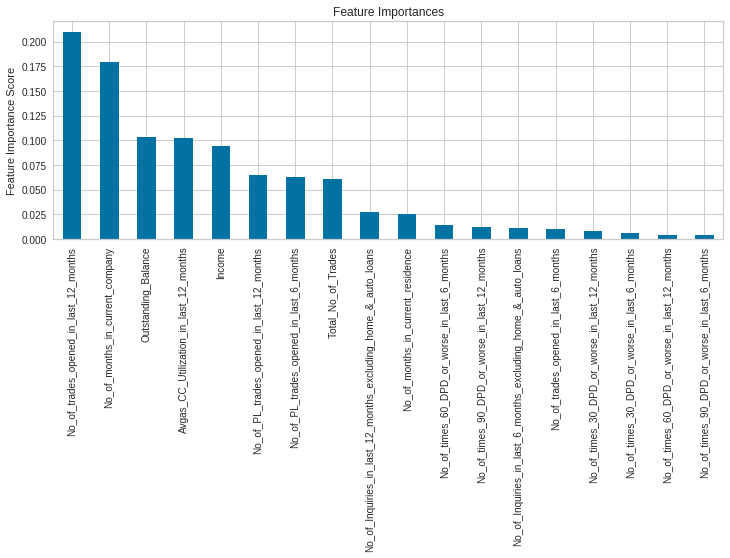

In [0]:
modelfit(gsearch5.best_estimator_, X_train_Smote,X_test,y_train_Smote,y_test)

GradientBoostingClassifier(criterion='friedman_mse', init=None, learning_rate=1,
                           loss='deviance', max_depth=9, max_features=7,
                           max_leaf_nodes=None, min_impurity_decrease=0.0,
                           min_impurity_split=None, min_samples_leaf=30,
                           min_samples_split=1000, min_weight_fraction_leaf=0.0,
                           n_estimators=80, n_iter_no_change=None,
                           presort='auto', random_state=10, subsample=0.8,
                           tol=0.0001, validation_fraction=0.1, verbose=0,
                           warm_start=False)

 Classification report : 
               precision    recall  f1-score   support

         0.0       0.96      0.96      0.96     13384
         1.0       0.08      0.09      0.08       590

    accuracy                           0.92     13974
   macro avg       0.52      0.52      0.52     13974
weighted avg       0.92      0.92      0.92     13974



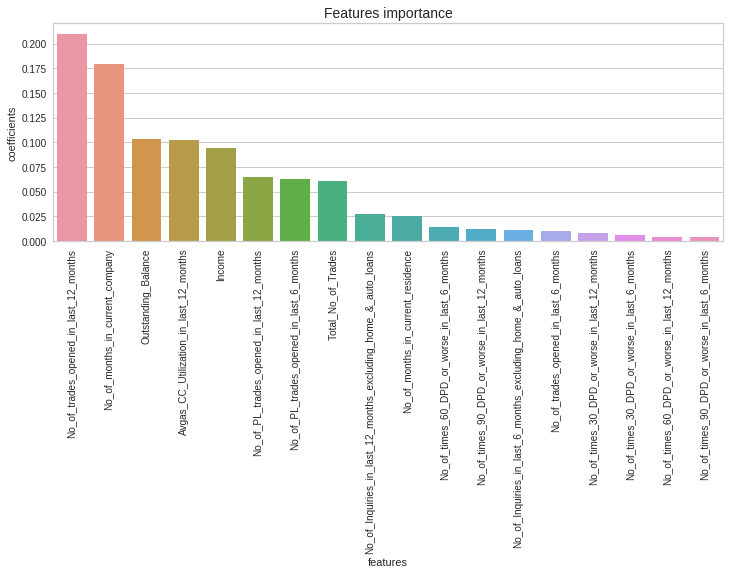

------------------------------------------------------------------------------------------------------------------------------------------------------
Area under curve (testset):  0.5214032439441985 



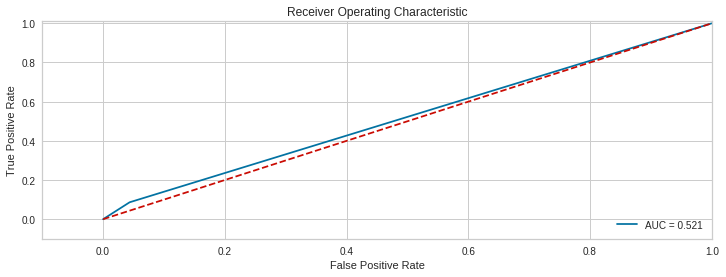

------------------------------------------------------------------------------------------------------------------------------------------------------


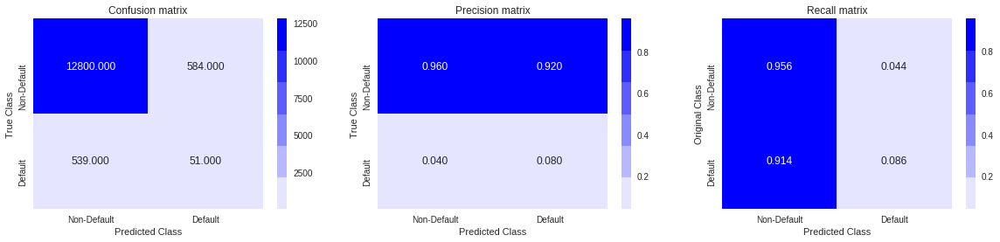

--------------------------------------------------------------- CUTOFF - DataFrame ------------------------------------------------------------------------
     prob  accuracy  sensi_recall     speci    precis       ppv       npv
0.0   0.0  0.561157      0.999884  0.004193  0.560382  0.560382  0.966102
0.1   0.1  0.960864      0.991675  0.921749  0.941481  0.941481  0.988664
0.2   0.2  0.977039      0.987444  0.963829  0.971955  0.971955  0.983731
0.3   0.3  0.982582      0.983929  0.980873  0.984918  0.984918  0.979623
0.4   0.4  0.984224      0.980452  0.989014  0.991251  0.991251  0.975522
0.5   0.5  0.984397      0.977438  0.993232  0.994575  0.994575  0.971971
0.6   0.6  0.983544      0.973923  0.995758  0.996580  0.996580  0.967823
0.7   0.7  0.982355      0.970465  0.997450  0.997934  0.997934  0.963771
0.8   0.8  0.980335      0.966177  0.998308  0.998622  0.998622  0.958762
0.9   0.9  0.977071      0.959686  0.999142  0.999296  0.999296  0.951274
------------------------------

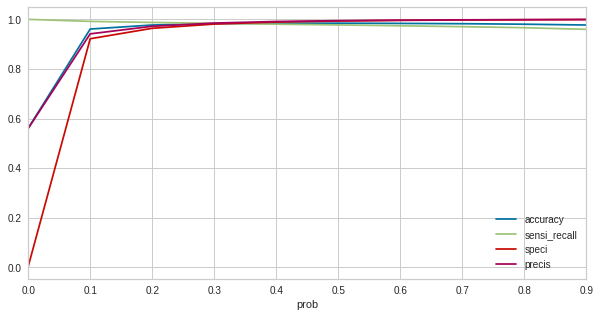

In [0]:
bank_risk_prediction(gsearch5.best_estimator_,X_train_Smote,X_test,y_train_Smote,y_test,
                         X_train.columns,"features",threshold_plot = True)

### Light GBM

In [0]:
params = {'boosting_type': 'gbdt',
          'max_depth' : -1,
          'objective': 'binary',
          'nthread': 3, # Updated from nthread
          'num_leaves': 64,
          'learning_rate': 0.05,
          'max_bin': 512,
          'subsample_for_bin': 200,
          'subsample': 1,
          'subsample_freq': 1,
          'colsample_bytree': 0.8,
          'reg_alpha': 5,
          'reg_lambda': 10,
          'min_split_gain': 0.5,
          'min_child_weight': 1,
          'min_child_samples': 5,
          'scale_pos_weight': 1,
          'num_class' : 1,
          'metric' : 'binary_error'}

In [0]:
# Create parameters to search
gridParams = {
    'learning_rate': [0.005],
    'n_estimators': [50, 100, 150, 200],
    'num_leaves': [6,8,12,16],
    'boosting_type' : ['gbdt'],
    'objective' : ['binary'],
    'random_state' : [501], # Updated from 'seed'
    'colsample_bytree' : [0.65, 0.66],
    'subsample' : [0.7,0.75],
    'reg_alpha' : [1,1.2],
    'reg_lambda' : [1,1.2,1.4],
    }

In [0]:
# Create classifier to use. Note that parameters have to be input manually
# not as a dict!
mdl = lgb.LGBMClassifier(boosting_type= 'gbdt',
          objective = 'binary',
          n_jobs = 3, # Updated from 'nthread'
          silent = True,
          max_depth = params['max_depth'],
          max_bin = params['max_bin'],
          subsample_for_bin = params['subsample_for_bin'],
          subsample = params['subsample'],
          subsample_freq = params['subsample_freq'],
          min_split_gain = params['min_split_gain'],
          min_child_weight = params['min_child_weight'],
          min_child_samples = params['min_child_samples'],
          scale_pos_weight = params['scale_pos_weight'])

In [0]:
# To view the default model params:
mdl.get_params().keys()

# Create the grid
grid = GridSearchCV(mdl, gridParams,
                    verbose=0,
                    cv=4,
                    n_jobs=2)

# Run the grid
grid.fit(X_train_Smote, y_train_Smote)

# Print the best parameters found
print(grid.best_params_)
print(grid.best_score_)

{'boosting_type': 'gbdt', 'colsample_bytree': 0.65, 'learning_rate': 0.005, 'n_estimators': 200, 'num_leaves': 16, 'objective': 'binary', 'random_state': 501, 'reg_alpha': 1, 'reg_lambda': 1, 'subsample': 0.7}
0.8411851147512642


In [0]:
# Using parameters already set above, replace in the best from the grid search
params['colsample_bytree'] = grid.best_params_['colsample_bytree']
params['learning_rate'] = grid.best_params_['learning_rate']
# params['max_bin'] = grid.best_params_['max_bin']
params['num_leaves'] = grid.best_params_['num_leaves']
params['reg_alpha'] = grid.best_params_['reg_alpha']
params['reg_lambda'] = grid.best_params_['reg_lambda']
params['subsample'] = grid.best_params_['subsample']

In [0]:
# Manual entering the best param
params = {'boosting_type': 'gbdt',
          'max_depth' : -1,
          'objective': 'binary',
          'nthread': 3, # Updated from nthread
          'num_leaves': 16,
          'learning_rate': 0.005,
          'max_bin': 512,
          'subsample_for_bin': 200,
          'subsample': 0.7,
          'subsample_freq': 1,
          'colsample_bytree': 0.65,
          'reg_alpha': 1,
          'reg_lambda': 1,
          'min_split_gain': 0.5,
          'min_child_weight': 1,
          'min_child_samples': 5,
          'scale_pos_weight': 1,
          'num_class' : 1,
          'metric' : 'binary_error'}

Training until validation scores don't improve for 50 rounds.
[4]	training's binary_error: 0.440625	valid_1's binary_error: 0.957779
[8]	training's binary_error: 0.440625	valid_1's binary_error: 0.957779
[12]	training's binary_error: 0.440625	valid_1's binary_error: 0.957779
[16]	training's binary_error: 0.440625	valid_1's binary_error: 0.957779
[20]	training's binary_error: 0.440625	valid_1's binary_error: 0.957779
[24]	training's binary_error: 0.440625	valid_1's binary_error: 0.957779
[28]	training's binary_error: 0.440625	valid_1's binary_error: 0.957779
[32]	training's binary_error: 0.41787	valid_1's binary_error: 0.913196
[36]	training's binary_error: 0.409063	valid_1's binary_error: 0.896021
[40]	training's binary_error: 0.403736	valid_1's binary_error: 0.8845
[44]	training's binary_error: 0.358009	valid_1's binary_error: 0.789395
[48]	training's binary_error: 0.322071	valid_1's binary_error: 0.690425
[52]	training's binary_error: 0.300406	valid_1's binary_error: 0.638686
[56]	tr

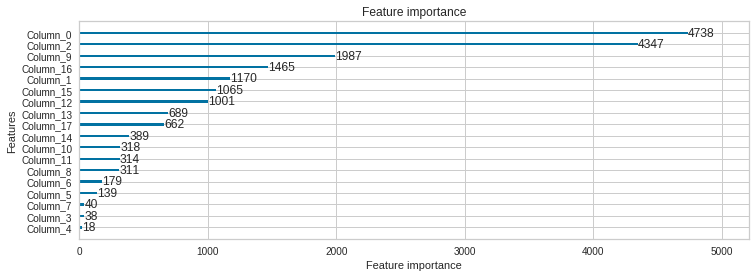

Area under curve (testset):  0.5028294599167231 



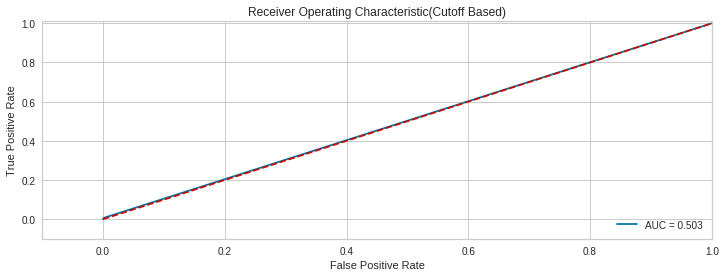

------------------------------------------------------------------------------------------------------------------------------------------------------
Confussion Matrix Train : [[40743    36]
 [ 5034 46735]]
Confussion Matrix Train : [[13369    15]
 [  586     4]]
Accuracy Score Train : 0.945217616804253
Accuracy Score Test : 0.9569915557463862
--------------------------------------------------------------- CUTOFF - DataFrame ------------------------------------------------------------------------
     prob  accuracy  sensi_recall     speci    precis       ppv       npv
0.0   0.0  0.559375      1.000000  0.000000  0.559375  0.559375       NaN
0.1   0.1  0.643612      0.996446  0.195689  0.611313  0.611313  0.977462
0.2   0.2  0.864762      0.966524  0.735575  0.822703  0.822703  0.945381
0.3   0.3  0.936228      0.938090  0.933863  0.947387  0.947387  0.922373
0.4   0.4  0.948232      0.920667  0.983227  0.985852  0.985852  0.907086
0.5   0.5  0.945218      0.902760  0.999117  0.999230

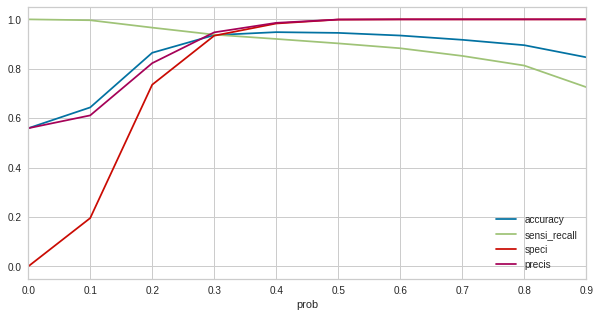

In [0]:
# Train
d_train = lgb.Dataset(X_train_Smote, label=y_train_Smote)
valid_sets = lgb.Dataset(X_test, label=y_test)


gbm = lgb.train(params,
            d_train,
            100000,
            valid_sets=[d_train, valid_sets],
            early_stopping_rounds=50,
            verbose_eval=4)

# Plot importance
lgb.plot_importance(gbm)
plt.show()

#Prediction Train
predsTrain_prob = gbm.predict(X_train_Smote)
predsTrain = gbm.predict(X_train_Smote)
# convert into binary values
for i in range(0,X_train_Smote.shape[0]):
    if predsTrain[i]>=.5:       # setting threshold to .5
       predsTrain[i]=1
    else:  
       predsTrain[i]=0

#Prediction Test
predsTest_prob = gbm.predict(X_test)
predsTest = gbm.predict(X_test)
# convert into binary values
for i in range(0,X_test.shape[0]):
    if predsTest[i]>=.5:       # setting threshold to .5
       predsTest[i]=1
    else:  
       predsTest[i]=0



#### Printing the ROC Curve for test Data
#roc_auc_score
model_roc_auc = roc_auc_score(y_test, predsTest) 
print ("Area under curve (testset): ", model_roc_auc,"\n")
fpr,tpr,thresholds = roc_curve(y_test, predsTest)
roc_auc = auc(fpr,tpr)

# Plot ROC
plt.title('Receiver Operating Characteristic(Cutoff Based)')
plt.plot(fpr, tpr, 'b',label='AUC = %0.3f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()
print('-----' *30)




cm_train = confusion_matrix(y_train_Smote, predsTrain)
print('Confussion Matrix Train :', cm_train)

cm_test = confusion_matrix(y_test, predsTest)
print('Confussion Matrix Train :', cm_test)

print('Accuracy Score Train :', accuracy_score(predsTrain, y_train_Smote))

print('Accuracy Score Test :', accuracy_score(predsTest, y_test))





# Calculations and plot of intersection of Sensitivity and Specificity

y_train_pred = pd.DataFrame({'Predicted' : predsTrain, 'Actual' : y_train_Smote, 'probabilities' : predsTrain_prob})
# Finding optimal proba Cutoff
# creating columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred[i]= y_train_pred.probabilities.map(lambda x: 1 if x > i else 0)
# y_train_pred.head()
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi_recall','speci','precis','ppv','npv'])
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
  cm1 = metrics.confusion_matrix(y_train_pred.Actual, y_train_pred[i] )
  if cm1.shape != (2,2):
    l = [100,0,0,0]
    cm1 = np.reshape(l, (2,2))
  total1=sum(sum(cm1))
  accuracy = (cm1[0,0]+cm1[1,1])/total1
  speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
  sensi_recall = cm1[1,1]/(cm1[1,0]+cm1[1,1])
  precis = cm1[1,1]/(cm1[0,1]+cm1[1,1])
  ppv = cm1[1,1] /(cm1[1,1]+cm1[0,1])
  npv = cm1[0,0]/(cm1[0,0]+cm1[1,0])
  cutoff_df.loc[i] =[ i ,accuracy,sensi_recall,speci,precis,ppv,npv]
print('---------'*7,'CUTOFF - DataFrame', '---------'*8)
print(cutoff_df)
print('---------'*30)
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi_recall','speci', 'precis'],figsize=(10, 5))
plt.show()

* Prediction based on Cutoff of 0.3

Area under curve (testset):  0.5615804856798404 



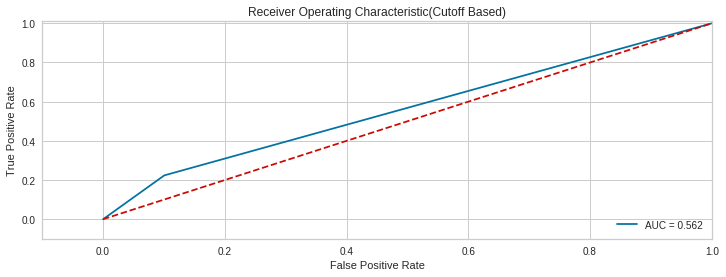

------------------------------------------------------------------------------------------------------------------------------------------------------
Confussion Matrix Train : [[12038  1346]
 [  458   132]]
Accuracy Score Test : 0.8709031057678546


In [0]:
#Prediction Test
# predsTest_prob = gbm.predict(X_test)
predsTest = gbm.predict(X_test)
# convert into binary values
for i in range(0,X_test.shape[0]):
    if predsTest[i]>=.3:       # setting threshold to .5
       predsTest[i]=1
    else:  
       predsTest[i]=0



#### Printing the ROC Curve for test Data
#roc_auc_score
model_roc_auc = roc_auc_score(y_test, predsTest) 
print ("Area under curve (testset): ", model_roc_auc,"\n")
fpr,tpr,thresholds = roc_curve(y_test, predsTest)
roc_auc = auc(fpr,tpr)

# Plot ROC
plt.title('Receiver Operating Characteristic(Cutoff Based)')
plt.plot(fpr, tpr, 'b',label='AUC = %0.3f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.1,1.0])
plt.ylim([-0.1,1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()
print('-----' *30)



# cm_train = confusion_matrix(y_train_Smote, predsTrain)
# print('Confussion Matrix Train :', cm_train)

cm_test = confusion_matrix(y_test, predsTest)
print('Confussion Matrix Train :', cm_test)

# print('Accuracy Score Train :', accuracy_score(predsTrain, y_train_Smote))

print('Accuracy Score Test :', accuracy_score(predsTest, y_test))

# Final Model Comparision

In [0]:
result = pd.DataFrame()

In [0]:
result['Model'] = ['Logistic_Regression_Demographic', 'Decision_trees_Demographic', 'RandomForest_Demographic', 'Logistic_Regression_Combined', 'Decision_trees_Combined', 'RandomForest_Combined', 'Gradient_Boosting_Combined', 'Light_GBM_Combined']

result['test_auc'] = [0.56,0.52,0.56,0.64,0.52,0.61,0.52,0.56]

result['train_sensitivity'] = [0.65,0.94,0.84,0.69,0.89,0.75,'NA','NA']
result['test_sensitivity'] = [0.44,0.47,0.40,0.68,0.1,0.48,'NA','NA']
result['delta_data_sensitivity'] = [0.55,0.58,0.62,1.0,0.27,0.8,'NA','NA']

result['train_specificity'] = [0.68,0.94,0.86,0.67,0.96,0.79,'NA','NA']
result['test_specificity'] = [0.69,0.57,0.71,0.6,0.95,0.73,'NA','NA']
result['delta_data_specificity'] = [0,0,0,0,0,0,'NA','NA']

result['delta_data_misclassifications'] = [636,594,535,1,1045,288,'NA','NA']


In [0]:
result

,Model,test_auc,train_sensitivity,test_sensitivity,delta_data_sensitivity,train_specificity,test_specificity,delta_data_specificity,delta_data_misclassifications
0,Logistic_Regression_Demographic,0.56,0.65,0.44,0.55,0.68,0.69,0,636
1,Decision_trees_Demographic,0.52,0.94,0.47,0.58,0.94,0.57,0,594
2,RandomForest_Demographic,0.56,0.84,0.4,0.62,0.86,0.71,0,535
3,Logistic_Regression_Combined,0.64,0.69,0.68,1,0.67,0.6,0,1
4,Decision_trees_Combined,0.52,0.89,0.1,0.27,0.96,0.95,0,1045
5,RandomForest_Combined,0.61,0.75,0.48,0.8,0.79,0.73,0,288
6,Gradient_Boosting_Combined,0.52,NA,NA,NA,NA,NA,NA,NA
7,Light_GBM_Combined,0.56,NA,NA,NA,NA,NA,NA,NA


* **Summary**
  * In the above Dataframe, NA means the data was not calculated if it performed poor in the initial model assessment.
  * We can see that Logistic Regression on combined dataset performed best among the list of models with the highest AUC score of 64% and a very balanced sensitivity and specificity on both test and train dataset. Recall on the Delta dataset is also 100% with just 1 misclassification out of total 1425 applicants. 
  * Second best is Random Forest Model with an AUC score of 61%. A total of 288 applicants were misclassified by RF model on the delta dataset.

# Application ScoreCard

In [0]:
master_df.head(5)

,Income,No_of_months_in_current_residence,No_of_months_in_current_company,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,No_of_times_30_DPD_or_worse_in_last_12_months,Avgas_CC_Utilization_in_last_12_months,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans,No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans,Outstanding_Balance,Total_No_of_Trades,Performance_Tag
0,-0.273218,-0.069491,-0.229240,-0.261032,-0.336701,-0.387125,-0.356987,-0.352253,-0.376727,-0.703240,-0.543589,-0.816823,-0.649533,-0.686829,-0.319542,-0.828596,-0.843135,-0.448207,0.0
1,-0.385850,-0.069491,-0.145849,-0.261032,-0.336701,-0.387125,-0.356987,-0.352253,-0.376727,-0.703240,-0.543589,-0.816823,-0.649533,-0.686829,-0.319542,-0.828596,-0.745927,-0.049155,0.0
2,-0.169700,-0.069491,-0.255198,-0.261032,-0.336701,-0.387125,-0.356987,-0.352253,-0.376727,-0.778815,-0.543589,-0.894245,-0.649533,-0.686829,-0.319542,-0.828596,-0.843135,-0.878040,0.0
3,-0.385850,0.121151,-0.255198,-0.261032,-0.336701,-0.387125,-0.356987,-0.352253,-0.376727,-0.616822,-0.543589,-0.894245,-0.649533,-0.686829,-0.319542,-0.828596,0.296845,-0.448207,0.0
4,-0.169700,-0.069491,-0.145849,-0.261032,-0.336701,-0.387125,-0.356987,-0.352253,-0.376727,-0.468356,-0.543589,-0.894245,-0.649533,-0.686829,-0.319542,-0.828596,-0.843135,-0.448207,0.0


In [0]:
coefficient = pd.DataFrame({'Variables': X_test.columns, 'Coef': np.transpose(logit.coef_[0])})

In [0]:
coefficient = coefficient.set_index('Variables')

In [0]:
coefficient

,Coef
Variables,
Income,0.231020
No_of_months_in_current_residence,-0.010488
No_of_months_in_current_company,0.304677
No_of_times_90_DPD_or_worse_in_last_6_months,-0.254863
No_of_times_60_DPD_or_worse_in_last_6_months,0.203065
No_of_times_30_DPD_or_worse_in_last_6_months,0.404049
No_of_times_90_DPD_or_worse_in_last_12_months,0.210787
No_of_times_60_DPD_or_worse_in_last_12_months,-0.130028
No_of_times_30_DPD_or_worse_in_last_12_months,0.178337


In [0]:
print(coefficient.shape)
print(master_df.shape)

(18, 1)
(69867, 19)


In [0]:
def score(coefficient_df,new_applicants,intercept,cutoff_score=False):
  score_df = new_applicants[coefficient_df.index].apply(lambda x:x*coefficient_df['Coef'], axis=1)
  score_df['logodds'] = score_df.sum(axis=1) + intercept
  score_df['odds'] = np.exp(score_df['logodds'])
  score_df['probs'] = score_df['odds'] / (score_df['odds'] + 1)
  target = 400
  odds = 10
  doubleOdds = 20
  factor = doubleOdds / np.log(2)
  offset = target - (factor * np.log(odds))
  score_df['score'] = offset - (factor * score_df['logodds'])
  score_df['Performance_Tag'] = new_applicants['Performance_Tag']
  score_df['score'] = round(score_df['score'], 2)
  if cutoff_score != False:
    score_df['by_cutoff'] = 0
    score_df.loc[score_df['score'] <= cutoff_score, 'by_cutoff'] = 1
  return score_df

In [0]:
score_masterdf = score(coefficient,master_df,logit.intercept_)

In [0]:
score_masterdf.head(5)

,Income,No_of_months_in_current_residence,No_of_months_in_current_company,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,No_of_times_30_DPD_or_worse_in_last_12_months,Avgas_CC_Utilization_in_last_12_months,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans,No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans,Outstanding_Balance,Total_No_of_Trades,logodds,odds,probs,score,Performance_Tag
0,-0.063119,0.000729,-0.069844,0.066527,-0.068372,-0.156418,-0.075248,0.045803,-0.067185,-0.402114,0.007972,-0.262642,-0.117985,-0.000338,0.044466,-0.312031,-0.138846,0.045204,-1.223935,0.294071,0.227245,368.88,0.0
1,-0.089139,0.000729,-0.044437,0.066527,-0.068372,-0.156418,-0.075248,0.045803,-0.067185,-0.402114,0.007972,-0.262642,-0.117985,-0.000338,0.044466,-0.312031,-0.122838,0.004958,-1.248787,0.286853,0.222910,369.59,0.0
2,-0.039204,0.000729,-0.077753,0.066527,-0.068372,-0.156418,-0.075248,0.045803,-0.067185,-0.445328,0.007972,-0.287537,-0.117985,-0.000338,0.044466,-0.312031,-0.138846,0.088555,-1.232687,0.291508,0.225711,369.13,0.0
3,-0.089139,-0.001271,-0.077753,0.066527,-0.068372,-0.156418,-0.075248,0.045803,-0.067185,-0.352700,0.007972,-0.287537,-0.117985,-0.000338,0.044466,-0.312031,0.048884,0.045204,-1.047614,0.350774,0.259684,363.79,0.0
4,-0.039204,0.000729,-0.044437,0.066527,-0.068372,-0.156418,-0.075248,0.045803,-0.067185,-0.267807,0.007972,-0.287537,-0.117985,-0.000338,0.044466,-0.312031,-0.138846,0.045204,-1.065201,0.344659,0.256317,364.30,0.0


Text(0, 0.5, 'count')

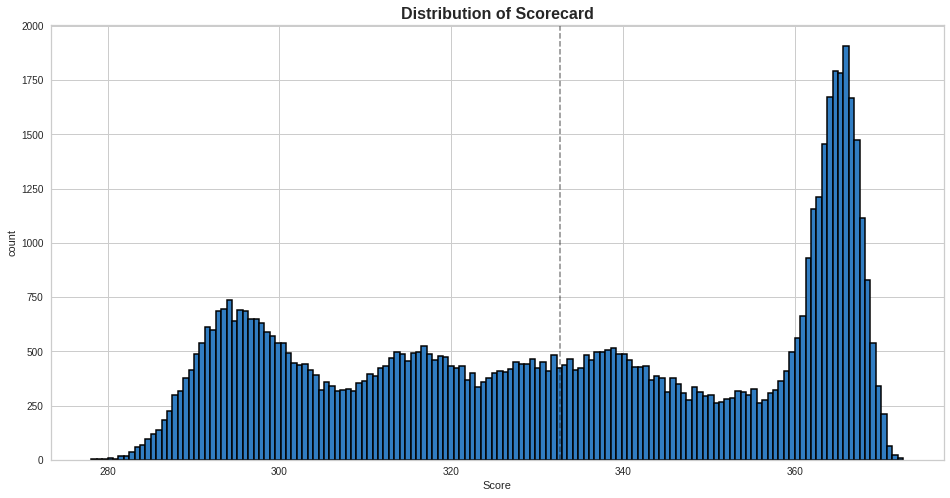

In [0]:
### Plot the Distribution of Final Scorecard with a CutOff Score 
plt.figure(figsize=(16, 8))

plt.hist(score_masterdf['score'],bins=150, edgecolor='black', color='#317DC2', linewidth=1.5)

plt.title('Distribution of Scorecard', fontweight='bold', fontsize=16)
plt.axvline(score_masterdf['score'].mean(), color='k', linestyle='dashed', linewidth=1.5, alpha=0.5)
plt.xlabel('Score')
plt.ylabel('count')

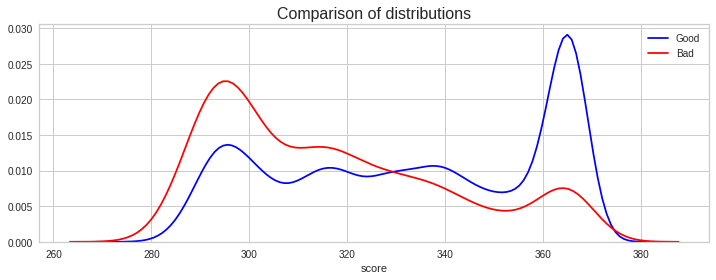

In [0]:
fig, ax = plt.subplots(1,1, figsize=(12,4))
sns.distplot(score_masterdf.loc[score_masterdf.Performance_Tag == 0, 'score'], hist=False, kde=True, color='blue', label='Good', ax=ax)
sns.distplot(score_masterdf.loc[score_masterdf.Performance_Tag == 1, 'score'], hist=False, kde=True, color='red', label='Bad', ax=ax)
plt.title('Comparison of distributions', fontsize=16)
plt.legend();
plt.show()

In [0]:
print("Final Cutoff Score is: ",score_masterdf['score'].mean())

Final Cutoff Score is:  332.6752581333119


In [0]:
### Max and Min Score of Approved Candidate
print("Max Score is: ", score_masterdf.score.max())
print("Min Score is: ", score_masterdf.score.min())

Max Score is:  372.6
Min Score is:  278.09


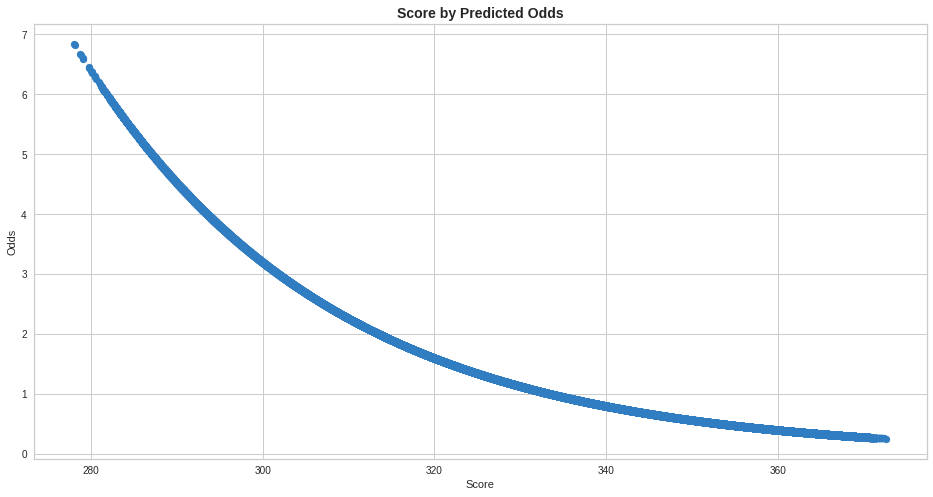

In [0]:
# Plot Scores Against Predicted Odds (Exponential Relationship)
plt.figure(figsize=(16,8))

plt.scatter(x='score',
            y='odds',
            data=score_masterdf,
            color='#317DC2')

plt.title('Score by Predicted Odds', fontweight="bold", fontsize=14)
plt.xlabel('Score')
plt.ylabel('Odds');

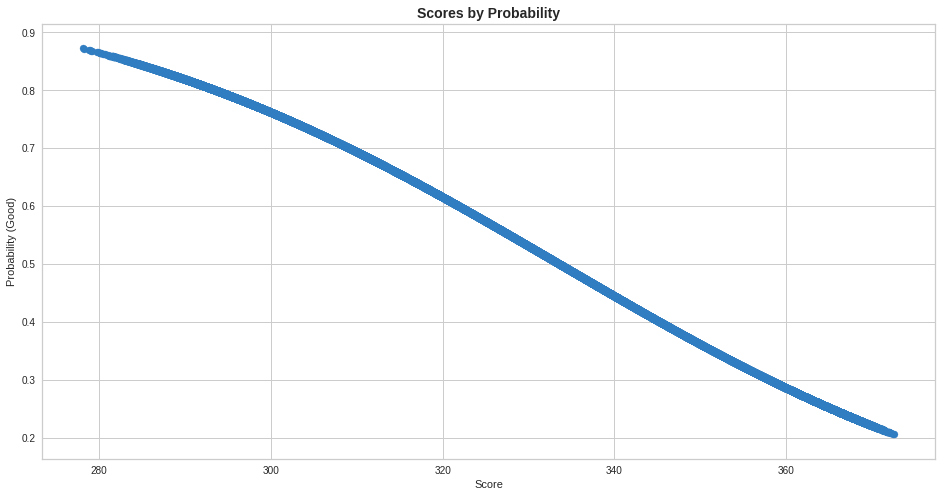

In [0]:
# Plot Scores Against Probabilities
plt.figure(figsize=(16,8))

plt.scatter(x='score',
            y='probs',
            data=score_masterdf,
            color='#317DC2')

plt.title('Scores by Probability', fontweight="bold", fontsize=14)
plt.xlabel('Score')
plt.ylabel('Probability (Good)');

* Filtering out Approved applicant

In [0]:
score_masterdf.groupby('Performance_Tag').agg({'Performance_Tag':'count', 'score': ['median','mean','min','max']})

Performance_Tag   score                            
                          count  median        mean     min     max
Performance_Tag                                                    
0.0                       66919  334.97  333.373637  278.09  372.60
1.0                        2948  312.14  316.822198  278.88  372.15

In [0]:
score_masterdf = score(coefficient,master_df,logit.intercept_,333)

In [0]:
score_masterdf.head(5)

,Income,No_of_months_in_current_residence,No_of_months_in_current_company,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,No_of_times_30_DPD_or_worse_in_last_12_months,Avgas_CC_Utilization_in_last_12_months,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans,No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans,Outstanding_Balance,Total_No_of_Trades,logodds,odds,probs,score,Performance_Tag,by_cutoff
0,-0.063119,0.000729,-0.069844,0.066527,-0.068372,-0.156418,-0.075248,0.045803,-0.067185,-0.402114,0.007972,-0.262642,-0.117985,-0.000338,0.044466,-0.312031,-0.138846,0.045204,-1.223935,0.294071,0.227245,368.88,0.0,0
1,-0.089139,0.000729,-0.044437,0.066527,-0.068372,-0.156418,-0.075248,0.045803,-0.067185,-0.402114,0.007972,-0.262642,-0.117985,-0.000338,0.044466,-0.312031,-0.122838,0.004958,-1.248787,0.286853,0.222910,369.59,0.0,0
2,-0.039204,0.000729,-0.077753,0.066527,-0.068372,-0.156418,-0.075248,0.045803,-0.067185,-0.445328,0.007972,-0.287537,-0.117985,-0.000338,0.044466,-0.312031,-0.138846,0.088555,-1.232687,0.291508,0.225711,369.13,0.0,0
3,-0.089139,-0.001271,-0.077753,0.066527,-0.068372,-0.156418,-0.075248,0.045803,-0.067185,-0.352700,0.007972,-0.287537,-0.117985,-0.000338,0.044466,-0.312031,0.048884,0.045204,-1.047614,0.350774,0.259684,363.79,0.0,0
4,-0.039204,0.000729,-0.044437,0.066527,-0.068372,-0.156418,-0.075248,0.045803,-0.067185,-0.267807,0.007972,-0.287537,-0.117985,-0.000338,0.044466,-0.312031,-0.138846,0.045204,-1.065201,0.344659,0.256317,364.30,0.0,0


In [0]:
score_masterdf.by_cutoff.value_counts()

0    35517
1    34350
Name: by_cutoff, dtype: int64

In [0]:
score_masterdf.Performance_Tag.value_counts()

0.0    66919
1.0     2948
Name: Performance_Tag, dtype: int64

* **Filtering on the Delta Dataset with a cutoff of 333**

In [0]:
master_delta_df.Performance_Tag = 1

In [0]:
master_delta_df.head(5)

,Income,No_of_months_in_current_residence,No_of_months_in_current_company,No_of_times_90_DPD_or_worse_in_last_6_months,No_of_times_60_DPD_or_worse_in_last_6_months,No_of_times_30_DPD_or_worse_in_last_6_months,No_of_times_90_DPD_or_worse_in_last_12_months,No_of_times_60_DPD_or_worse_in_last_12_months,No_of_times_30_DPD_or_worse_in_last_12_months,Avgas_CC_Utilization_in_last_12_months,No_of_trades_opened_in_last_6_months,No_of_trades_opened_in_last_12_months,No_of_PL_trades_opened_in_last_6_months,No_of_PL_trades_opened_in_last_12_months,No_of_Inquiries_in_last_6_months_excluding_home_&_auto_loans,No_of_Inquiries_in_last_12_months_excluding_home_&_auto_loans,Outstanding_Balance,Total_No_of_Trades,Performance_Tag
0,0.352682,0.472881,0.196433,-0.261032,-0.336701,0.666479,0.508469,0.614256,0.738098,0.474692,0.523923,0.403087,0.423261,0.100597,0.215660,0.247751,0.395372,0.375602,1
1,0.078752,-0.069491,0.000570,0.587564,0.542216,0.465571,0.885199,0.614256,0.593976,-0.079207,0.434656,0.575286,0.423261,0.499721,0.554584,0.588045,0.444145,0.296139,1
2,0.139283,-0.253229,-0.068801,1.037494,0.867024,1.045826,0.885199,0.814231,0.936896,0.362502,0.234160,0.575286,0.438081,0.499721,-0.319542,0.166250,0.436830,0.512261,1
3,0.115591,-0.253229,-0.145849,0.587564,0.933424,0.951435,0.885199,0.884177,0.972425,0.362502,0.234160,0.575286,0.200454,0.499721,0.328515,0.588045,0.444145,0.512261,1
4,0.078752,-0.253229,-0.255198,0.809821,0.668121,0.951435,0.885199,0.614256,0.936896,0.568478,0.434656,0.575286,0.438081,0.413912,0.554584,0.509670,0.444145,0.296139,1


In [0]:
delta_score_df = score(coefficient,master_delta_df,logit.intercept_,333)

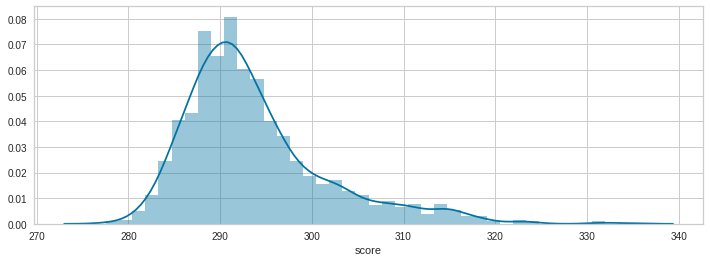

In [0]:
sns.distplot(delta_score_df['score'])

* We can see that majority of the rejected applicants from the delta records have a score between 290 - 292

In [0]:
# Counting how many applicants were successfully identified as Defaulters.
print('Defaulters count: ', delta_score_df.by_cutoff.sum())

Defaulters count:  1424


* Above count of 1424 alligns well with our logistic Rgeression model. We are just missclasified 1 applicant.

# Financial Benefits of the Model

### Financial Losses without model

* A total of 71292 applications are available for issuing credit cards.
* 1425 applications were rejected by the bank.
* Number of people defaulted on their payments are 2948.


* Assumptions: 
          * Consider cost of acqusitions to be approx 500 INR.
          * Approx Credit loss on principal from each applicants is 19500 INR.
* Total loss incurred would be (20000 * 2948) that is 58960000 INR.

### Financial Benefits of Model

* We have a recall rate of 68% hence we can straight away save 68% of the total losses that was incurred initially in decision making process without the use of Model; which is approx 40092800 INR
* Losses after using Model (58960000 - 40092800) is 18867200 INR, which is substantially lower than the initial losses.